# Setup and Imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install openpyxl

In [ ]:
!pip install xlsxwriter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 2.7 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import pandas as pd
import tensorflow as tf
import cv2
import xlsxwriter
import pywt

from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import GRU
from keras.layers import Flatten
from keras.layers import Conv1D
from keras.layers import MaxPooling1D
from keras import backend as K
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Define functions

In [ ]:
# rmspe metric
def rmspe(y_true, y_pred):
    return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))

In [ ]:
# smape metric
def smape(y_true, y_pred):
    return 100 * K.mean(K.abs((y_pred - y_true)) / (K.abs(y_true) + K.abs(y_pred)))

In [ ]:
# create model
def create_model(model_type, n_steps, n_features, output_AF):
  model = Sequential()
  if(model_type == 0):
    model.add(Conv1D(filters=64, kernel_size=3, activation="relu", input_shape=(n_steps, n_features)))
    model.add(Conv1D(filters=128, kernel_size=1, activation="relu", input_shape=(n_steps, n_features)))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
  if(model_type == 1):
    model.add(Conv1D(filters=64, kernel_size=3, activation="relu", input_shape=(n_steps, n_features)))
    model.add(GRU(128, input_shape=(3, n_features)))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
  if(model_type == 2):
    model.add(Conv1D(filters=64, kernel_size=3, activation="relu", input_shape=(n_steps, n_features)))
    model.add(LSTM(128, input_shape=(3, n_features)))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(32, activation='relu'))
  if(output_AF == 1):
    model.add(Dense(1, activation='sigmoid'))
  elif(output_AF == 2):
    model.add(Dense(1, activation='tanh'))
  else:
    model.add(Dense(1))
  model.compile(optimizer='adam', loss='mse', metrics=['mse', 'mae', tf.keras.metrics.RootMeanSquaredError(name='rmse'), rmspe, 'mape', smape])
  return model

In [ ]:
# split a multivariate sequence into samples
def split_sequences(sequences, n_steps):
	X, y = list(), list()
	for i in range(len(sequences)):
		# find the end of this pattern
		end_ix = i + n_steps
		# check if we are beyond the dataset
		if end_ix >= len(sequences):
			break
		# gather input and output parts of the pattern
		seq_x, seq_y = sequences[i:end_ix, :-1], sequences[end_ix, -1]
		X.append(seq_x)
		y.append(seq_y)
	return array(X), array(y)

In [ ]:
# predict all
def predict_all(model, X_test):
  preds = list()
  for x in X_test:
    x = x.reshape((1, n_steps, n_features))
    preds.extend(model.predict(x, verbose=0)[0])
  return preds

In [ ]:
# evaluate model
def get_metrics(truth, preds):
  mse_score = tf.keras.metrics.mean_squared_error(truth, preds)
  mae_score = tf.keras.metrics.mean_absolute_error(truth, preds)
  rmse_score = tf.keras.metrics.RootMeanSquaredError()
  rmse_score.update_state(truth, preds)
  rmspe_score = rmspe(truth, preds)
  mape_score = tf.keras.metrics.mean_absolute_percentage_error(truth, preds)
  smape_score = smape(truth, preds)
  return [mse_score.numpy(), mae_score.numpy(), rmse_score.result().numpy(), rmspe_score.numpy(), mape_score.numpy(), smape_score.numpy()]

In [ ]:
def plot_train_results(history):
  plt.title('MSE')
  plt.plot(history.history['mse'])
  plt.legend(['MSE'])
  plt.xlabel('Epoch')
  plt.ylabel('LC units (normalized)')
  plt.show()

  plt.title('MAE')
  plt.plot(history.history['mae'])
  plt.legend(['MAE'])
  plt.xlabel('Epoch')
  plt.ylabel('LC units (normalized)')
  plt.show()

  plt.title('RMSE')
  plt.plot(history.history['rmse'])
  plt.legend(['RMSE'])
  plt.xlabel('Epoch')
  plt.ylabel('LC units (normalized)')
  plt.show()

  plt.title('RMSPE')
  plt.plot(history.history['rmspe'])
  plt.legend(['RMSPE'])
  plt.xlabel('Epoch')
  plt.ylabel('Percent (%)')
  plt.show()

  plt.title('MAPE')
  plt.plot(history.history['mape'])
  plt.legend(['MAPE'])
  plt.xlabel('Epoch')
  plt.ylabel('Percent (%)')
  plt.show()

  plt.title('SMAPE')
  plt.plot(history.history['smape'])
  plt.legend(['SMAPE'])
  plt.xlabel('Epoch')
  plt.ylabel('Percent (%)')
  plt.show()

In [ ]:
def get_wave(data, wavelet, num_level, mode):
  return pywt.wavedec(data, wavelet, level = num_level, mode = mode)

In [ ]:
def inverse_wt(preds_cA_wt, preds_cD_wt, wavelet, mode):
  preds_wt = (np.array(preds_cA_wt), np.array(preds_cD_wt))
  return (pywt.waverec(preds_wt, wavelet, mode))

In [ ]:
def process_data(data, n_steps):
  # convert to [rows, columns] structure
  for idx, item in enumerate(data):
    data[idx] = item.reshape((len(item), 1))
  # horizontally stack columns
  dataset = hstack(data)
  # convert into input/output
  X, y = split_sequences(dataset, n_steps)
  print(X.shape, y.shape)
  # return
  return X, y

# Set parameters

In [ ]:
#Select model
#0 = CNN; 1 = CNN/GRU; 2 = CNN/LSTM
model_type = 2

In [ ]:
# choose a number of time steps
n_steps = 7

In [ ]:
# create scaler
scaler = MinMaxScaler()

In [ ]:
result_list = []

In [ ]:
# Output AF
output_AF = 1

In [ ]:
num_epoch = 2000

In [ ]:
nums = ["0", "1", "2-1", "2-2", "3-1-1", "3-1-2", "3-2-1", "3-2-2", "3-3-1", "3-3-2", "3-4-1", "3-4-2", "4-1", "4-2", "5-1-1", "5-1-2", "5-2-1", "5-2-2", "5-3-1", "5-3-2", "5-4-1", "5-4-2"]

# ***DB0***

## Data

### Get data

In [ ]:
num = nums[0]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"LC"]).array

print(lc)

<PandasArray>
[3.65047827854631e-05, 3.78712167450439e-05, 3.82285383350952e-05,
 3.91848489187851e-05, 9.11372096614223e-05, 4.07982877855985e-05,
 4.16810933765463e-05, 6.58344640965869e-05, 4.34628292952584e-05,
  0.00013453352162387,
 ...
   0.0001218016460388, 4.03191099120625e-05, 9.95221815552966e-06,
 1.23635787063641e-05, 6.01403356579085e-05, 0.000121505413651136,
 9.66506180038638e-05,  9.7826250593757e-05, 1.40574734822269e-05,
 4.21150780295784e-05]
Length: 485, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[0.0002663224004209042, 0.0002667767403181642, 0.0002702667843550444,
 0.0002657578443177044,  0.000269292009761557, 0.0002664439962245524,
 0.0002851577592082322, 0.0002817261556629092, 0.0002792975574266165,
 0.0002741963253356516, 0.0002754584420472383, 0.0002755770983640105,
  0.000260386586887762, 0.0002824406255967915,  0.000276621023658663,
 0.0002534000086598098, 0.0002633638214319944, 0.0002316768659511581,
 0.0001825935469241813, 4.014893420389853e-05, 5.965049786027521e-05,
 0.0001700739376246929, 0.0001833833375712857, 0.0001656110543990508,
 0.0001794994313968346, 0.0001955566258402541, 0.0002007631555898115,
 0.0002315033198101446, 0.0001426918897777796, 0.0001629334292374551,
 9.097010479308665e-05, 4.810225073015317e-05,  0.000112723748316057,
 0.0001495699398219585, 0.0001497877528890967,  0.000177653317223303,
  0.000174438624526374, 0.0001838714233599603, 0.0001934077736223117,
 0.0001932752638822421, 0.0002102486614603549, 0.0002149258507415652,
 0.000

In [ ]:
len(lc_pred)

97

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(478, 7, 1) (478,)
[[0.11613806]
 [0.12083573]
 [0.12206416]
 [0.12535186]
 [0.30395899]
 [0.13089871]
 [0.13393371]] 0.2169706314988369
[[0.12083573]
 [0.12206416]
 [0.12535186]
 [0.30395899]
 [0.13089871]
 [0.13393371]
 [0.21697063]] 0.14005914167032327
[[0.12206416]
 [0.12535186]
 [0.30395899]
 [0.13089871]
 [0.13393371]
 [0.21697063]
 [0.14005914]] 0.45315126430285263
[[0.12535186]
 [0.30395899]
 [0.13089871]
 [0.13393371]
 [0.21697063]
 [0.14005914]
 [0.45315126]] 0.4204434040032089
[[0.30395899]
 [0.13089871]
 [0.13393371]
 [0.21697063]
 [0.14005914]
 [0.45315126]
 [0.4204434 ]] 0.47354876014706165
[[0.13089871]
 [0.13393371]
 [0.21697063]
 [0.14005914]
 [0.45315126]
 [0.4204434 ]
 [0.47354876]] 0.4266950672090822
[[0.13393371]
 [0.21697063]
 [0.14005914]
 [0.45315126]
 [0.4204434 ]
 [0.47354876]
 [0.42669507]] 0.5021379632134407
[[0.21697063]
 [0.14005914]
 [0.45315126]
 [0.4204434 ]
 [0.47354876]
 [0.42669507]
 [0.50213796]] 0.540687914772234
[[0.14005914]
 [0.45315126]
 [0.420

In [ ]:
X[1][-1]

array([0.21697063])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

382


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.11613806]
 [0.12083573]
 [0.12206416]
 [0.12535186]
 [0.30395899]
 [0.13089871]
 [0.13393371]] 0.2169706314988369
[[0.12083573]
 [0.12206416]
 [0.12535186]
 [0.30395899]
 [0.13089871]
 [0.13393371]
 [0.21697063]] 0.14005914167032327
[[0.12206416]
 [0.12535186]
 [0.30395899]
 [0.13089871]
 [0.13393371]
 [0.21697063]
 [0.14005914]] 0.45315126430285263
[[0.12535186]
 [0.30395899]
 [0.13089871]
 [0.13393371]
 [0.21697063]
 [0.14005914]
 [0.45315126]] 0.4204434040032089
[[0.30395899]
 [0.13089871]
 [0.13393371]
 [0.21697063]
 [0.14005914]
 [0.45315126]
 [0.4204434 ]] 0.47354876014706165
[[0.13089871]
 [0.13393371]
 [0.21697063]
 [0.14005914]
 [0.45315126]
 [0.4204434 ]
 [0.47354876]] 0.4266950672090822
[[0.13393371]
 [0.21697063]
 [0.14005914]
 [0.45315126]
 [0.4204434 ]
 [0.47354876]
 [0.42669507]] 0.5021379632134407
[[0.21697063]
 [0.14005914]
 [0.45315126]
 [0.4204434 ]
 [0.47354876]
 [0.42669507]
 [0.50213796]] 0.540687914772234
[[0.14005914]
 [0.45315126]
 [0.4204434 ]
 [0.47354876

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

382
382
96
96


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
12/12 - 14s - loss: 0.0474 - mse: 0.0474 - mae: 0.1792 - rmse: 0.2177 - rmspe: inf - mape: 1390778.0000 - smape: 21.2891 - 14s/epoch - 1s/step
Epoch 2/2000
12/12 - 0s - loss: 0.0411 - mse: 0.0411 - mae: 0.1631 - rmse: 0.2027 - rmspe: inf - mape: 1406061.7500 - smape: 19.9028 - 68ms/epoch - 6ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0332 - mse: 0.0332 - mae: 0.1448 - rmse: 0.1821 - rmspe: inf - mape: 1377203.2500 - smape: 18.5227 - 71ms/epoch - 6ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0260 - mse: 0.0260 - mae: 0.1277 - rmse: 0.1612 - rmspe: inf - mape: 1233243.0000 - smape: 17.1084 - 65ms/epoch - 5ms/step
Epoch 5/2000
12/12 - 0s - loss: 0.0229 - mse: 0.0229 - mae: 0.1144 - rmse: 0.1515 - rmspe: inf - mape: 997451.0625 - smape: 16.0857 - 70ms/epoch - 6ms/step
Epoch 6/2000
12/12 - 0s - loss: 0.0226 - mse: 0.0226 - mae: 0.1149 - rmse: 0.1502 - rmspe: inf - mape: 1237637.3750 - smape: 16.0464 - 69ms/epoch - 6ms/step
Epoch 7/2000
12/12 - 0s - loss: 0.0221 - mse: 0.0221 - mae: 

### Plot training results

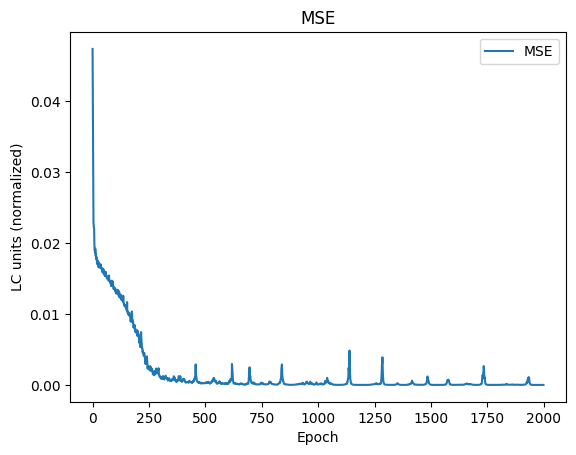

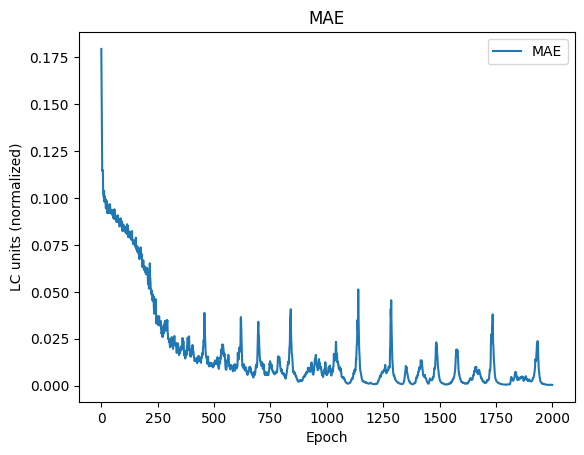

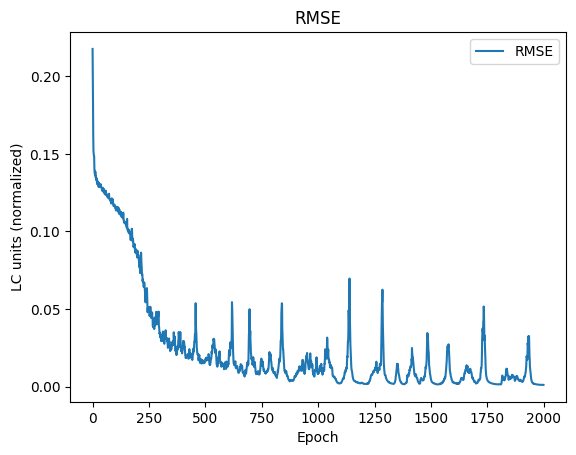

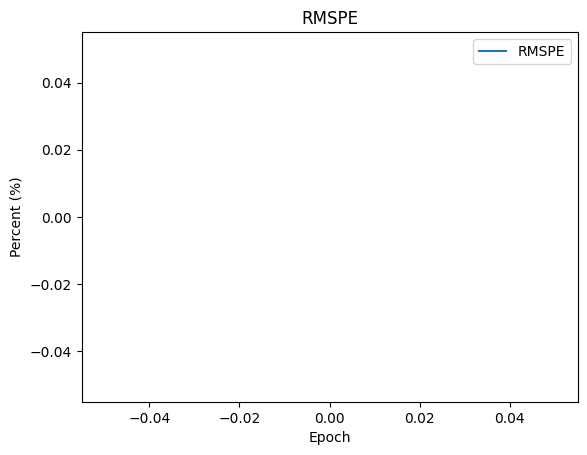

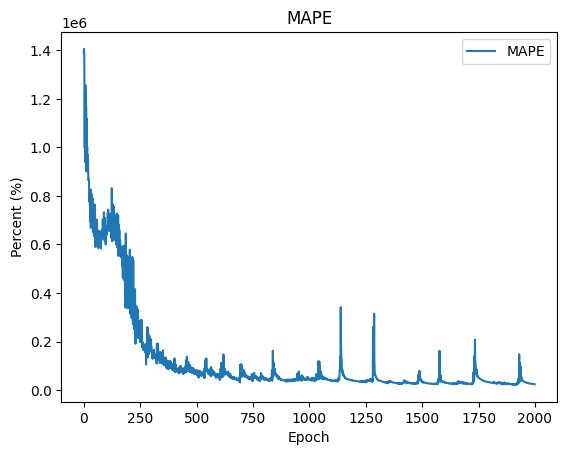

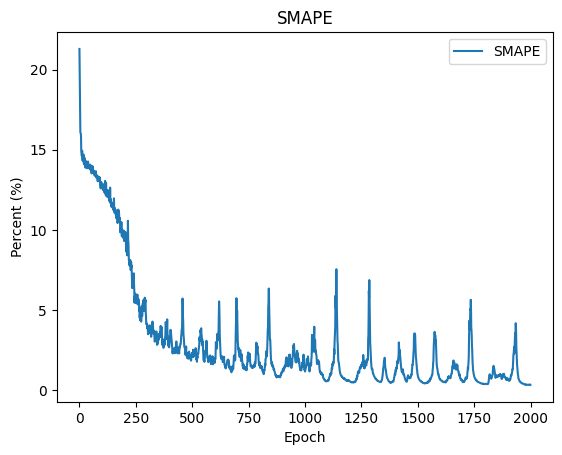

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

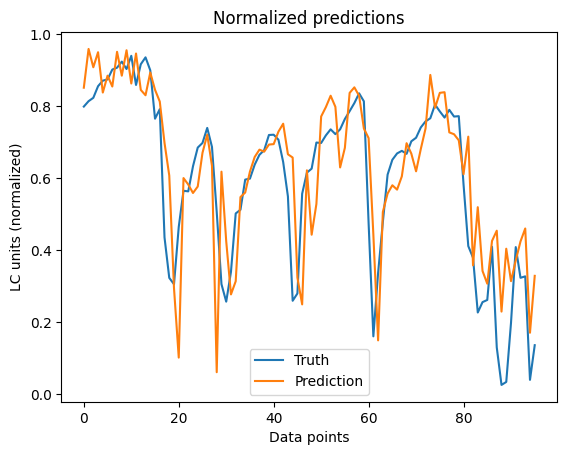

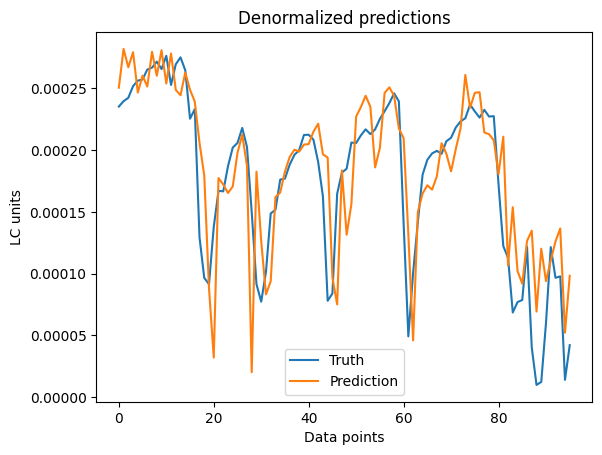

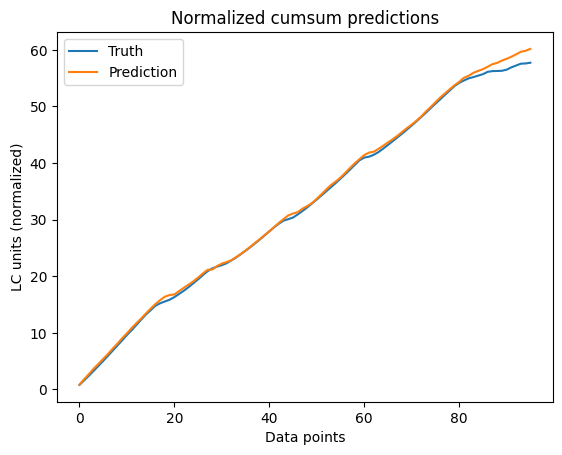

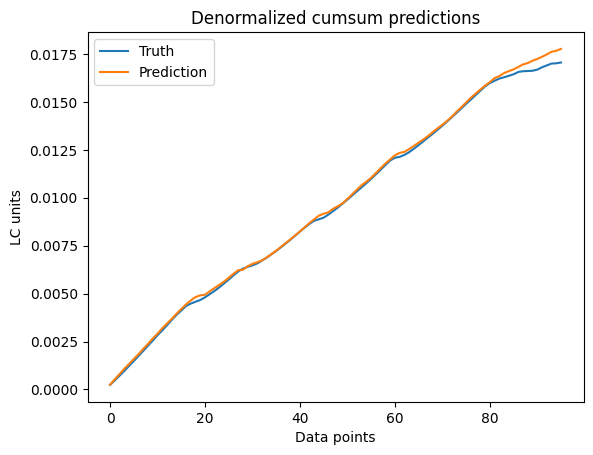

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.02056221, 0.10229852, 0.14339529, 153.56543, 48.53554, 12.845555]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.7397337e-09, 2.9756085e-05, 4.1710115e-05, 120.54456, 42.12297, 12.451272]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.47769627, 0.46497878, 0.69115573, 3.1744547, 2.054431, 1.0030051]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[4.041797e-08, 0.00013525343, 0.00020104222, 3.1370015, 2.0289757, 0.99083585]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

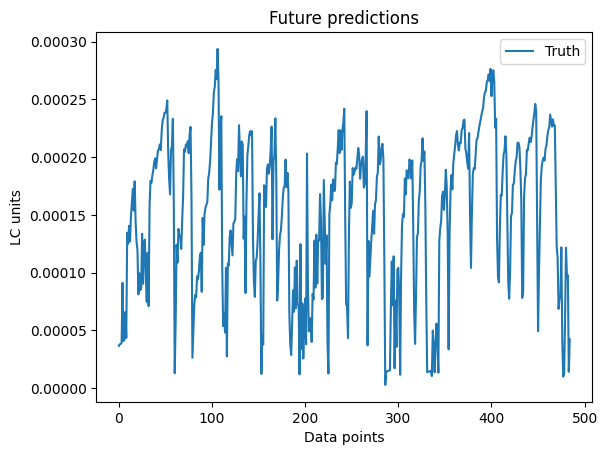

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 88%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 16%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB1***

## Data

### Get data

In [ ]:
num = nums[1]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"LC"]).array

print(lc)

<PandasArray>
[0.000124761937589403, 6.60712411485371e-05, 4.96990719664704e-05,
 0.000123464545663354, 0.000116324127149644, 0.000163677373552329,
 0.000136333753439863, 0.000131087836778851, 0.000154927452489456,
 0.000140534652192943,
 ...
 0.000187738028772655, 9.27892671562061e-05,             8.17e-05,
          0.000193115,           0.00019364,          0.000199674,
          0.000205813,           0.00018306,             4.79e-05,
          0.000127026]
Length: 496, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[0.0002285453083459288, 0.0002374804316787049, 0.0002340030332561582,
 0.0002405084378551692, 0.0002389878500252962, 0.0002416217757854611,
 0.0002636699937283993, 0.0002589099458418787, 0.0002683082711882889,
 0.0002710544213186949, 0.0002656244032550603,  0.000265146343735978,
 0.0002518654509913176, 0.0002743789518717676, 0.0002768667472992092,
 0.0002516514505259693, 0.0002602034946903586,  0.000255146442214027,
  0.000176166751771234, 0.0001893338485388085, 0.0001785346103133634,
 0.0001763735490385443, 0.0002053473144769669,  0.000214302126551047,
 0.0002200981543865055, 0.0002117719413945451, 0.0002170837542507797,
 0.0002192630927311257, 0.0001736572739901021, 0.0001288893836317584,
 0.0001342382311122492, 0.0001878690673038363, 0.0001685822790022939,
 0.0002049220347544178, 0.0002344676468055695, 0.0002230935351690277,
 0.0002358735218876973, 0.0002155138208763674, 0.0002091872593155131,
 0.0002187126810895279, 0.0002322640648344532, 0.0002271838020533323,
 0.000

In [ ]:
len(lc_pred)

99

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(489, 7, 1) (489,)
[[0.32258554]
 [0.10027061]
 [0.03825435]
 [0.31767114]
 [0.2906239 ]
 [0.46999361]
 [0.36641851]] 0.34654746164308436
[[0.10027061]
 [0.03825435]
 [0.31767114]
 [0.2906239 ]
 [0.46999361]
 [0.36641851]
 [0.34654746]] 0.43684972041248804
[[0.03825435]
 [0.31767114]
 [0.2906239 ]
 [0.46999361]
 [0.36641851]
 [0.34654746]
 [0.43684972]] 0.38233112445148454
[[0.31767114]
 [0.2906239 ]
 [0.46999361]
 [0.36641851]
 [0.34654746]
 [0.43684972]
 [0.38233112]] 0.5198879897161115
[[0.2906239 ]
 [0.46999361]
 [0.36641851]
 [0.34654746]
 [0.43684972]
 [0.38233112]
 [0.51988799]] 0.5350902978823932
[[0.46999361]
 [0.36641851]
 [0.34654746]
 [0.43684972]
 [0.38233112]
 [0.51988799]
 [0.5350903 ]] 0.49424684779840755
[[0.36641851]
 [0.34654746]
 [0.43684972]
 [0.38233112]
 [0.51988799]
 [0.5350903 ]
 [0.49424685]] 0.4723770624397079
[[0.34654746]
 [0.43684972]
 [0.38233112]
 [0.51988799]
 [0.5350903 ]
 [0.49424685]
 [0.47237706]] 0.5341023419886477
[[0.43684972]
 [0.38233112]
 [0.5

In [ ]:
X[1][-1]

array([0.34654746])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

391


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.32258554]
 [0.10027061]
 [0.03825435]
 [0.31767114]
 [0.2906239 ]
 [0.46999361]
 [0.36641851]] 0.34654746164308436
[[0.10027061]
 [0.03825435]
 [0.31767114]
 [0.2906239 ]
 [0.46999361]
 [0.36641851]
 [0.34654746]] 0.43684972041248804
[[0.03825435]
 [0.31767114]
 [0.2906239 ]
 [0.46999361]
 [0.36641851]
 [0.34654746]
 [0.43684972]] 0.38233112445148454
[[0.31767114]
 [0.2906239 ]
 [0.46999361]
 [0.36641851]
 [0.34654746]
 [0.43684972]
 [0.38233112]] 0.5198879897161115
[[0.2906239 ]
 [0.46999361]
 [0.36641851]
 [0.34654746]
 [0.43684972]
 [0.38233112]
 [0.51988799]] 0.5350902978823932
[[0.46999361]
 [0.36641851]
 [0.34654746]
 [0.43684972]
 [0.38233112]
 [0.51988799]
 [0.5350903 ]] 0.49424684779840755
[[0.36641851]
 [0.34654746]
 [0.43684972]
 [0.38233112]
 [0.51988799]
 [0.5350903 ]
 [0.49424685]] 0.4723770624397079
[[0.34654746]
 [0.43684972]
 [0.38233112]
 [0.51988799]
 [0.5350903 ]
 [0.49424685]
 [0.47237706]] 0.5341023419886477
[[0.43684972]
 [0.38233112]
 [0.51988799]
 [0.535090

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

391
391
98
98


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
13/13 - 3s - loss: 0.0259 - mse: 0.0259 - mae: 0.1282 - rmse: 0.1608 - rmspe: inf - mape: 1370735.7500 - smape: 12.3056 - 3s/epoch - 249ms/step
Epoch 2/2000
13/13 - 0s - loss: 0.0227 - mse: 0.0227 - mae: 0.1103 - rmse: 0.1506 - rmspe: inf - mape: 1512595.1250 - smape: 10.3674 - 71ms/epoch - 5ms/step
Epoch 3/2000
13/13 - 0s - loss: 0.0220 - mse: 0.0220 - mae: 0.1084 - rmse: 0.1483 - rmspe: inf - mape: 1574818.0000 - smape: 10.7883 - 69ms/epoch - 5ms/step
Epoch 4/2000
13/13 - 0s - loss: 0.0217 - mse: 0.0217 - mae: 0.1091 - rmse: 0.1472 - rmspe: inf - mape: 1487538.7500 - smape: 10.7190 - 70ms/epoch - 5ms/step
Epoch 5/2000
13/13 - 0s - loss: 0.0212 - mse: 0.0212 - mae: 0.1079 - rmse: 0.1455 - rmspe: inf - mape: 1410811.8750 - smape: 10.2771 - 69ms/epoch - 5ms/step
Epoch 6/2000
13/13 - 0s - loss: 0.0195 - mse: 0.0195 - mae: 0.0990 - rmse: 0.1395 - rmspe: inf - mape: 1524676.7500 - smape: 9.5356 - 73ms/epoch - 6ms/step
Epoch 7/2000
13/13 - 0s - loss: 0.0183 - mse: 0.0183 - mae:

### Plot training results

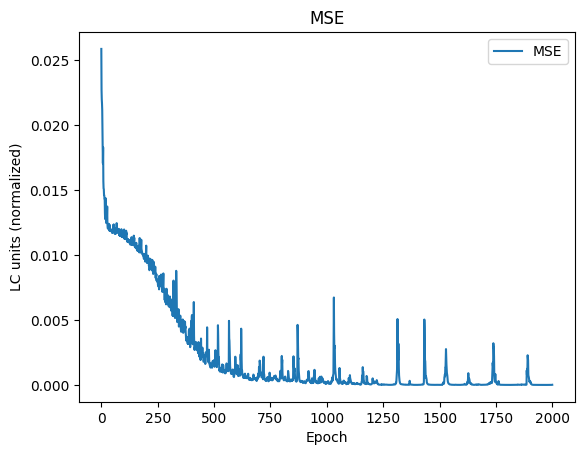

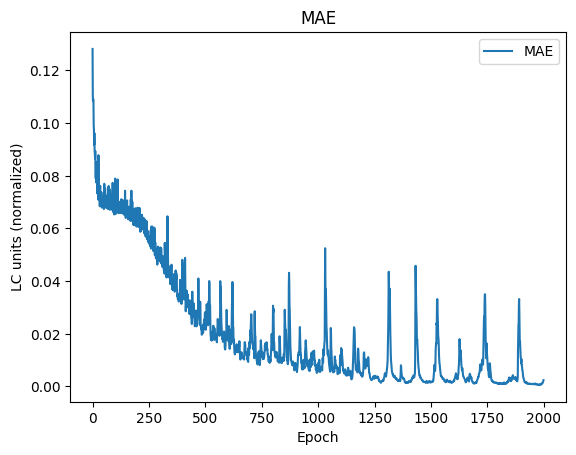

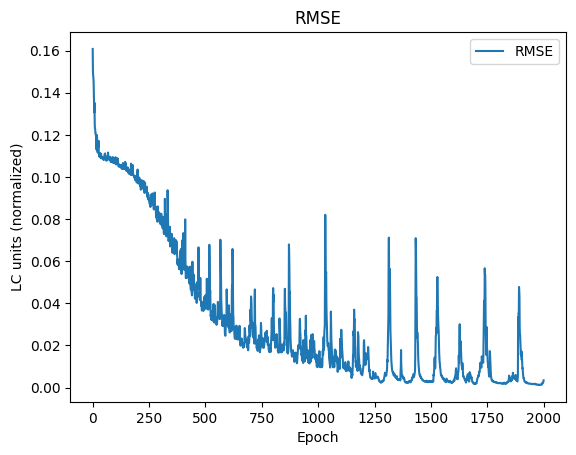

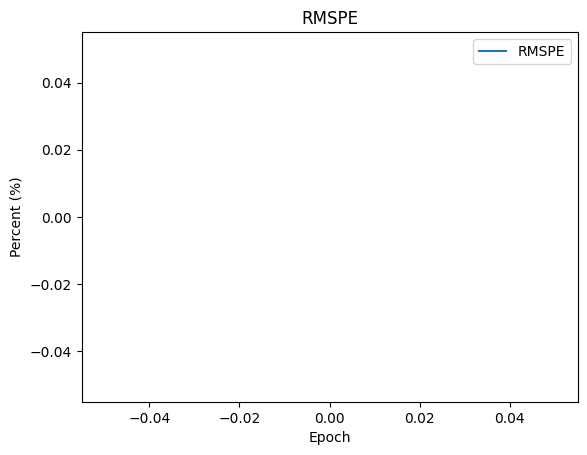

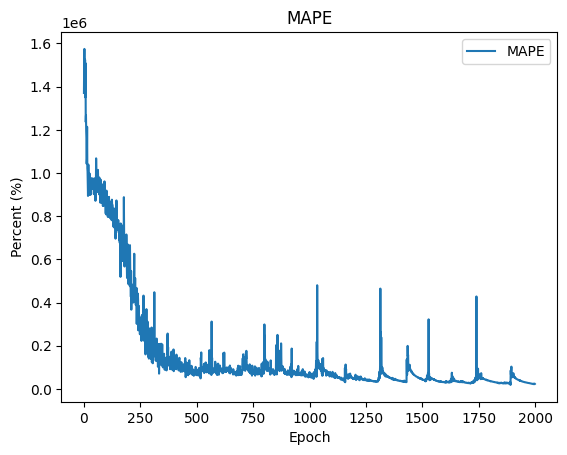

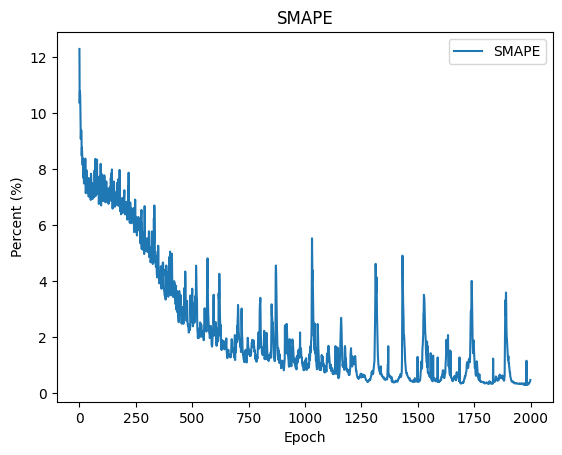

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

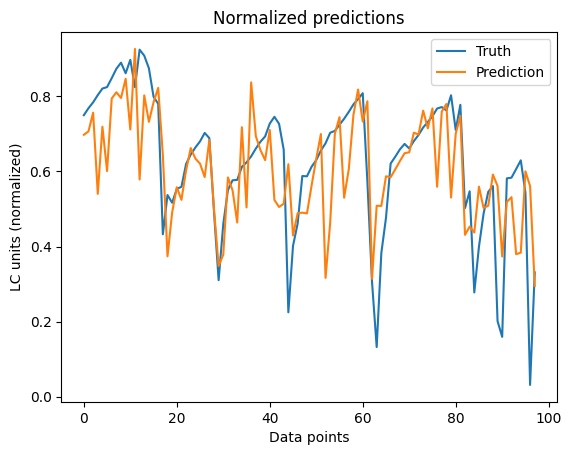

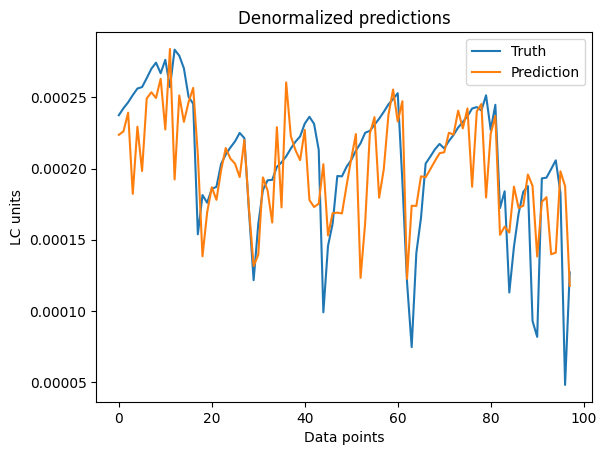

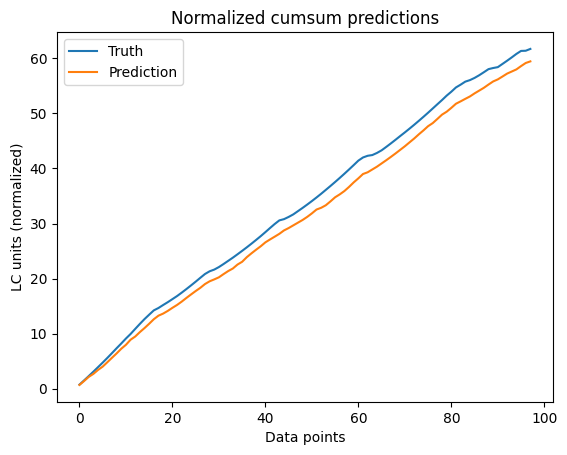

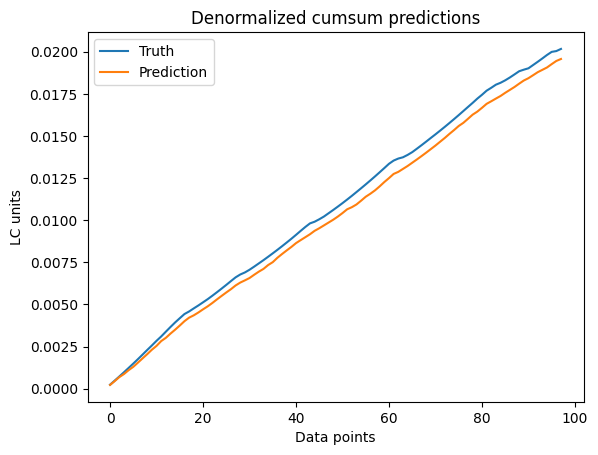

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.021273414, 0.10063693, 0.14585407, 175.86383, 37.94312, 9.695197]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.4826496e-09, 2.6567946e-05, 3.850519e-05, 39.139717, 17.435303, 7.381405]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[4.906038, 2.0915425, 2.2149577, 7.9256425, 7.4701114, 3.8998923]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[3.4192382e-07, 0.0005521614, 0.0005847425, 6.590435, 6.181394, 3.2037868]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

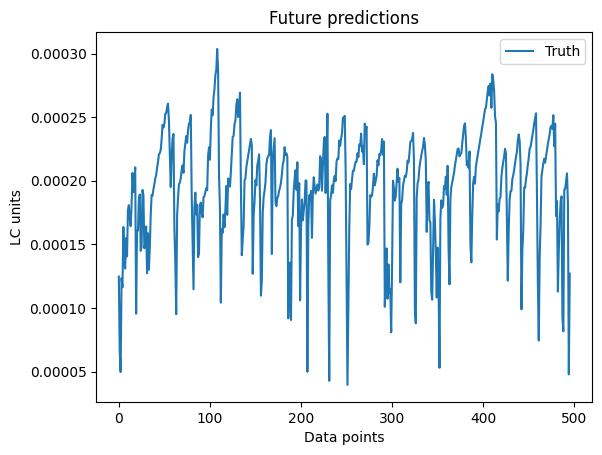

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 18%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB2-1***

## Data

### Get data

In [ ]:
num = nums[2]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"LC1"]).array

print(lc)

<PandasArray>
[1.82e-08, 1.23e-07, 3.84e-07, 9.09e-07, 3.48e-06, 3.14e-06, 5.11e-06,
 1.11e-05, 1.15e-05, 4.17e-05,
 ...
 8.97e-07, 7.82e-07, 5.23e-09, 2.58e-08, 2.78e-07, 9.83e-07, 1.39e-06,
 2.25e-06, 6.06e-07, 2.53e-06]
Length: 485, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[2.381450394750573e-05, 3.056930654565804e-05, 3.869939610012807e-05,
 4.907980110147037e-05, 6.240344373509288e-05, 7.748138159513474e-05,
 9.615634189685807e-05, 0.0001193220086861402, 0.0001478495541960001,
 0.0001803644554456696, 0.0002086733584292233, 0.0002379622019361705,
 0.0002692233247216791, 0.0003195261233486235, 0.0003936430148314685,
  0.000475267122965306,  0.000568692572414875, 0.0006569880642928183,
 0.0007397117442451417, 4.864346010435838e-06,  1.95203529074206e-06,
 8.433486300418735e-07, 1.273625798603462e-06, 1.982165031222394e-06,
 3.165790758430376e-06, 5.159717147762422e-06, 8.335926395375282e-06,
 1.321420859312639e-05, 1.944784344232175e-05, 2.489665530447382e-05,
 3.035011468455195e-05, 9.949613968274207e-07, 1.701156179478858e-06,
 5.238704403609518e-08, 1.225901996804168e-06, 1.858630071183143e-06,
 2.854040758393239e-06,   4.4813277781941e-06, 7.165873284975532e-06,
 1.153495577455033e-05, 1.792376497178338e-05, 2.337806108698715e-05,
 2.999

In [ ]:
len(lc_pred)

97

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(478, 7, 1) (478,)
[[1.11014390e-05]
 [7.50288644e-05]
 [2.34237433e-04]
 [5.54484554e-04]
 [2.12278046e-03]
 [1.91538232e-03]
 [3.11707152e-03]] 0.006770938671223832
[[7.50288644e-05]
 [2.34237433e-04]
 [5.54484554e-04]
 [2.12278046e-03]
 [1.91538232e-03]
 [3.11707152e-03]
 [6.77093867e-03]] 0.007014936477796073
[[0.00023424]
 [0.00055448]
 [0.00212278]
 [0.00191538]
 [0.00311707]
 [0.00677094]
 [0.00701494]] 0.025436770874000265
[[0.00055448]
 [0.00212278]
 [0.00191538]
 [0.00311707]
 [0.00677094]
 [0.00701494]
 [0.02543677]] 0.03171971439323547
[[0.00212278]
 [0.00191538]
 [0.00311707]
 [0.00677094]
 [0.00701494]
 [0.02543677]
 [0.03171971]] 0.046603580594142165
[[0.00191538]
 [0.00311707]
 [0.00677094]
 [0.00701494]
 [0.02543677]
 [0.03171971]
 [0.04660358]] 0.05465550821102612
[[0.00311707]
 [0.00677094]
 [0.00701494]
 [0.02543677]
 [0.03171971]
 [0.04660358]
 [0.05465551]] 0.07977630238667119
[[0.00677094]
 [0.00701494]
 [0.02543677]
 [0.03171971]
 [0.04660358]
 [0.05465551]
 [0.

In [ ]:
X[1][-1]

array([0.00677094])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

382


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[1.11014390e-05]
 [7.50288644e-05]
 [2.34237433e-04]
 [5.54484554e-04]
 [2.12278046e-03]
 [1.91538232e-03]
 [3.11707152e-03]] 0.006770938671223832
[[7.50288644e-05]
 [2.34237433e-04]
 [5.54484554e-04]
 [2.12278046e-03]
 [1.91538232e-03]
 [3.11707152e-03]
 [6.77093867e-03]] 0.007014936477796073
[[0.00023424]
 [0.00055448]
 [0.00212278]
 [0.00191538]
 [0.00311707]
 [0.00677094]
 [0.00701494]] 0.025436770874000265
[[0.00055448]
 [0.00212278]
 [0.00191538]
 [0.00311707]
 [0.00677094]
 [0.00701494]
 [0.02543677]] 0.03171971439323547
[[0.00212278]
 [0.00191538]
 [0.00311707]
 [0.00677094]
 [0.00701494]
 [0.02543677]
 [0.03171971]] 0.046603580594142165
[[0.00191538]
 [0.00311707]
 [0.00677094]
 [0.00701494]
 [0.02543677]
 [0.03171971]
 [0.04660358]] 0.05465550821102612
[[0.00311707]
 [0.00677094]
 [0.00701494]
 [0.02543677]
 [0.03171971]
 [0.04660358]
 [0.05465551]] 0.07977630238667119
[[0.00677094]
 [0.00701494]
 [0.02543677]
 [0.03171971]
 [0.04660358]
 [0.05465551]
 [0.0797763 ]] 0.107210

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

382
382
96
96


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
12/12 - 3s - loss: 0.1872 - mse: 0.1872 - mae: 0.4230 - rmse: 0.4326 - rmspe: inf - mape: 17441444.0000 - smape: 83.9721 - 3s/epoch - 238ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0600 - mse: 0.0600 - mae: 0.1975 - rmse: 0.2448 - rmspe: inf - mape: 6438963.0000 - smape: 75.2640 - 61ms/epoch - 5ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0175 - mse: 0.0175 - mae: 0.0581 - rmse: 0.1323 - rmspe: inf - mape: 34593.5117 - smape: 88.8371 - 64ms/epoch - 5ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0175 - mse: 0.0175 - mae: 0.0585 - rmse: 0.1325 - rmspe: inf - mape: 102.5346 - smape: 99.2599 - 63ms/epoch - 5ms/step
Epoch 5/2000
12/12 - 0s - loss: 0.0175 - mse: 0.0175 - mae: 0.0585 - rmse: 0.1325 - rmspe: inf - mape: 97.1777 - smape: 99.3680 - 63ms/epoch - 5ms/step
Epoch 6/2000
12/12 - 0s - loss: 0.0175 - mse: 0.0175 - mae: 0.0585 - rmse: 0.1325 - rmspe: inf - mape: 97.1599 - smape: 99.3598 - 65ms/epoch - 5ms/step
Epoch 7/2000
12/12 - 0s - loss: 0.0175 - mse: 0.0175 - mae: 0.0585 - rmse

### Plot training results

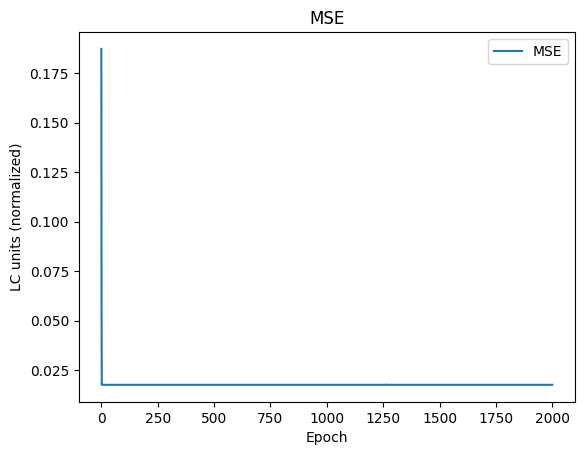

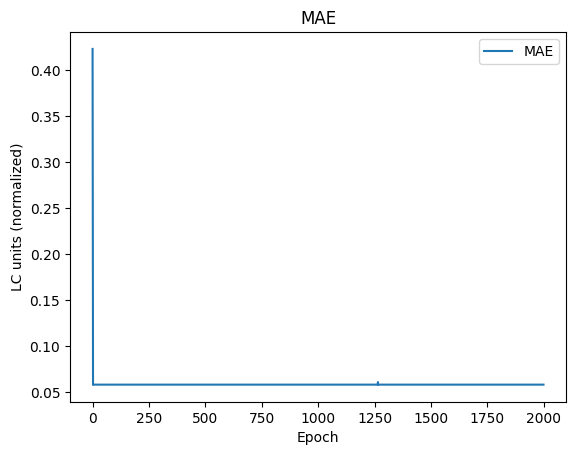

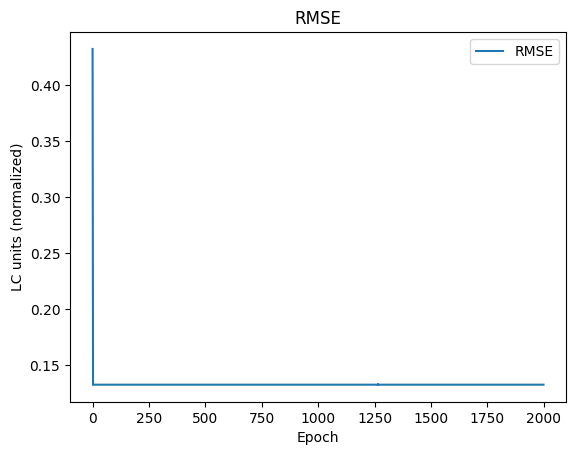

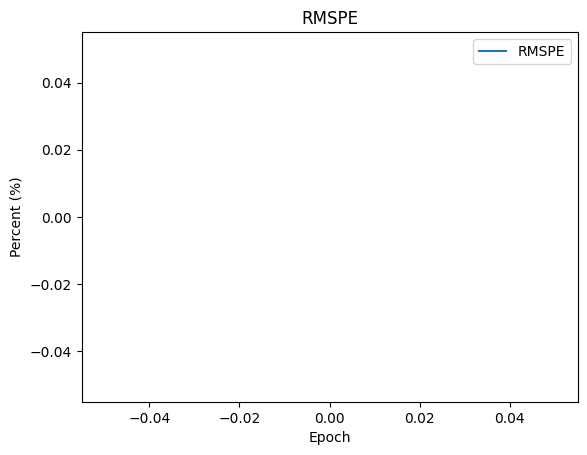

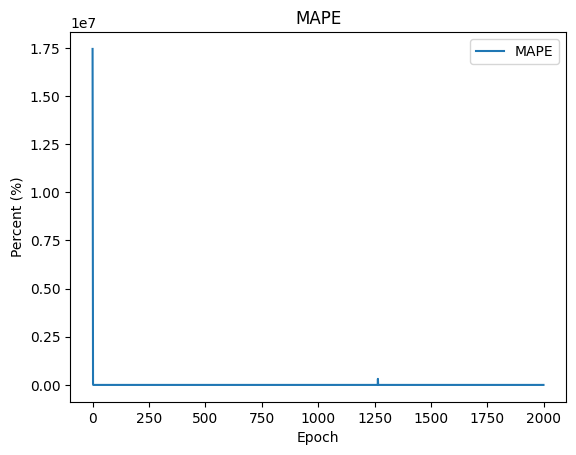

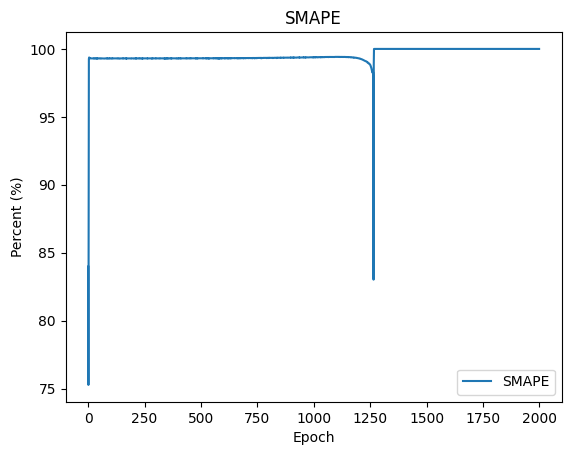

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

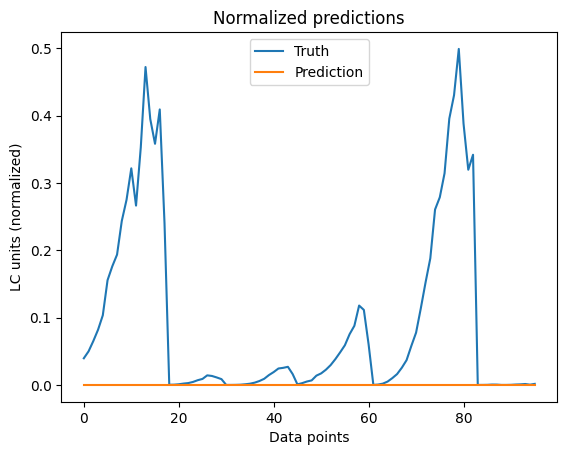

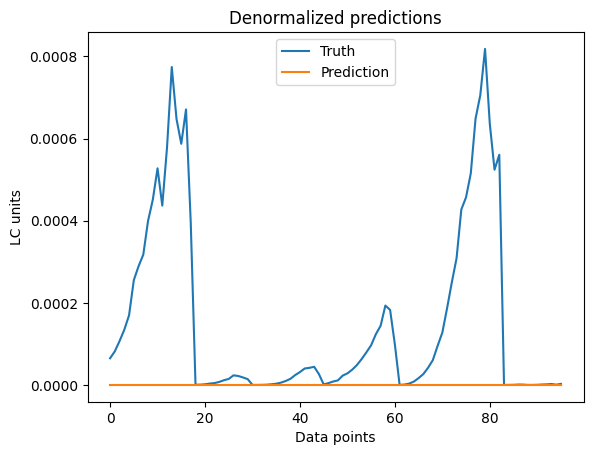

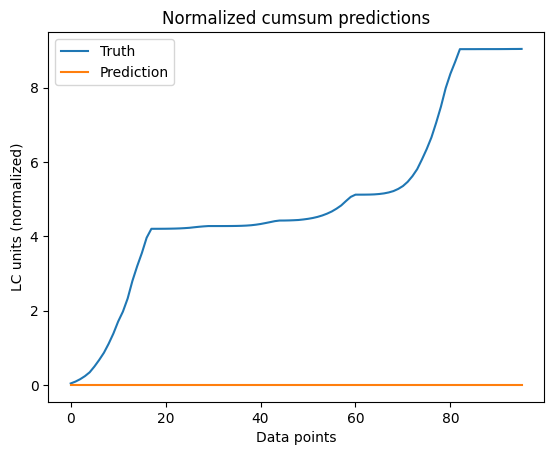

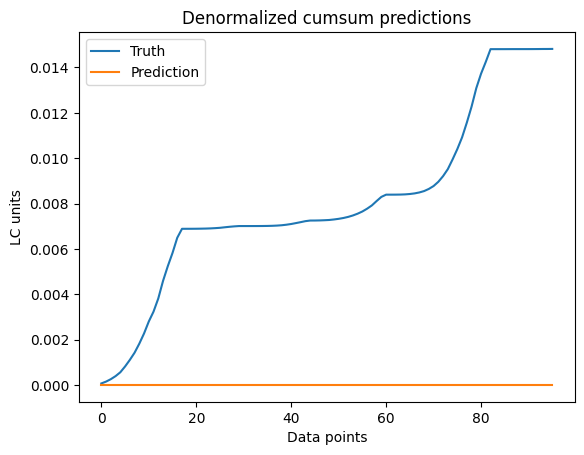

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.027393123, 0.094162874, 0.16550867, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[7.361896e-08, 0.00015436675, 0.00027132814, 99.995255, 94.88967, 99.99053]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[29.812593, 4.9220195, 5.4600906, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[8.012127e-05, 0.0080689555, 0.008951048, 100.0, 100.0, 100.0]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

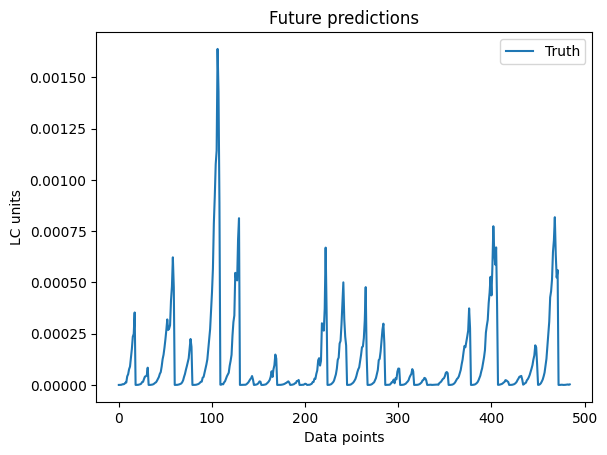

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 18%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB2-2***

## Data

### Get data

In [ ]:
num = nums[3]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"LC2"]).array

print(lc)

<PandasArray>
[1.88e-10, 2.97e-08, 1.58e-07, 1.06e-06,  2.3e-06, 6.84e-06, 9.05e-06,
 1.37e-05, 2.47e-05, 3.15e-05,
 ...
  1.6e-06,  1.5e-06, 4.36e-08, 5.11e-07, 1.04e-06, 2.23e-06, 4.28e-06,
  4.5e-06, 1.72e-06, 6.26e-06]
Length: 496, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[3.140662374789827e-05, 4.002922287327237e-05, 4.933372110826895e-05,
 5.812940798932686e-05, 7.510769501095638e-05, 0.0001043043012032285,
  0.000144004516187124, 0.0001972203172044829, 0.0002657363365869969,
 0.0002935921656899154, 0.0003201475192327052, 0.0003354602376930416,
 0.0003684875264298171, 0.0004018632171209902, 0.0004354545962996781,
  0.000470527564175427, 0.0005064245196990669,  0.000536993145942688,
 0.0005640375893563032,  8.81437608768465e-06, 3.512708133257547e-07,
   5.5119443231888e-07, 8.407567406720773e-07,   1.3783338772555e-06,
 2.294691739734844e-06, 5.119321485835826e-06, 1.281042023038026e-05,
 3.440129512455314e-05, 3.607724647736177e-05, 3.856145121972077e-05,
 4.174162313574925e-05, 4.337953498634306e-07, 3.741780574273434e-07,
 9.146976367446769e-07, 3.484140734144603e-06,  6.41203814666369e-06,
 8.138023076753598e-06, 1.024248649628134e-05, 1.296438131248578e-05,
 1.706731563899666e-05, 2.278598913107999e-05, 3.045905032195151e-05,
 3.888

In [ ]:
len(lc_pred)

99

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(489, 7, 1) (489,)
[[1.07924258e-07]
 [1.71295936e-05]
 [9.11293283e-05]
 [6.11376879e-04]
 [1.32657307e-03]
 [3.94511395e-03]
 [5.21977813e-03]] 0.00790176383816342
[[1.71295936e-05]
 [9.11293283e-05]
 [6.11376879e-04]
 [1.32657307e-03]
 [3.94511395e-03]
 [5.21977813e-03]
 [7.90176384e-03]] 0.014246246160472254
[[9.11293283e-05]
 [6.11376879e-04]
 [1.32657307e-03]
 [3.94511395e-03]
 [5.21977813e-03]
 [7.90176384e-03]
 [1.42462462e-02]] 0.018168289777899534
[[0.00061138]
 [0.00132657]
 [0.00394511]
 [0.00521978]
 [0.00790176]
 [0.01424625]
 [0.01816829]] 0.033048984679314795
[[0.00132657]
 [0.00394511]
 [0.00521978]
 [0.00790176]
 [0.01424625]
 [0.01816829]
 [0.03304898]] 0.045334209539785536
[[0.00394511]
 [0.00521978]
 [0.00790176]
 [0.01424625]
 [0.01816829]
 [0.03304898]
 [0.04533421]] 0.054216484791017906
[[0.00521978]
 [0.00790176]
 [0.01424625]
 [0.01816829]
 [0.03304898]
 [0.04533421]
 [0.05421648]] 0.06647979234892067
[[0.00790176]
 [0.01424625]
 [0.01816829]
 [0.03304898]
 [0

In [ ]:
X[1][-1]

array([0.00790176])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

391


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[1.07924258e-07]
 [1.71295936e-05]
 [9.11293283e-05]
 [6.11376879e-04]
 [1.32657307e-03]
 [3.94511395e-03]
 [5.21977813e-03]] 0.00790176383816342
[[1.71295936e-05]
 [9.11293283e-05]
 [6.11376879e-04]
 [1.32657307e-03]
 [3.94511395e-03]
 [5.21977813e-03]
 [7.90176384e-03]] 0.014246246160472254
[[9.11293283e-05]
 [6.11376879e-04]
 [1.32657307e-03]
 [3.94511395e-03]
 [5.21977813e-03]
 [7.90176384e-03]
 [1.42462462e-02]] 0.018168289777899534
[[0.00061138]
 [0.00132657]
 [0.00394511]
 [0.00521978]
 [0.00790176]
 [0.01424625]
 [0.01816829]] 0.033048984679314795
[[0.00132657]
 [0.00394511]
 [0.00521978]
 [0.00790176]
 [0.01424625]
 [0.01816829]
 [0.03304898]] 0.045334209539785536
[[0.00394511]
 [0.00521978]
 [0.00790176]
 [0.01424625]
 [0.01816829]
 [0.03304898]
 [0.04533421]] 0.054216484791017906
[[0.00521978]
 [0.00790176]
 [0.01424625]
 [0.01816829]
 [0.03304898]
 [0.04533421]
 [0.05421648]] 0.06647979234892067
[[0.00790176]
 [0.01424625]
 [0.01816829]
 [0.03304898]
 [0.04533421]
 [0.0542

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

391
391
98
98


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
13/13 - 3s - loss: 0.1883 - mse: 0.1883 - mae: 0.4230 - rmse: 0.4340 - rmspe: inf - mape: 20234652.0000 - smape: 81.1578 - 3s/epoch - 219ms/step
Epoch 2/2000
13/13 - 0s - loss: 0.0714 - mse: 0.0714 - mae: 0.2209 - rmse: 0.2673 - rmspe: inf - mape: 8547993.0000 - smape: 73.8761 - 74ms/epoch - 6ms/step
Epoch 3/2000
13/13 - 0s - loss: 0.0218 - mse: 0.0218 - mae: 0.0680 - rmse: 0.1475 - rmspe: inf - mape: 46329.1055 - smape: 88.5734 - 72ms/epoch - 6ms/step
Epoch 4/2000
13/13 - 0s - loss: 0.0218 - mse: 0.0218 - mae: 0.0686 - rmse: 0.1477 - rmspe: inf - mape: 112.1434 - smape: 97.3120 - 72ms/epoch - 6ms/step
Epoch 5/2000
13/13 - 0s - loss: 0.0218 - mse: 0.0218 - mae: 0.0686 - rmse: 0.1477 - rmspe: inf - mape: 97.8223 - smape: 98.0671 - 72ms/epoch - 6ms/step
Epoch 6/2000
13/13 - 0s - loss: 0.0218 - mse: 0.0218 - mae: 0.0686 - rmse: 0.1477 - rmspe: inf - mape: 97.5314 - smape: 97.6103 - 74ms/epoch - 6ms/step
Epoch 7/2000
13/13 - 0s - loss: 0.0218 - mse: 0.0218 - mae: 0.0686 - rmse

### Plot training results

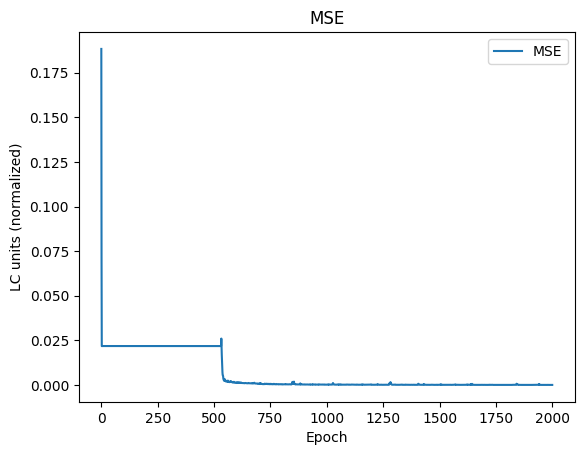

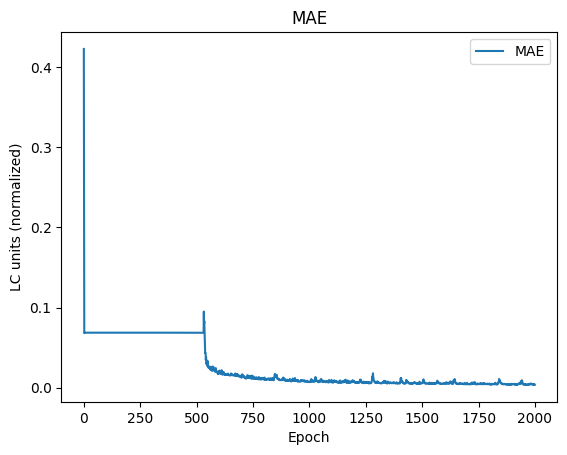

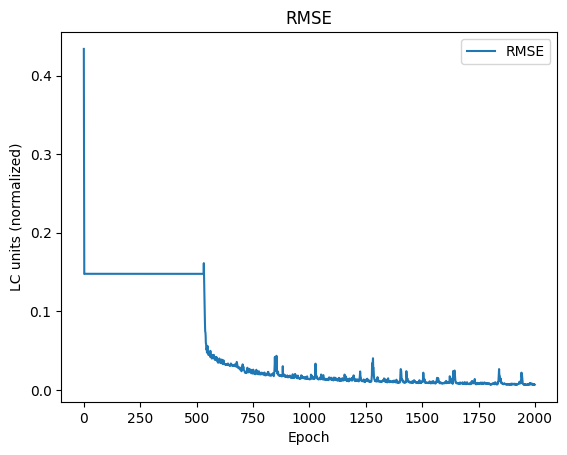

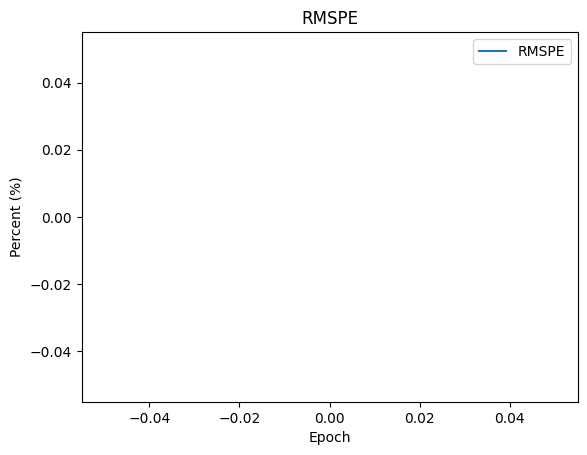

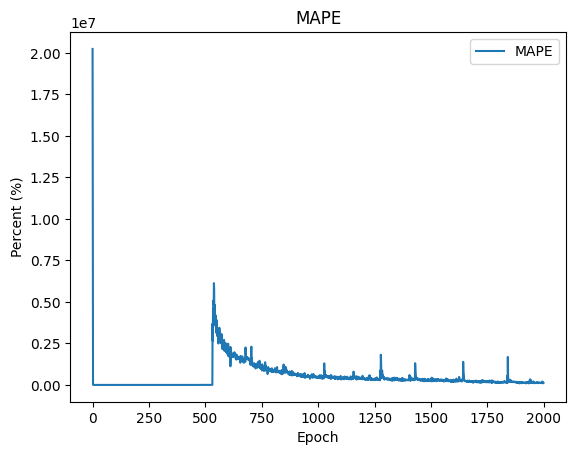

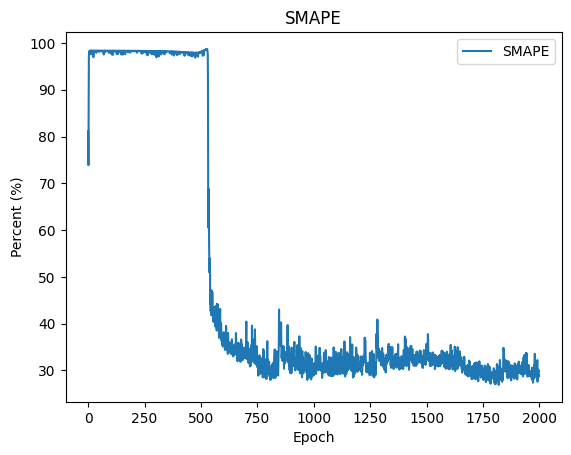

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

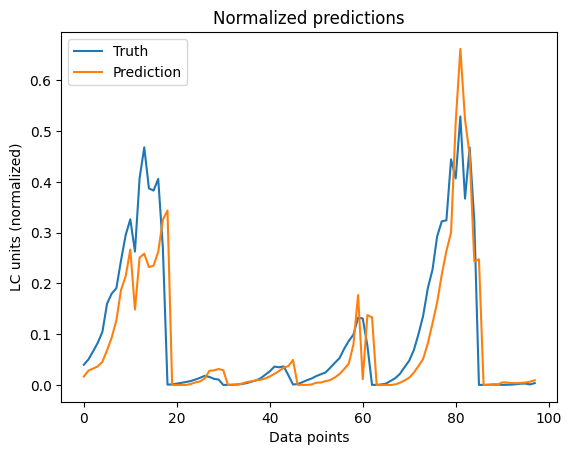

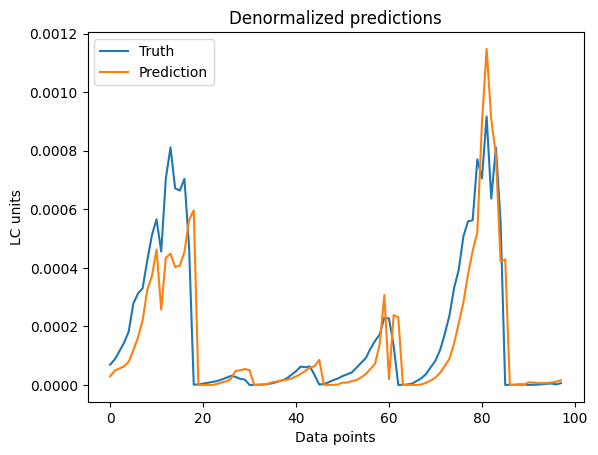

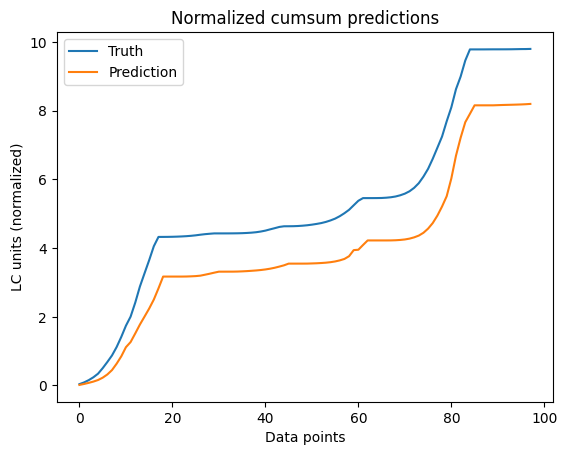

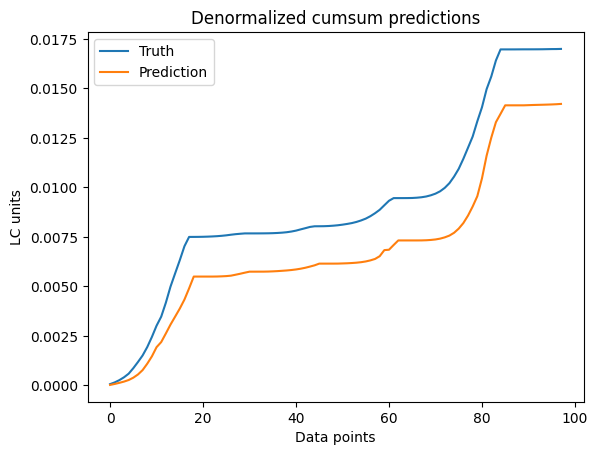

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.0058504143, 0.046162527, 0.076488, 1223227.9, 179210.19, 48.33205]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.7586506e-08, 8.0036145e-05, 0.00013261412, 1221821.6, 8131.14, 48.33201]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.7097266, 1.2332053, 1.3075651, 29.035881, 27.48901, 16.310394]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[5.139488e-06, 0.00213812, 0.0022670438, 29.035881, 27.48901, 16.310396]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

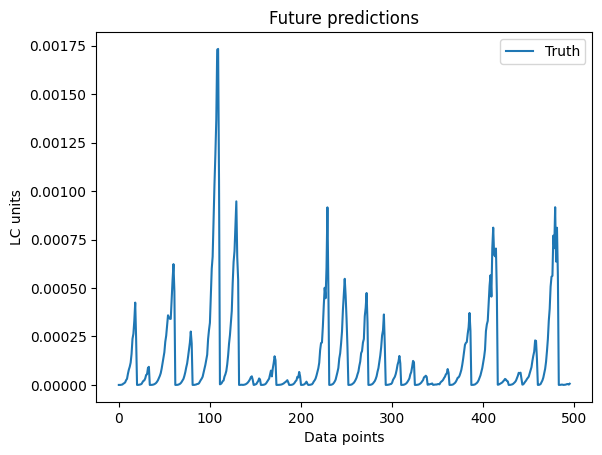

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 88%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 17%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB3-1-1***

## Data

### Get data

In [ ]:
num = nums[4]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

lc = pd.Series(sheet.loc[:,"AD1"]).array

print(lc)

<PandasArray>
[  3.12493869762179e-06,  4.226966081049842e-06,  4.876924176944798e-06,
  6.254302155778809e-06, 3.0026480034715293e-06,  9.560837720205367e-06,
  1.203386554440329e-05, 1.0576445682179632e-05,  1.912567112355825e-05,
  7.584942711868595e-06,
 ...
 1.7448083881120747e-06,  7.192723607432326e-06, 1.3084234355316426e-06,
  3.412929500800552e-06, 3.2370909223129497e-06, 1.7295150773868313e-06,
  2.855592283208608e-06, 3.4934604481501037e-06, 1.1313069525636538e-05,
 1.1760355485856407e-05]
Length: 485, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[4.561004516290268e-06, 6.025016773492098e-06, 1.040938786900369e-05,
  1.79492708411999e-05, 1.929154132085387e-05, 2.042287997028325e-05,
 2.205096097895876e-05, 2.468988895998336e-05, 3.016930349986069e-05,
 3.779524922720157e-05, 4.878072650171816e-05, 6.431319343391806e-05,
 8.309761324198917e-05, 9.640891221351922e-05, 0.0001125123380916193,
 0.0001343668991466984, 0.0001629766484256834, 0.0001944682444445789,
 0.0002284181682625785, 2.038789034486399e-06, 2.221340992036858e-06,
 1.781097353159566e-06, 2.411210743957781e-06, 3.069399326705025e-06,
 3.623812062869547e-06, 4.038854058308061e-06, 4.233041181578301e-06,
 4.317145794630051e-06,  4.45967953055515e-06, 4.880197593593039e-06,
  6.29635906079784e-06, 1.859001827142492e-06,  2.29262468565139e-06,
  1.62833839567611e-06,  2.14005649468163e-06, 2.636931640154216e-06,
 3.120475412288215e-06, 3.499160129649681e-06, 3.742198259715224e-06,
 3.938426743843593e-06, 4.191554126009578e-06, 4.791388619196368e-06,
   6.8

In [ ]:
len(lc_pred)

97

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(478, 7, 1) (478,)
[[0.00406455]
 [0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]] 0.01453319801558204
[[0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]] 0.026544038854726337
[[0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]] 0.010330423589687472
[[0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]] 0.015360856452513668
[[0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]] 0.01637198914235134
[[0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]] 0.028662912882932764
[[0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]] 0.02688934246284118
[[0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]
 [0.02688934]] 0.028261887616383746
[[0.02654404]
 [0.010330

In [ ]:
X[1][-1]

array([0.0145332])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

382


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00406455]
 [0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]] 0.01453319801558204
[[0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]] 0.026544038854726337
[[0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]] 0.010330423589687472
[[0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]] 0.015360856452513668
[[0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]] 0.01637198914235134
[[0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]] 0.028662912882932764
[[0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]] 0.02688934246284118
[[0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]
 [0.02688934]] 0.028261887616383746
[[0.02654404]
 [0.01033042]
 [0.01536086]
 

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

382
382
96
96


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
12/12 - 3s - loss: 0.1941 - mse: 0.1941 - mae: 0.4356 - rmse: 0.4406 - rmspe: inf - mape: 1134119.8750 - smape: 90.3249 - 3s/epoch - 230ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0418 - mse: 0.0418 - mae: 0.1518 - rmse: 0.2044 - rmspe: inf - mape: 11789.2725 - smape: 73.6578 - 64ms/epoch - 5ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0101 - mse: 0.0101 - mae: 0.0333 - rmse: 0.1007 - rmspe: inf - mape: 111.9245 - smape: 95.6687 - 62ms/epoch - 5ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0335 - rmse: 0.1008 - rmspe: inf - mape: 99.7984 - smape: 99.9997 - 62ms/epoch - 5ms/step
Epoch 5/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0335 - rmse: 0.1008 - rmspe: inf - mape: 99.7385 - smape: 100.0000 - 64ms/epoch - 5ms/step
Epoch 6/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0335 - rmse: 0.1008 - rmspe: inf - mape: 99.7383 - smape: 100.0000 - 66ms/epoch - 6ms/step
Epoch 7/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0335 - rmse: 0.

### Plot training results

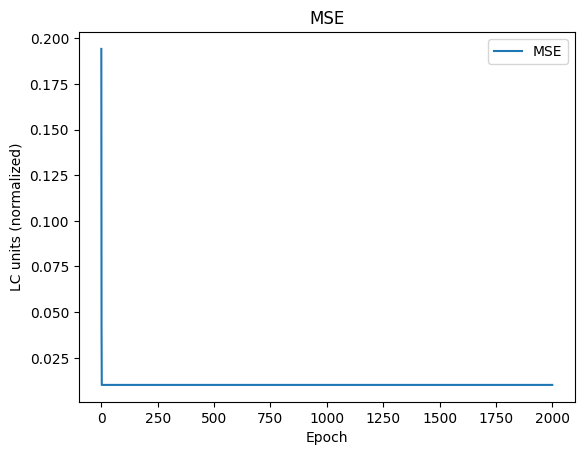

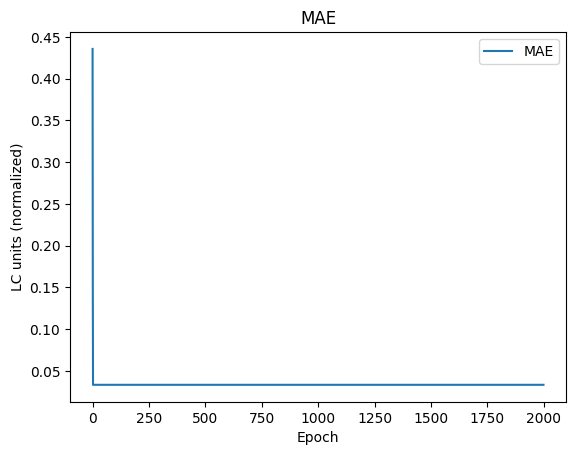

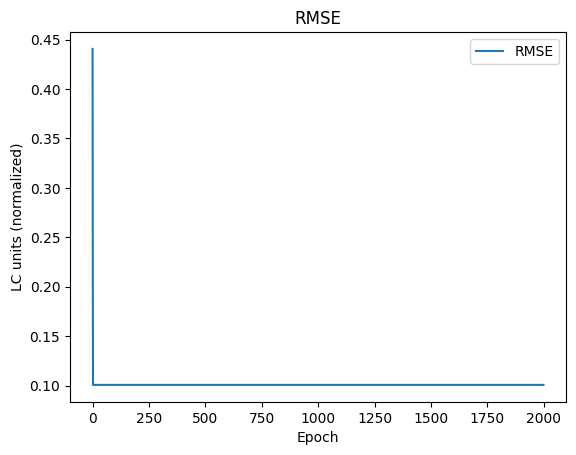

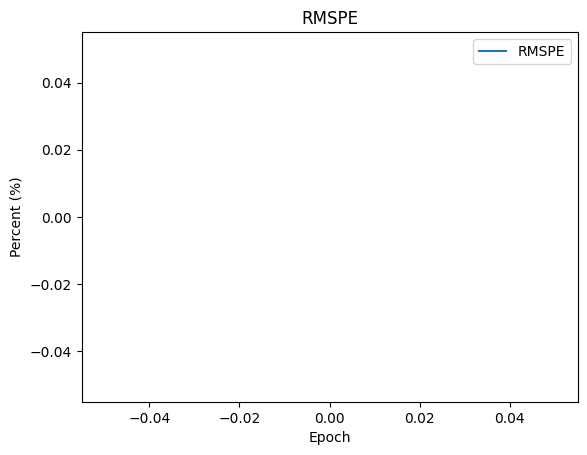

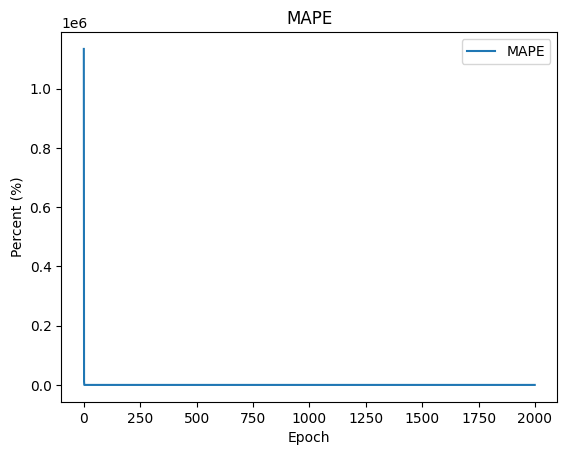

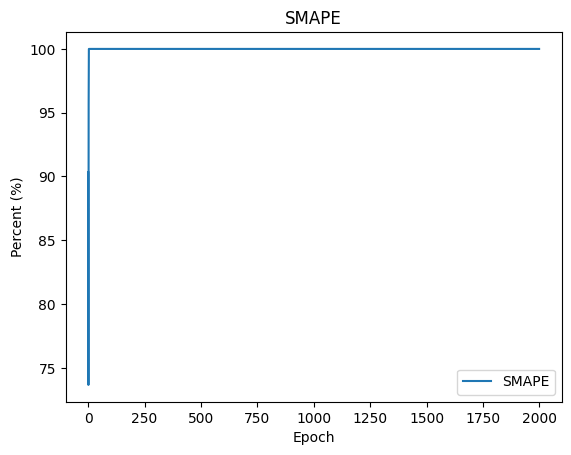

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

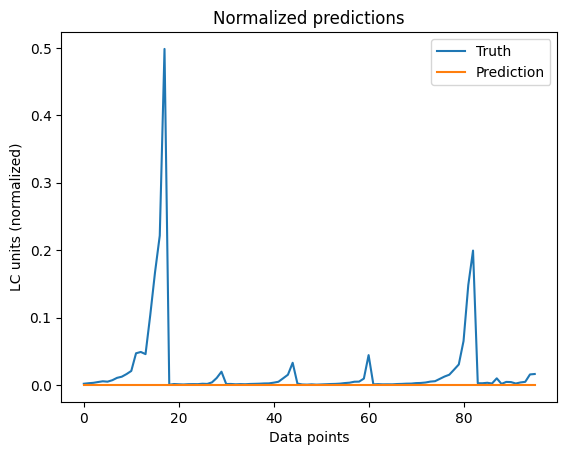

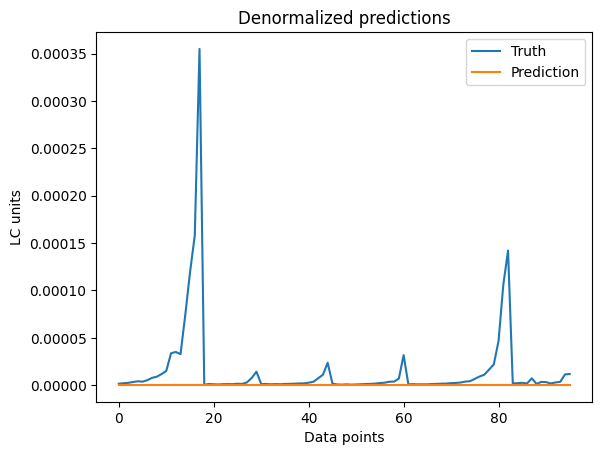

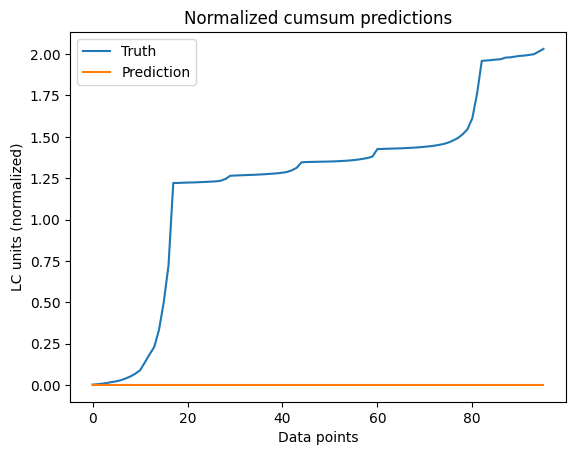

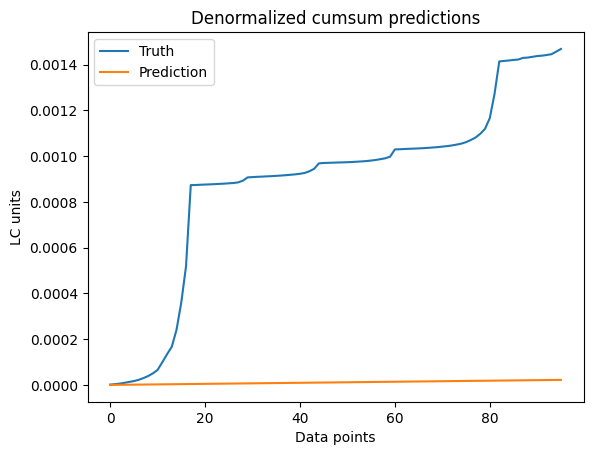

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.0043423325, 0.021162277, 0.06589638, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[2.2000364e-09, 1.5063149e-05, 4.6904544e-05, 88.24939, 87.545364, 79.440384]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.834272, 1.2318097, 1.354353, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[9.2933095e-07, 0.0008767927, 0.0009640181, 97.942825, 97.906425, 96.02235]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

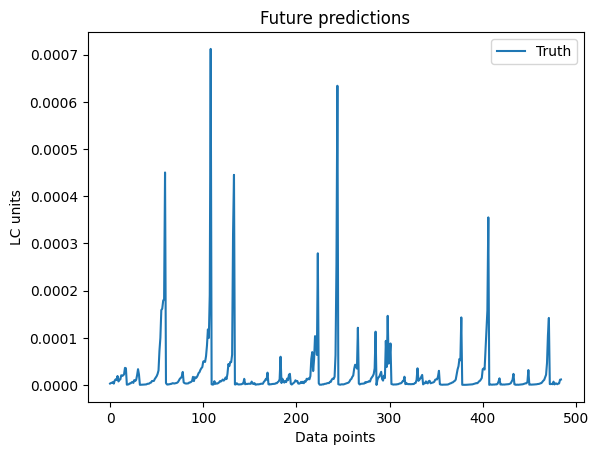

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 90%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 67%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 18%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB3-1-2***

## Data

### Get data

In [ ]:
num = nums[5]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

lc = pd.Series(sheet.loc[:,"AD2"]).array

print(lc)

<PandasArray>
[ 7.267314558018651e-07, 2.0055106545743913e-06,  3.834752024263048e-06,
  1.524071814176688e-06, 2.2684576481485536e-06, 1.2889934857796056e-06,
  2.467469863910923e-06, 3.5805294430909866e-06, 3.6823219166456934e-06,
  5.967367854821781e-06,
 ...
  6.720310026480268e-07, 3.4339407441484902e-06,  5.922233788906155e-07,
 2.2186722338810345e-07,  3.894854711385795e-07,  4.327701134729539e-07,
 4.6943521310413423e-07,   1.32652375167509e-06,  5.365370616901601e-06,
  4.167543168434016e-06]
Length: 496, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[1.121962100114615e-06, 1.703364318927925e-06, 2.527219521653024e-06,
 3.654228294180939e-06, 5.253655672277091e-06, 7.297882348211715e-06,
 1.008844628813677e-05, 1.316253292316105e-05, 1.713926212687511e-05,
  2.13344392250292e-05, 2.650909846124705e-05, 3.284168633399531e-05,
 4.184499266557395e-05, 5.549794877879322e-05, 7.406367512885481e-05,
 9.677771595306695e-05, 0.0001254700182471424, 0.0001580931129865348,
  0.000189874044735916, 1.909760527496474e-07, 1.754758045535709e-07,
 1.608120072660313e-07, 1.726234444276997e-07, 1.931558415435575e-07,
 2.281393278735777e-07, 2.868772810415976e-07,  3.85016676318628e-07,
 5.496216317624203e-07, 8.054748832364567e-07, 1.197108076667064e-06,
 1.627332039788598e-06, 1.727034231180369e-07, 1.752141969291188e-07,
 1.608113961992785e-07, 1.737359411890793e-07, 1.947854997297327e-07,
 2.320549725709498e-07,  2.96239676345067e-07, 4.035391896195506e-07,
  5.78925153149612e-07, 8.685980219524936e-07, 1.301804445574817e-06,
 1.986

In [ ]:
len(lc_pred)

99

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(489, 7, 1) (489,)
[[0.0009053 ]
 [0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]] 0.005283604410893063
[[0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]] 0.005439774542066924
[[0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]] 0.008945494674817893
[[0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]] 0.007203619206017039
[[0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]] 0.009140377251267014
[[0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]] 0.013879738405366594
[[0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]] 0.019557180916903998
[[0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]
 [0.01955718]] 0.022456358248262268
[[0.00543977]
 [0.008

In [ ]:
X[1][-1]

array([0.0052836])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

391


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.0009053 ]
 [0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]] 0.005283604410893063
[[0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]] 0.005439774542066924
[[0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]] 0.008945494674817893
[[0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]] 0.007203619206017039
[[0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]] 0.009140377251267014
[[0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]] 0.013879738405366594
[[0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]] 0.019557180916903998
[[0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]
 [0.01955718]] 0.022456358248262268
[[0.00543977]
 [0.00894549]
 [0.00720362

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

391
391
98
98


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
13/13 - 3s - loss: 0.2014 - mse: 0.2014 - mae: 0.4447 - rmse: 0.4488 - rmspe: 58764.6797 - mape: 34423.9961 - smape: 92.7792 - 3s/epoch - 217ms/step
Epoch 2/2000
13/13 - 0s - loss: 0.0351 - mse: 0.0351 - mae: 0.1341 - rmse: 0.1875 - rmspe: 16791.0547 - mape: 9530.0098 - smape: 75.2778 - 75ms/epoch - 6ms/step
Epoch 3/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0258 - rmse: 0.0920 - rmspe: 98.6017 - mape: 98.2389 - smape: 97.4708 - 73ms/epoch - 6ms/step
Epoch 4/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0258 - rmse: 0.0920 - rmspe: 99.9998 - mape: 99.9998 - smape: 99.9996 - 73ms/epoch - 6ms/step
Epoch 5/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0258 - rmse: 0.0920 - rmspe: 100.0000 - mape: 100.0000 - smape: 100.0000 - 74ms/epoch - 6ms/step
Epoch 6/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0258 - rmse: 0.0920 - rmspe: 100.0000 - mape: 100.0000 - smape: 100.0000 - 69ms/epoch - 5ms/step
Epoch 7/2000
13/13 - 0s - loss: 0.0085 - mse: 0

### Plot training results

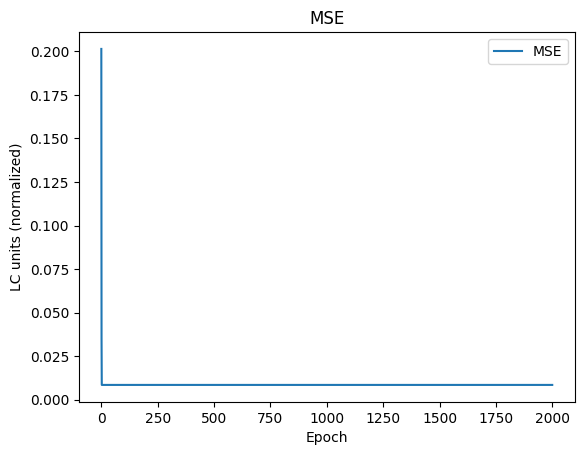

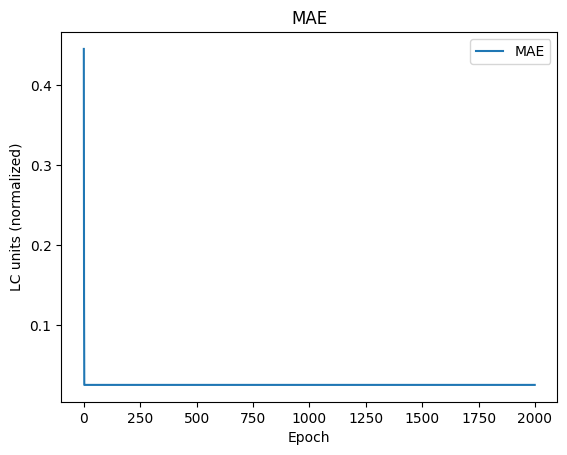

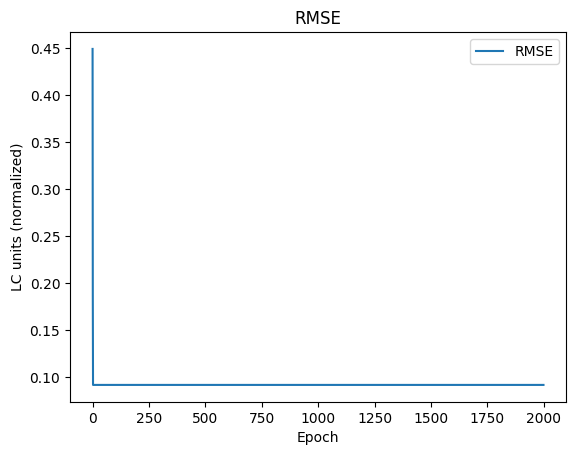

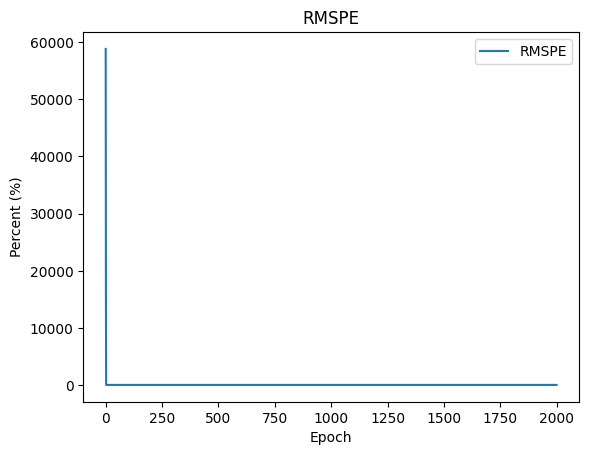

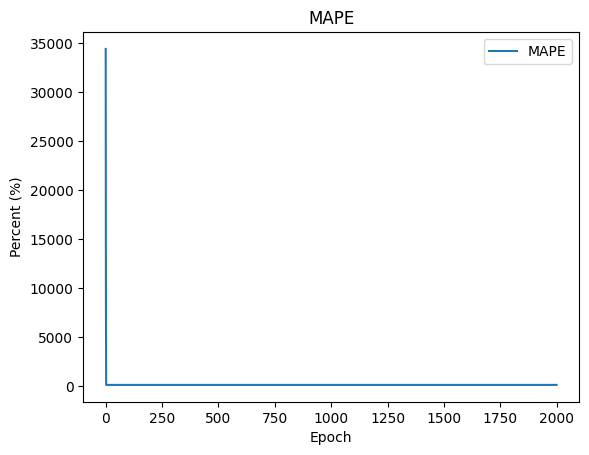

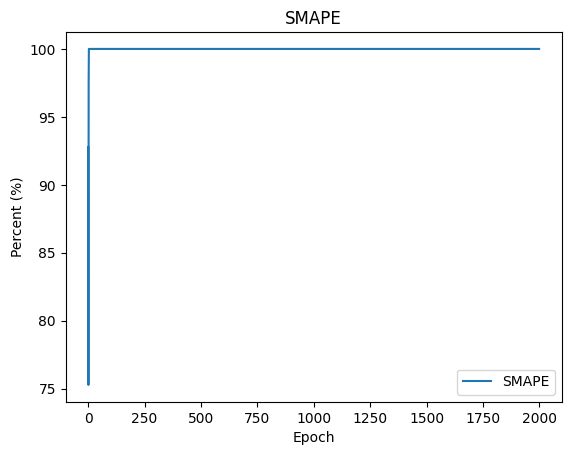

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

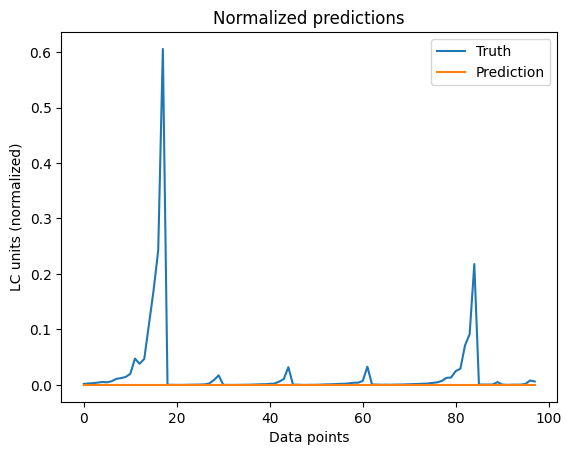

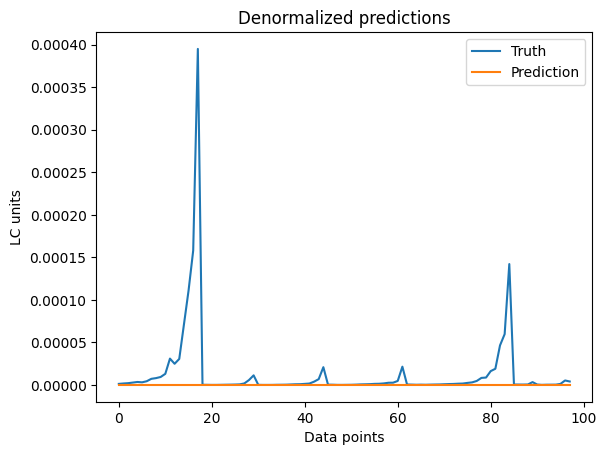

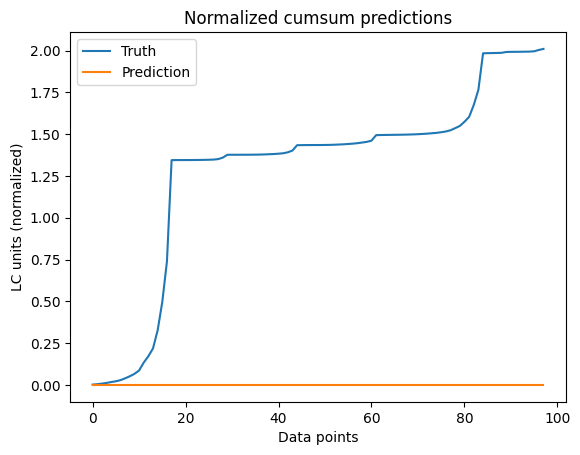

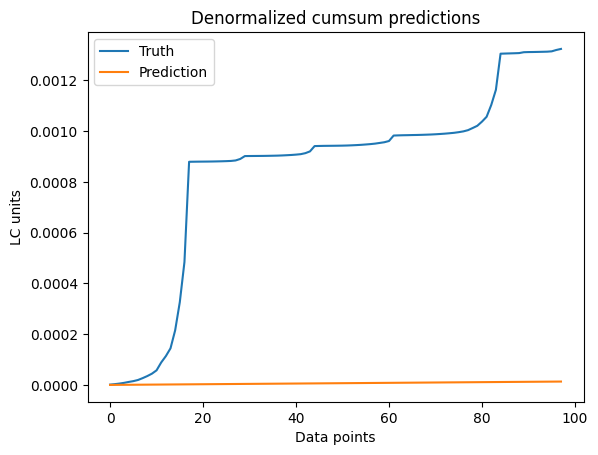

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.005498071, 0.020512734, 0.074148975, inf, 98.98485, 99.99974]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[2.335854e-09, 1.3370302e-05, 4.8330672e-05, 82.755714, 79.29565, 70.953476]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[2.0042522, 1.2954162, 1.415716, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[8.51506e-07, 0.00084435864, 0.0009227708, 98.67949, 98.66425, 97.4185]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

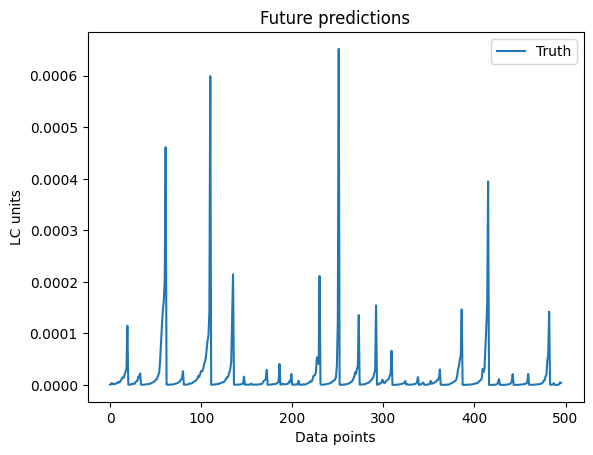

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 88%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 18%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB3-2-1***

## Data

### Get data

In [ ]:
num = nums[6]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

lc = pd.Series(sheet.loc[:,"AD1"]).array

print(lc)

<PandasArray>
[3.7499264371461483e-06,   5.07235929725981e-06,  5.852309012333759e-06,
  7.505162586934571e-06, 3.6031776041658356e-06, 1.1473005264246443e-05,
 1.4440638653283948e-05,  1.269173481861556e-05,   2.29508053482699e-05,
  9.101931254242314e-06,
 ...
 2.0937700657344897e-06,  8.631268328918793e-06,  1.570108122637971e-06,
  4.095515400960662e-06,   3.88450910677554e-06, 2.0754180928641977e-06,
 3.4267107398503294e-06, 4.1921525377801245e-06, 1.3575683430763845e-05,
 1.4112426583027687e-05]
Length: 485, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[4.359625563665759e-06, 3.285295861132909e-06,  6.49039748168434e-06,
 1.437822720617987e-05, 1.928956044139341e-05, 1.821913247113116e-05,
 1.450671788916225e-05,  1.30930984596489e-05,  1.38069253807771e-05,
 1.349332615063759e-05, 1.799166238924954e-05,  3.21577608701773e-05,
 5.319984120433219e-05, 8.423075632890686e-05, 0.0001204578948090784,
 0.0001664235023781657, 0.0002230365644209087, 0.0002878392115235329,
 0.0003938179288525134, 4.811425696971128e-06, 7.212071523099439e-06,
 1.354313189949607e-05, 1.690709905233234e-05, 1.723928653518669e-05,
 1.838247044361196e-05,  1.51576250573271e-05, 1.135940237873001e-05,
 8.450523637293372e-06, 9.631266038923059e-06, 7.090736289683264e-06,
 4.634976448869566e-06, 5.212737505644327e-06, 3.408166094232001e-06,
 4.227360477671027e-06, 7.652316526218783e-06, 8.069928298937157e-06,
  8.40830853121588e-06, 7.808074769855011e-06, 6.245209533517482e-06,
 7.857067430450115e-06, 5.870956101716729e-06, 4.612898010236677e-06,
 4.575

In [ ]:
len(lc_pred)

97

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(478, 7, 1) (478,)
[[0.00406455]
 [0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]] 0.014533198015582045
[[0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]] 0.026544038854726337
[[0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]] 0.010330423589687474
[[0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]] 0.015360856452513665
[[0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]] 0.016371989142351343
[[0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]] 0.028662912882932767
[[0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]] 0.026889342462841182
[[0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]
 [0.02688934]] 0.02826188761638375
[[0.02654404]
 [0.0103

In [ ]:
X[1][-1]

array([0.0145332])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

382


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00406455]
 [0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]] 0.014533198015582045
[[0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]] 0.026544038854726337
[[0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]] 0.010330423589687474
[[0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]] 0.015360856452513665
[[0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]] 0.016371989142351343
[[0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]] 0.028662912882932767
[[0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]] 0.026889342462841182
[[0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]
 [0.02688934]] 0.02826188761638375
[[0.02654404]
 [0.01033042]
 [0.01536086]

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

382
382
96
96


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
12/12 - 3s - loss: 0.1990 - mse: 0.1990 - mae: 0.4417 - rmse: 0.4461 - rmspe: inf - mape: 1167019.7500 - smape: 90.5307 - 3s/epoch - 230ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0557 - mse: 0.0557 - mae: 0.1847 - rmse: 0.2360 - rmspe: inf - mape: 177921.4375 - smape: 75.9126 - 64ms/epoch - 5ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0101 - mse: 0.0101 - mae: 0.0330 - rmse: 0.1006 - rmspe: inf - mape: 109.8752 - smape: 88.7015 - 66ms/epoch - 6ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0335 - rmse: 0.1008 - rmspe: inf - mape: 100.6115 - smape: 99.9907 - 67ms/epoch - 6ms/step
Epoch 5/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0335 - rmse: 0.1008 - rmspe: inf - mape: 99.7595 - smape: 99.9995 - 64ms/epoch - 5ms/step
Epoch 6/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0335 - rmse: 0.1008 - rmspe: inf - mape: 99.7512 - smape: 99.9997 - 64ms/epoch - 5ms/step
Epoch 7/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0335 - rmse: 0.

### Plot training results

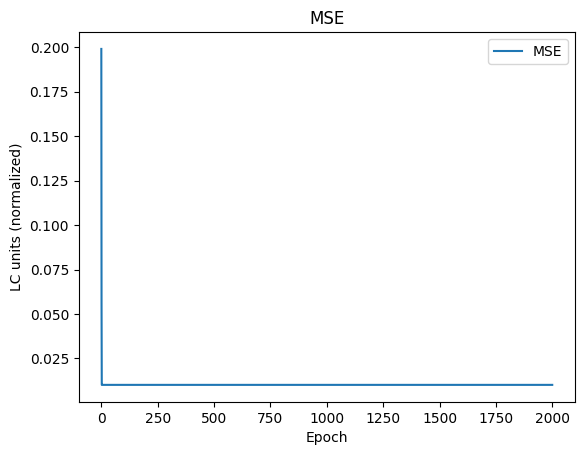

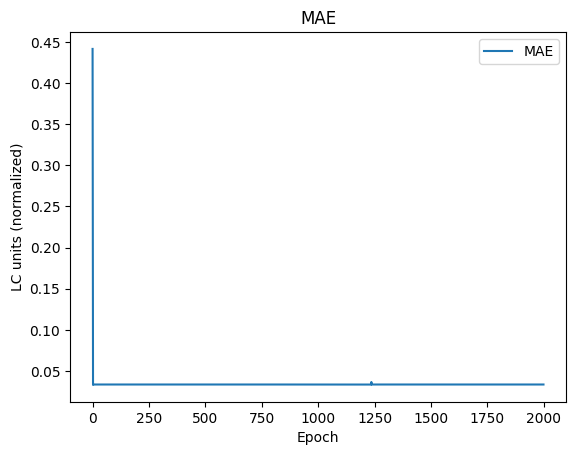

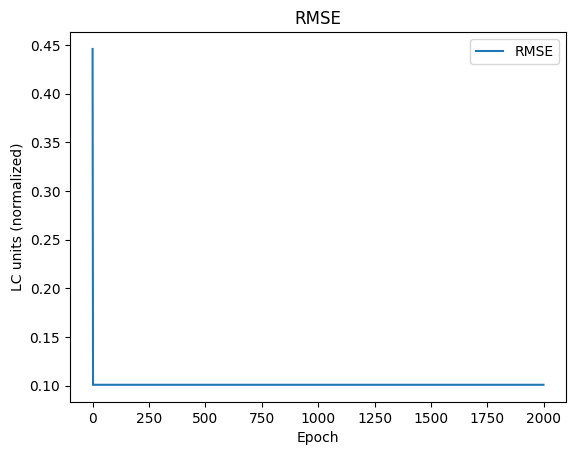

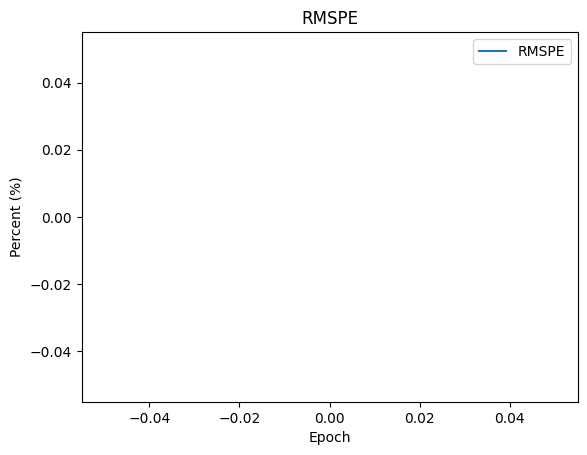

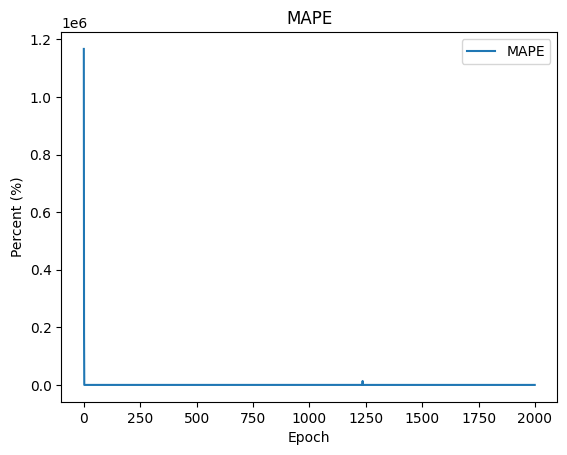

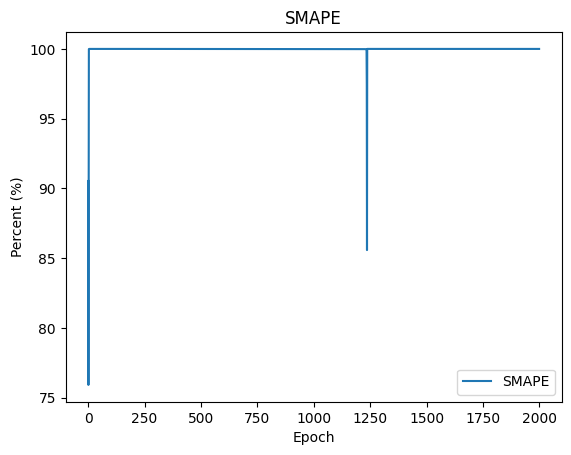

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

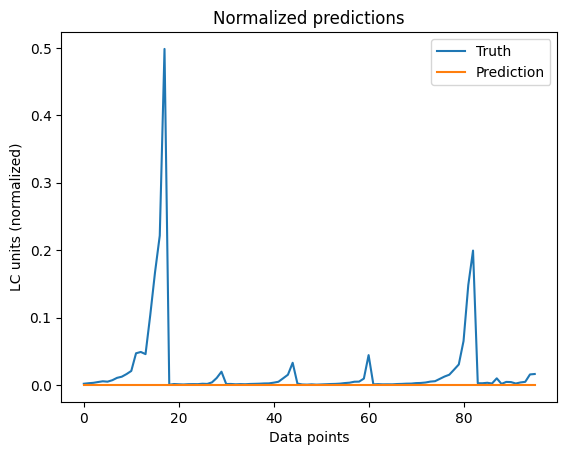

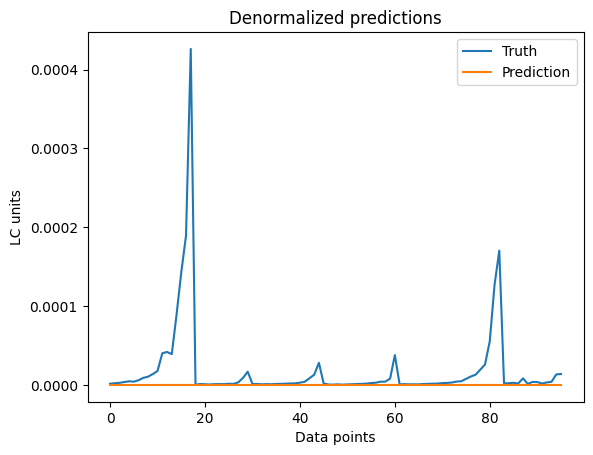

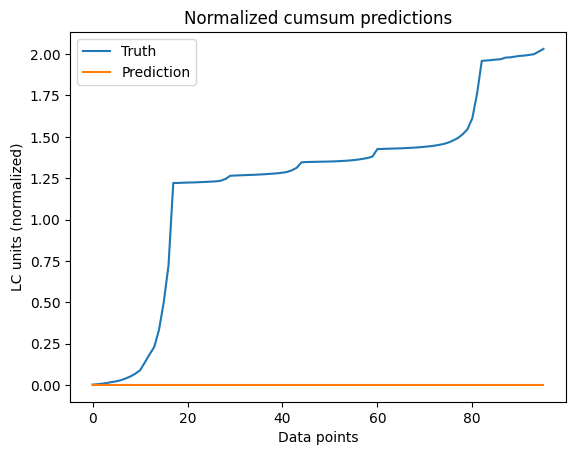

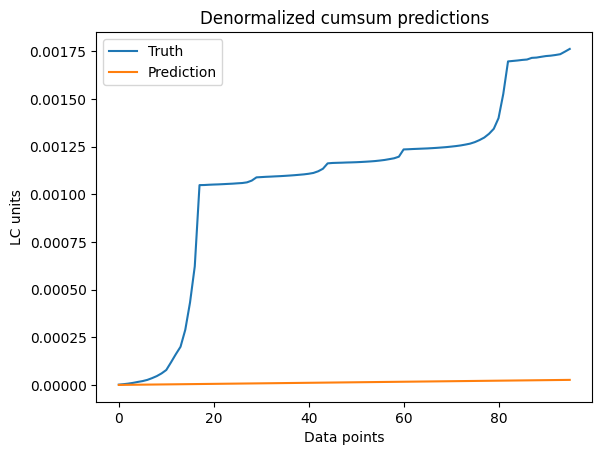

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.0043423325, 0.021162277, 0.06589638, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[3.1680516e-09, 1.8075776e-05, 5.6285447e-05, 88.24939, 87.54537, 79.4404]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.834272, 1.2318097, 1.354353, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.3382363e-06, 0.0010521512, 0.0011568216, 97.942825, 97.906425, 96.02235]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

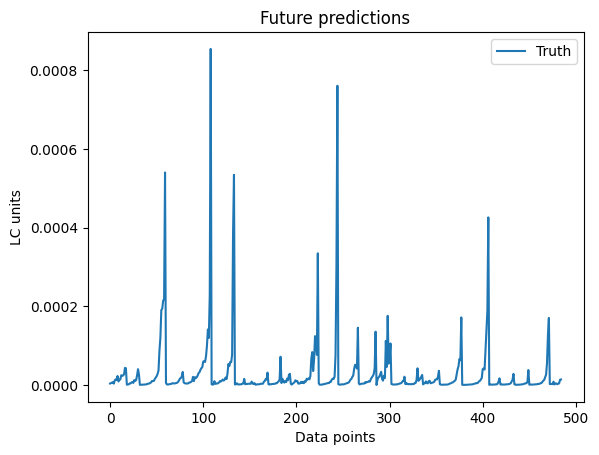

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 17%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB3-2-2***

## Data

### Get data

In [ ]:
num = nums[7]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

lc = pd.Series(sheet.loc[:,"AD2"]).array

print(lc)

<PandasArray>
[ 8.720777469622382e-07,   2.40661278548927e-06,  4.601702429115659e-06,
 1.8288861770120263e-06, 2.7221491777782646e-06, 1.5467921829355267e-06,
 2.9609638366931074e-06,  4.296635331709184e-06,  4.418786299974833e-06,
  7.160841425786137e-06,
 ...
  6.815286006481056e-07,  6.563406451790155e-07,  8.064372031776321e-07,
  4.120728892978189e-06,  7.106680546687385e-07, 2.6624066806572417e-07,
  4.673825653662954e-07,  5.193241361675446e-07,  5.633222557249611e-07,
  1.591828502010108e-06]
Length: 494, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[1.964455123015796e-06, 2.514429752409342e-06,  3.21432435157476e-06,
  4.10042275689193e-06, 5.175415935809724e-06, 6.482104254246224e-06,
 8.178638381650671e-06, 1.020950548991095e-05, 1.298808183491929e-05,
 1.644591975491494e-05, 2.119363671226893e-05, 2.758547634584829e-05,
 3.578440737328492e-05, 4.763848482980393e-05, 6.703451799694449e-05,
 9.173572470899671e-05, 0.0001261177530977875, 0.0001653458457440138,
 0.0002081746642943472, 0.0002247362863272429, 0.0002257244341308251,
 9.160384024653467e-07, 7.246990776366147e-07, 5.892663352824457e-07,
 7.000541586421605e-07,  8.55922507980722e-07, 1.041715904648299e-06,
 1.284742779716908e-06, 1.611715106264455e-06, 2.068295998469694e-06,
  2.62710454990156e-06, 3.332093683638959e-06, 4.044677552883513e-06,
 9.054836027644342e-07, 8.421137636105414e-07, 5.976178840683133e-07,
 7.126670880097663e-07, 8.582609893892368e-07, 1.049792558660556e-06,
 1.299855853176268e-06, 1.648517240937508e-06, 2.120459157595178e-06,
 2.722

In [ ]:
len(lc_pred)

99

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(487, 7, 1) (487,)
[[0.0009053 ]
 [0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]] 0.005283604410893063
[[0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]] 0.005439774542066924
[[0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]] 0.008945494674817893
[[0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]] 0.007203619206017037
[[0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]] 0.009140377251267012
[[0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]] 0.013879738405366592
[[0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]] 0.019557180916903998
[[0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]
 [0.01955718]] 0.022456358248262268
[[0.00543977]
 [0.008

In [ ]:
X[1][-1]

array([0.0052836])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

389


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.0009053 ]
 [0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]] 0.005283604410893063
[[0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]] 0.005439774542066924
[[0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]] 0.008945494674817893
[[0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]] 0.007203619206017037
[[0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]] 0.009140377251267012
[[0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]] 0.013879738405366592
[[0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]] 0.019557180916903998
[[0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]
 [0.01955718]] 0.022456358248262268
[[0.00543977]
 [0.00894549]
 [0.00720362

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

389
389
98
98


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
13/13 - 3s - loss: 0.2052 - mse: 0.2052 - mae: 0.4496 - rmse: 0.4530 - rmspe: 65441.0469 - mape: 34712.3008 - smape: 93.2003 - 3s/epoch - 212ms/step
Epoch 2/2000
13/13 - 0s - loss: 0.0448 - mse: 0.0448 - mae: 0.1573 - rmse: 0.2117 - rmspe: 19232.6602 - mape: 10733.7432 - smape: 77.1656 - 66ms/epoch - 5ms/step
Epoch 3/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0258 - rmse: 0.0923 - rmspe: 96.2315 - mape: 94.8104 - smape: 92.2109 - 67ms/epoch - 5ms/step
Epoch 4/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 99.9973 - mape: 99.9972 - smape: 99.9947 - 65ms/epoch - 5ms/step
Epoch 5/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 99.9997 - mape: 99.9997 - smape: 99.9995 - 65ms/epoch - 5ms/step
Epoch 6/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 99.9998 - mape: 99.9998 - smape: 99.9997 - 65ms/epoch - 5ms/step
Epoch 7/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085

### Plot training results

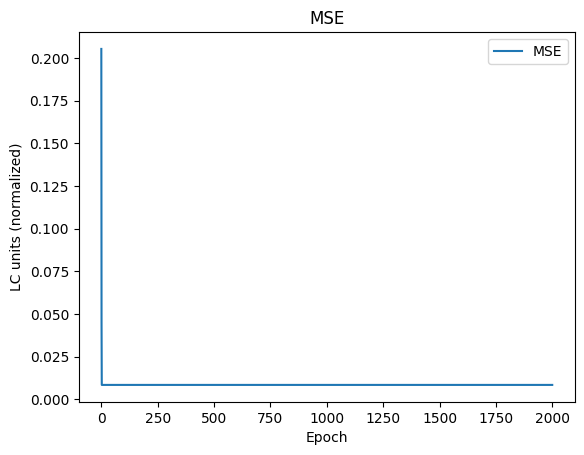

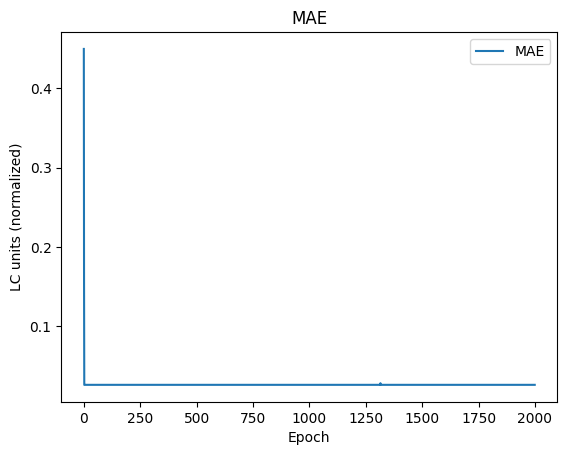

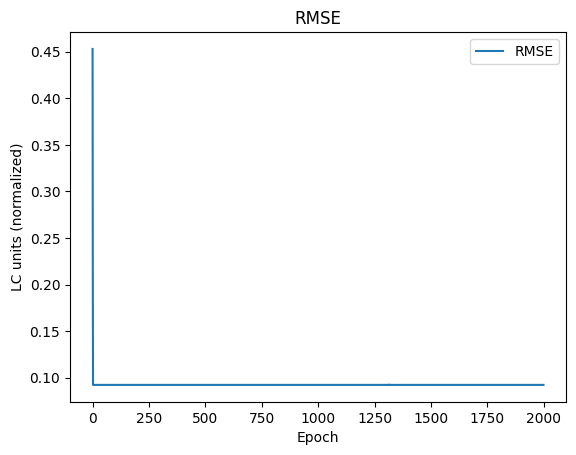

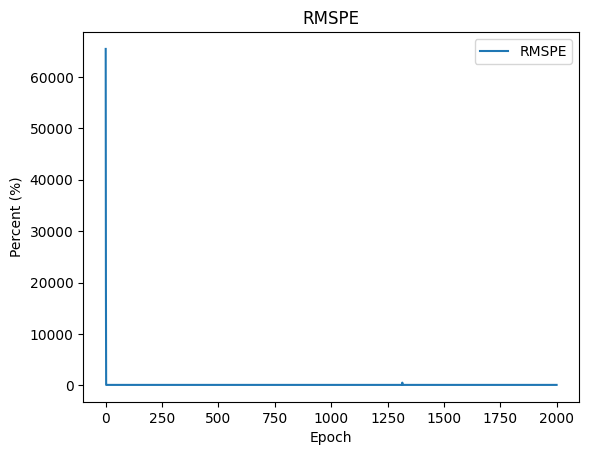

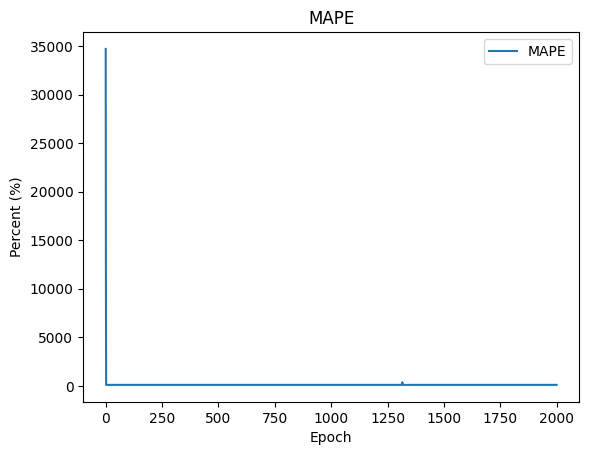

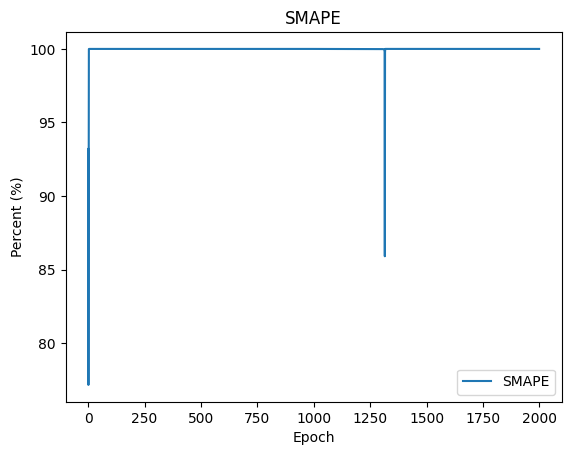

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

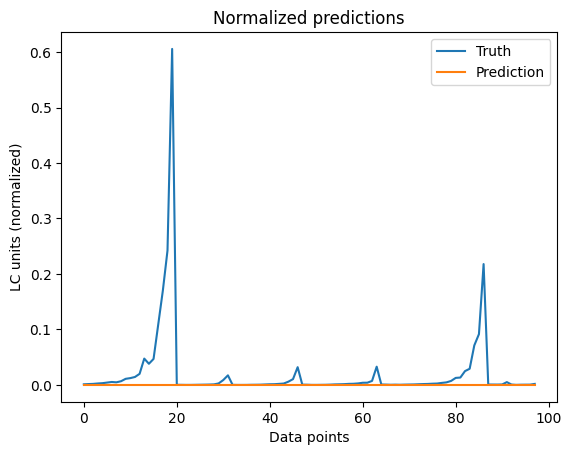

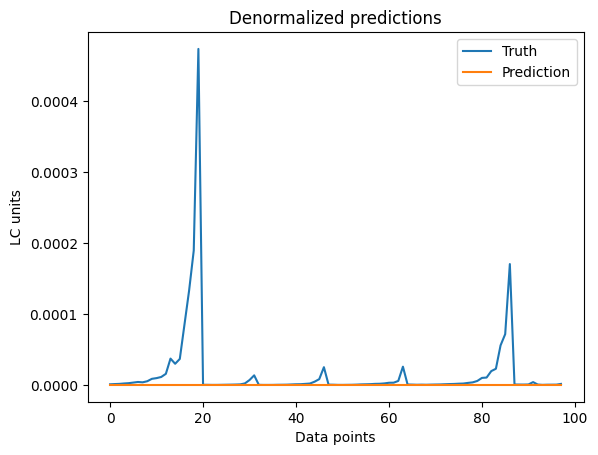

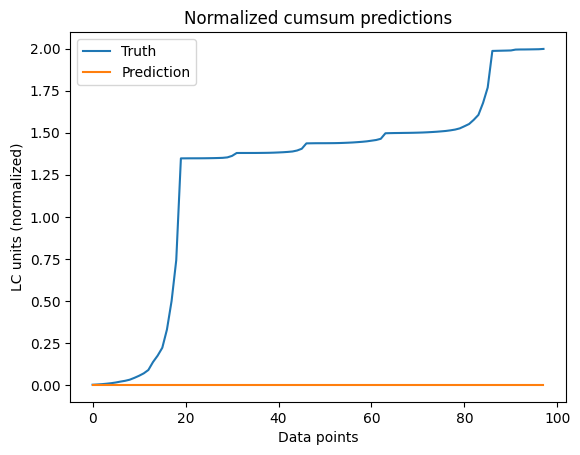

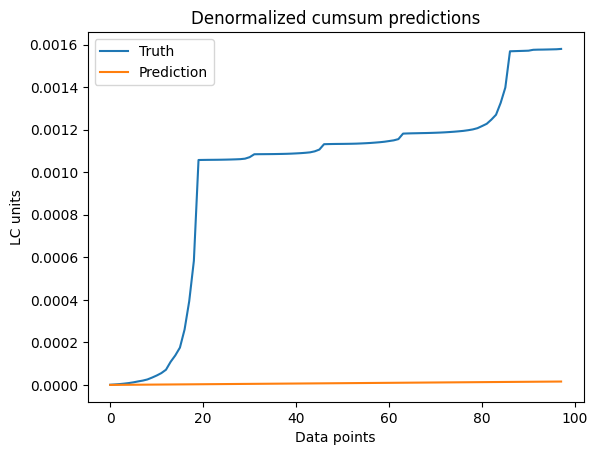

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.0054970603, 0.020394817, 0.07414216, inf, 98.97959, 100.0]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[3.3630123e-09, 1.5952133e-05, 5.7991485e-05, 82.50664, 79.07046, 70.570465]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.9286911, 1.2570885, 1.3887732, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.1799413e-06, 0.0009832517, 0.001086251, 98.270226, 98.229225, 96.66056]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

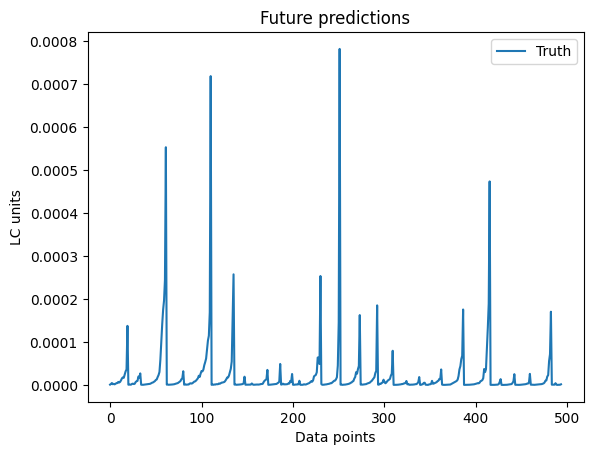

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 90%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 21%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB3-3-1***

## Data

### Get data

In [ ]:
num = nums[8]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

lc = pd.Series(sheet.loc[:,"AD1"]).array

print(lc)

<PandasArray>
[4.6874080464326856e-06,  6.340449121574764e-06, 7.3153862654171975e-06,
  9.381453233668214e-06,  4.503972005207294e-06, 1.4341256580308051e-05,
 1.8050798316604935e-05,  1.586466852326945e-05, 2.8688506685337374e-05,
 1.1377414067802892e-05,
 ...
 3.0190597563318384e-06, 3.7450371757908556e-06,  2.617212582168112e-06,
 1.0789085411148489e-05, 1.9626351532974636e-06,  5.119394251200828e-06,
  4.855636383469424e-06, 2.5942726160802467e-06,  4.283388424812912e-06,
  5.240190672225156e-06]
Length: 483, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[6.328647486952832e-06, 6.443213806051062e-06, 8.283771421702113e-06,
 1.051257913786685e-05, 1.974898623302579e-05, 2.481055344105698e-05,
 2.865141141228378e-05,  2.90826919808751e-05,  2.81777774944203e-05,
 2.883103661588393e-05, 3.168444163748063e-05, 3.576083690859377e-05,
 5.364119351725094e-05,   8.4452229202725e-05,  0.000126139129861258,
 0.0001862694916781038, 0.0002498408721294254, 0.0003114683204330504,
  0.000397323485231027, 0.0006505128112621605,  0.000822915812022984,
 2.419099473627284e-06, 4.395913038024446e-06, 6.253135779843433e-06,
 1.048920330504188e-05, 1.207237619382795e-05, 1.173585860669846e-05,
 1.163751585409045e-05, 1.075789714377606e-05,  9.37734694161918e-06,
 7.843605089874472e-06,   9.2314112407621e-06, 1.108132346416824e-05,
 2.337410478503443e-06, 2.334908458578866e-06, 2.220325086454977e-06,
 3.820247457042569e-06, 6.103919986344408e-06, 6.648974704148713e-06,
  7.29300654711551e-06, 6.807470981584629e-06, 6.464181296905736e-06,
 7.300

In [ ]:
len(lc_pred)

97

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(476, 7, 1) (476,)
[[0.00406455]
 [0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]] 0.014533198015582045
[[0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]] 0.026544038854726337
[[0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]] 0.010330423589687474
[[0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]] 0.015360856452513665
[[0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]] 0.016371989142351343
[[0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]] 0.02866291288293277
[[0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]] 0.026889342462841182
[[0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]
 [0.02688934]] 0.028261887616383752
[[0.02654404]
 [0.0103

In [ ]:
X[1][-1]

array([0.0145332])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

380


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00406455]
 [0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]] 0.014533198015582045
[[0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]] 0.026544038854726337
[[0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]] 0.010330423589687474
[[0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]] 0.015360856452513665
[[0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]] 0.016371989142351343
[[0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]] 0.02866291288293277
[[0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]] 0.026889342462841182
[[0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]
 [0.02688934]] 0.028261887616383752
[[0.02654404]
 [0.01033042]
 [0.01536086]

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

380
380
96
96


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
12/12 - 3s - loss: 0.2048 - mse: 0.2048 - mae: 0.4484 - rmse: 0.4526 - rmspe: inf - mape: 1228571.6250 - smape: 90.6077 - 3s/epoch - 239ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0651 - mse: 0.0651 - mae: 0.2089 - rmse: 0.2552 - rmspe: inf - mape: 75804.3516 - smape: 79.1663 - 61ms/epoch - 5ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0332 - rmse: 0.1009 - rmspe: inf - mape: 144.3668 - smape: 88.3362 - 61ms/epoch - 5ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0336 - rmse: 0.1010 - rmspe: inf - mape: 99.7535 - smape: 99.9981 - 64ms/epoch - 5ms/step
Epoch 5/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0336 - rmse: 0.1010 - rmspe: inf - mape: 99.7383 - smape: 99.9999 - 66ms/epoch - 5ms/step
Epoch 6/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0336 - rmse: 0.1010 - rmspe: inf - mape: 99.7377 - smape: 100.0000 - 65ms/epoch - 5ms/step
Epoch 7/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0336 - rmse: 0.1

### Plot training results

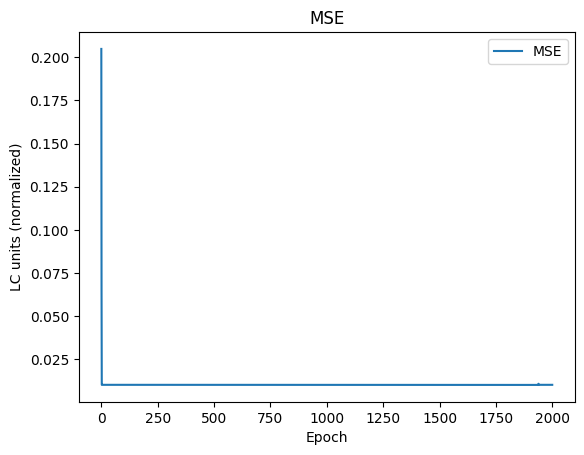

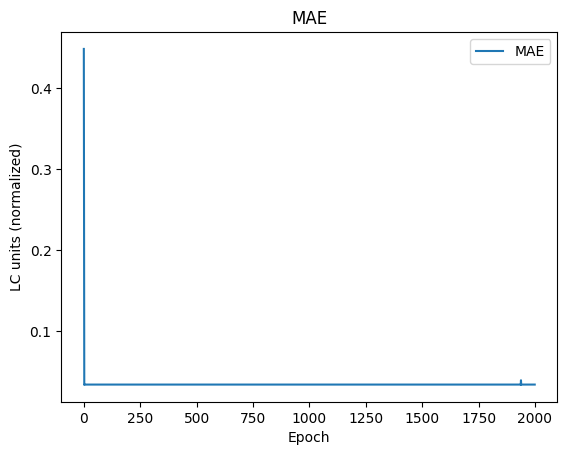

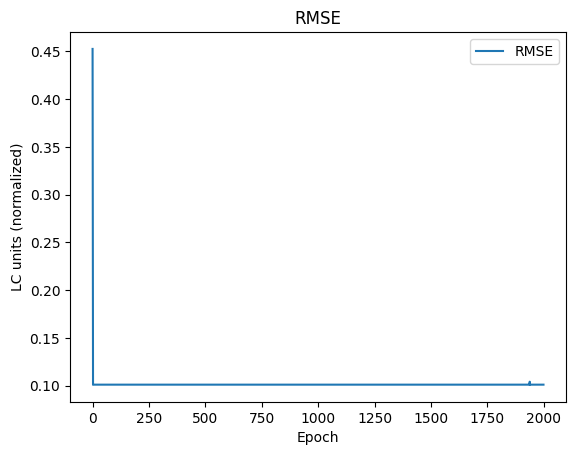

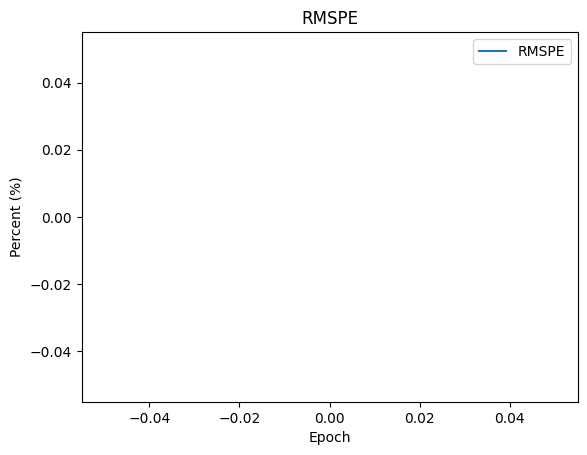

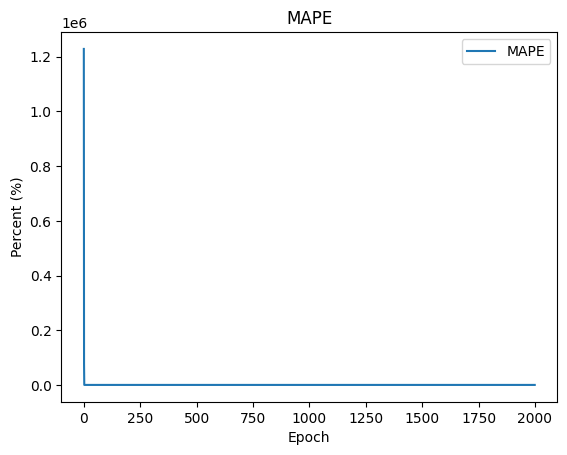

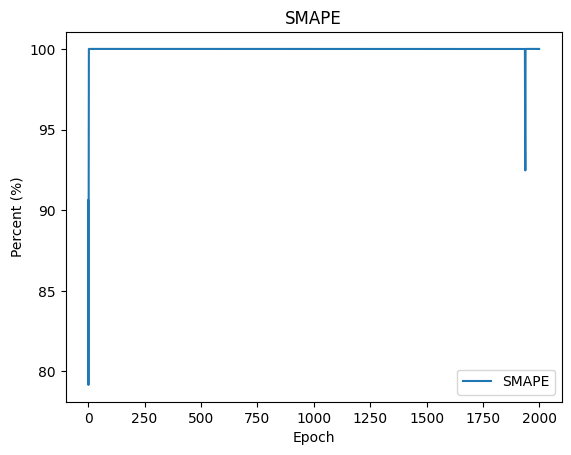

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

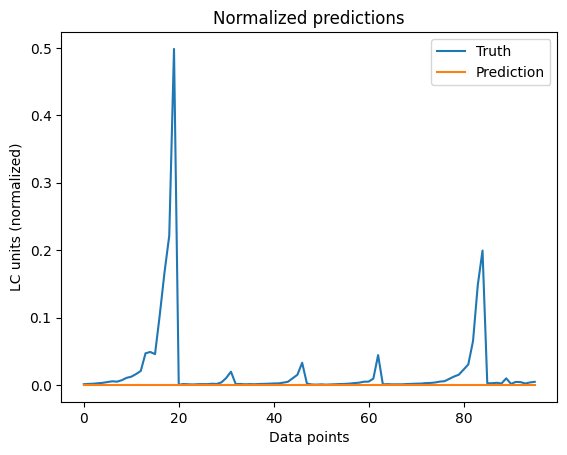

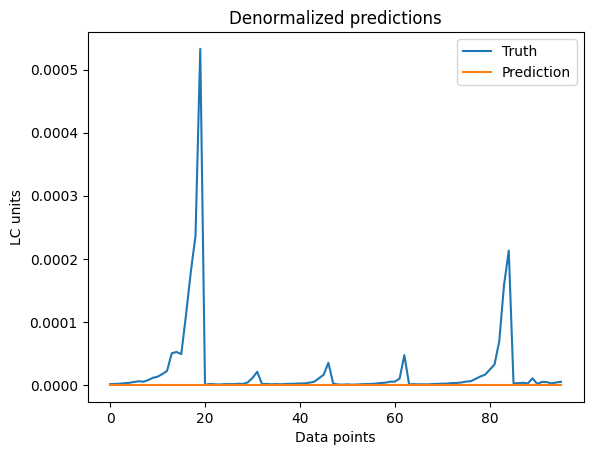

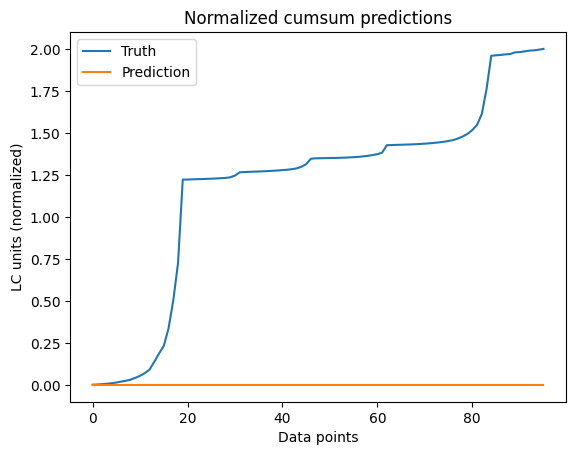

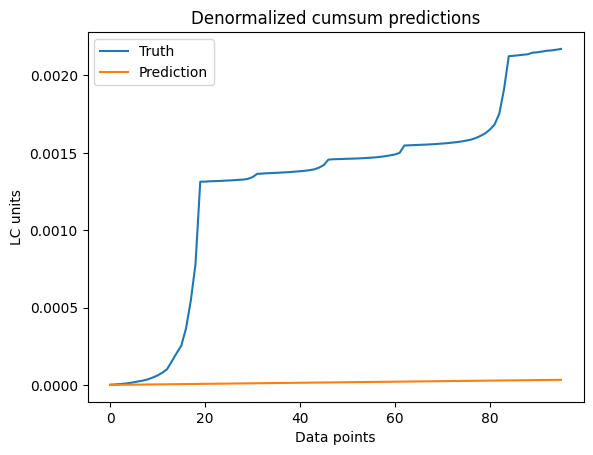

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.004337111, 0.020858208, 0.06585675, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[4.944129e-09, 2.227007e-05, 7.03145e-05, 87.8593, 87.15682, 78.81133]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.7550997, 1.1922117, 1.3248017, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[2.000741e-06, 0.0012729109, 0.0014144755, 97.34588, 97.25205, 94.94955]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

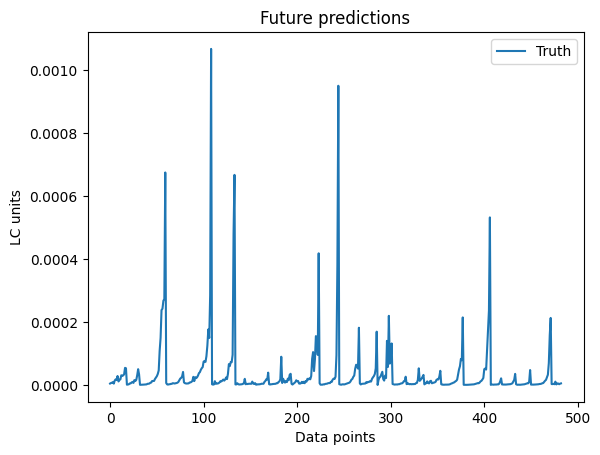

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 67%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 20%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB3-3-2***

## Data

### Get data

In [ ]:
num = nums[9]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

lc = pd.Series(sheet.loc[:,"AD2"]).array

print(lc)

<PandasArray>
[1.0900971837027976e-06, 3.0082659818615873e-06, 5.7521280363945725e-06,
 2.2861077212650323e-06, 3.4026864722228308e-06, 1.9334902286694084e-06,
 3.7012047958663842e-06,   5.37079416463648e-06,   5.52348287496854e-06,
  8.951051782232673e-06,
 ...
   8.51910750810132e-07,  8.204258064737693e-07, 1.0080465039720401e-06,
  5.150911116222735e-06,  8.883350683359231e-07,  3.328008350821552e-07,
  5.842282067078693e-07,  6.491551702094308e-07,  7.041528196562014e-07,
  1.989785627512635e-06]
Length: 494, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[3.068895466640242e-07, 4.026795181744092e-07, 5.460134957502305e-07,
 7.429250672430499e-07, 1.078183458957938e-06, 2.039673972831224e-06,
 3.717548679560423e-06, 6.462815690611023e-06, 1.087570399249671e-05,
 1.722694651107304e-05, 2.591515294625424e-05, 3.702342655742541e-05,
 5.207987851463258e-05, 7.043429650366306e-05, 9.327700536232442e-05,
 0.0001204553118441254,   0.00015291191812139, 0.0001858314935816452,
 0.0002198811416747048, 0.0002559193235356361, 0.0002933848882094026,
 2.072305704814426e-07, 2.050242642326339e-07,  2.04990428187557e-07,
 2.051466196917318e-07, 2.061008927967123e-07, 2.101250942132538e-07,
 2.232407609881193e-07,  2.57256402846906e-07, 3.275331721397379e-07,
  4.43627982349426e-07, 6.079683885218401e-07, 7.852295311749913e-07,
 2.068734232807401e-07, 2.050172867029687e-07, 2.049966099093581e-07,
 2.052085363857259e-07, 2.064887496544543e-07, 2.117068191864746e-07,
 2.274183117378925e-07,  2.67344432813843e-07, 3.452289831784583e-07,
 4.706

In [ ]:
len(lc_pred)

99

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(487, 7, 1) (487,)
[[0.0009053 ]
 [0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]] 0.005283604410893063
[[0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]] 0.005439774542066923
[[0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]] 0.008945494674817894
[[0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]] 0.007203619206017039
[[0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]] 0.009140377251267014
[[0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]] 0.013879738405366592
[[0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]] 0.019557180916903998
[[0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]
 [0.01955718]] 0.02245635824826227
[[0.00543977]
 [0.0089

In [ ]:
X[1][-1]

array([0.0052836])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

389


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.0009053 ]
 [0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]] 0.005283604410893063
[[0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]] 0.005439774542066923
[[0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]] 0.008945494674817894
[[0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]] 0.007203619206017039
[[0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]] 0.009140377251267014
[[0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]] 0.013879738405366592
[[0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]] 0.019557180916903998
[[0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]
 [0.01955718]] 0.02245635824826227
[[0.00543977]
 [0.00894549]
 [0.00720362]

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

389
389
98
98


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
13/13 - 3s - loss: 0.1950 - mse: 0.1950 - mae: 0.4372 - rmse: 0.4416 - rmspe: 58247.6484 - mape: 33105.3633 - smape: 93.0421 - 3s/epoch - 215ms/step
Epoch 2/2000
13/13 - 0s - loss: 0.0282 - mse: 0.0282 - mae: 0.1088 - rmse: 0.1678 - rmspe: 12351.6514 - mape: 7115.4561 - smape: 75.5399 - 68ms/epoch - 5ms/step
Epoch 3/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 99.3424 - mape: 99.2411 - smape: 98.7861 - 69ms/epoch - 5ms/step
Epoch 4/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 99.9999 - mape: 99.9999 - smape: 99.9998 - 69ms/epoch - 5ms/step
Epoch 5/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 100.0000 - mape: 100.0000 - smape: 100.0000 - 69ms/epoch - 5ms/step
Epoch 6/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 100.0000 - mape: 100.0000 - smape: 100.0000 - 68ms/epoch - 5ms/step
Epoch 7/2000
13/13 - 0s - loss: 0.0085 - mse: 0

### Plot training results

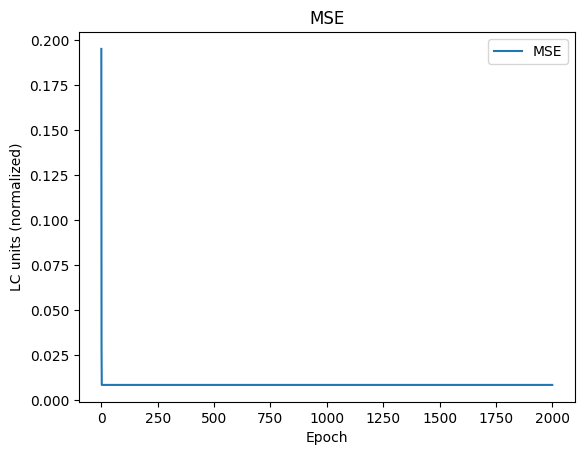

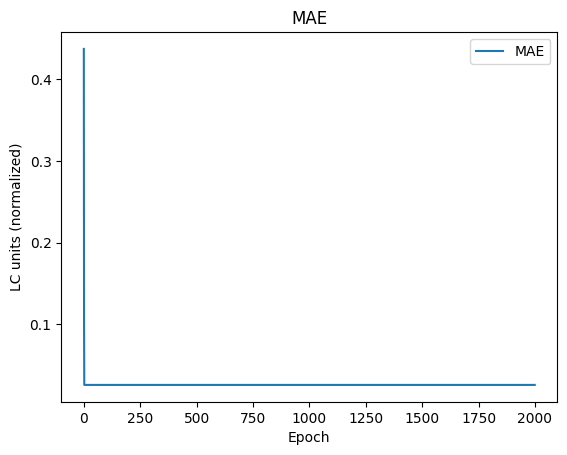

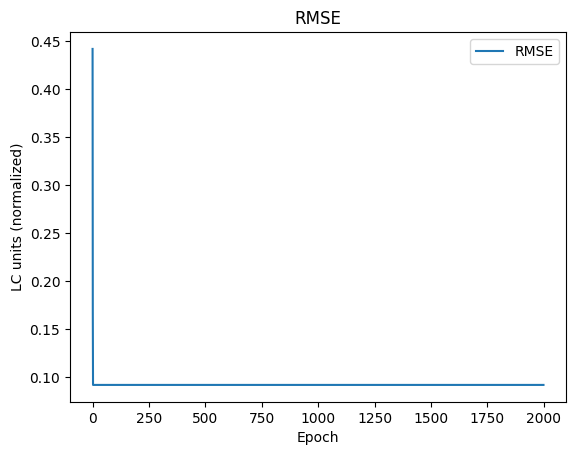

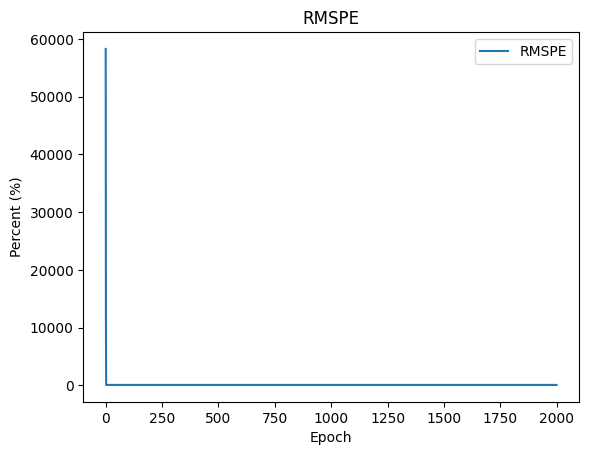

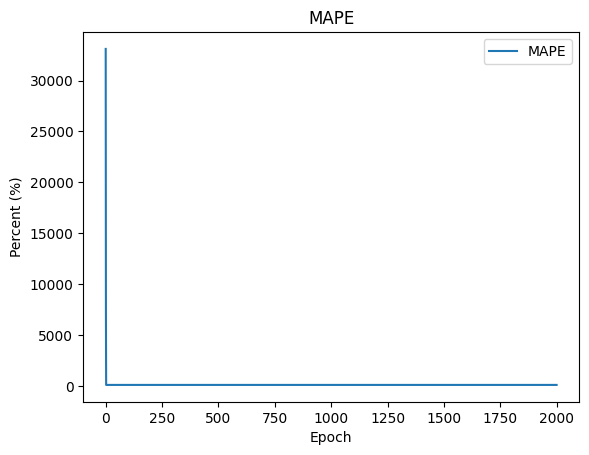

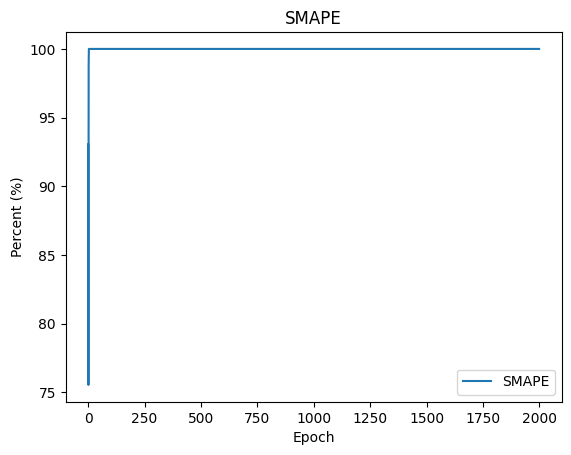

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

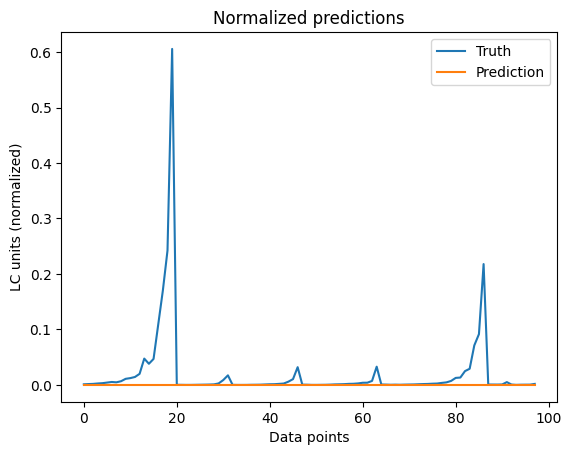

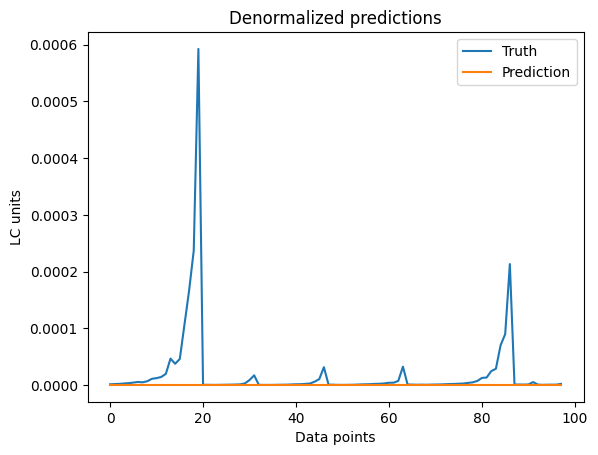

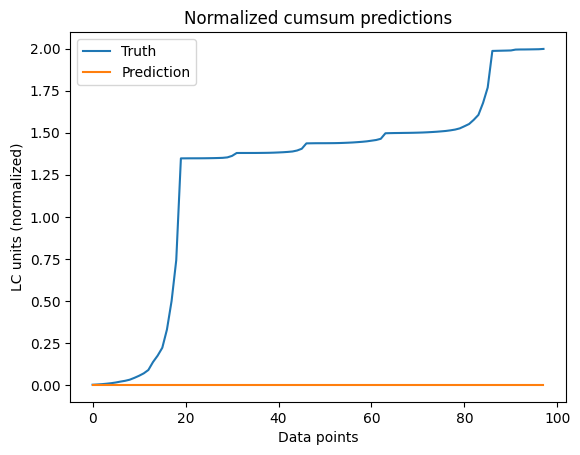

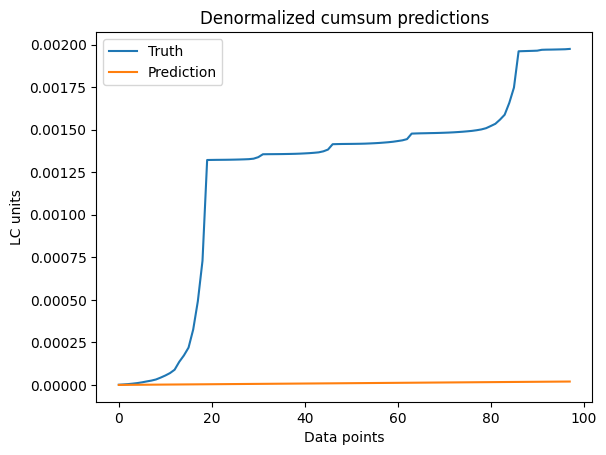

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.0054970603, 0.020394817, 0.07414216, inf, 98.98026, 99.99997]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[5.254706e-09, 1.994017e-05, 7.248935e-05, 82.50664, 79.07046, 70.570465]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.9286911, 1.2570885, 1.3887732, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.8436583e-06, 0.0012290647, 0.0013578138, 98.27022, 98.229225, 96.66056]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

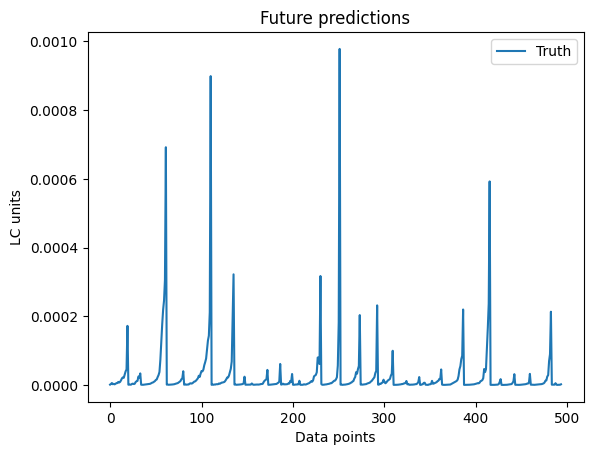

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 88%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 17%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB3-4-1***

## Data

### Get data

In [ ]:
num = nums[10]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

lc = pd.Series(sheet.loc[:,"AD1"]).array

print(lc)

<PandasArray>
[  6.24987739524358e-06,  8.453932162099685e-06,  9.753848353889596e-06,
 1.2508604311557619e-05, 6.0052960069430586e-06, 1.9121675440410734e-05,
  2.406773108880658e-05, 2.1152891364359263e-05,   3.82513422471165e-05,
  1.516988542373719e-05,
 ...
  4.025413008442452e-06,  4.993382901054474e-06, 3.4896167762241494e-06,
 1.4385447214864652e-05,  2.616846871063285e-06,  6.825859001601104e-06,
  6.474181844625899e-06, 3.4590301547736627e-06,  5.711184566417216e-06,
 6.9869208963002075e-06]
Length: 483, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[3.487934918666724e-06, 4.075251581525663e-06, 5.202001375437248e-06,
 7.235677912831306e-06, 9.789952855498996e-06, 1.319822422374273e-05,
 1.656664971960708e-05, 2.011058495554607e-05, 2.571414916019421e-05,
 3.436963743297383e-05, 4.709472341346554e-05, 6.933081749593839e-05,
 0.0001045035969582386, 0.0001465251843910664, 0.0001927744742715731,
 0.0002504564181435853, 0.0003229699505027384, 0.0004155158821959049,
 0.0005409756558947265, 0.0007170421304181218, 0.0008813420427031815,
 2.704960252231103e-06,  3.29254248754296e-06, 2.101000291077071e-06,
 2.698386197153013e-06, 3.714577815117082e-06, 3.790959453908727e-06,
 3.987302079622168e-06, 3.910812665708363e-06, 4.038844053866342e-06,
 4.630417151929578e-06,    5.764623892901e-06, 7.465266662620706e-06,
 1.284362497244729e-06, 1.941069967870135e-06, 1.183787958325411e-06,
 1.302764417232538e-06, 1.681690037003136e-06, 2.499374431863544e-06,
 2.947823077192879e-06,   3.3809767501225e-06, 3.784747605095617e-06,
 4.502

In [ ]:
len(lc_pred)

97

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(476, 7, 1) (476,)
[[0.00406455]
 [0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]] 0.01453319801558204
[[0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]] 0.026544038854726337
[[0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]] 0.010330423589687472
[[0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]] 0.015360856452513668
[[0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]] 0.01637198914235134
[[0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]] 0.028662912882932764
[[0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]] 0.02688934246284118
[[0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]
 [0.02688934]] 0.028261887616383746
[[0.02654404]
 [0.010330

In [ ]:
X[1][-1]

array([0.0145332])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

380


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00406455]
 [0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]] 0.01453319801558204
[[0.00561279]
 [0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]] 0.026544038854726337
[[0.00652592]
 [0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]] 0.010330423589687472
[[0.008461  ]
 [0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]] 0.015360856452513668
[[0.00389274]
 [0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]] 0.01637198914235134
[[0.01310637]
 [0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]] 0.028662912882932764
[[0.01658073]
 [0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]] 0.02688934246284118
[[0.0145332 ]
 [0.02654404]
 [0.01033042]
 [0.01536086]
 [0.01637199]
 [0.02866291]
 [0.02688934]] 0.028261887616383746
[[0.02654404]
 [0.01033042]
 [0.01536086]
 

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

380
380
96
96


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
12/12 - 3s - loss: 0.2039 - mse: 0.2039 - mae: 0.4476 - rmse: 0.4515 - rmspe: inf - mape: 1315903.6250 - smape: 90.5758 - 3s/epoch - 227ms/step
Epoch 2/2000
12/12 - 0s - loss: 0.0608 - mse: 0.0608 - mae: 0.2027 - rmse: 0.2465 - rmspe: inf - mape: 861089.6250 - smape: 78.8373 - 64ms/epoch - 5ms/step
Epoch 3/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0330 - rmse: 0.1009 - rmspe: inf - mape: 109.9491 - smape: 87.0268 - 63ms/epoch - 5ms/step
Epoch 4/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0336 - rmse: 0.1010 - rmspe: inf - mape: 99.8183 - smape: 99.9915 - 63ms/epoch - 5ms/step
Epoch 5/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0336 - rmse: 0.1010 - rmspe: inf - mape: 99.7866 - smape: 99.9994 - 66ms/epoch - 5ms/step
Epoch 6/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0336 - rmse: 0.1010 - rmspe: inf - mape: 99.7505 - smape: 99.9997 - 63ms/epoch - 5ms/step
Epoch 7/2000
12/12 - 0s - loss: 0.0102 - mse: 0.0102 - mae: 0.0336 - rmse: 0.1

### Plot training results

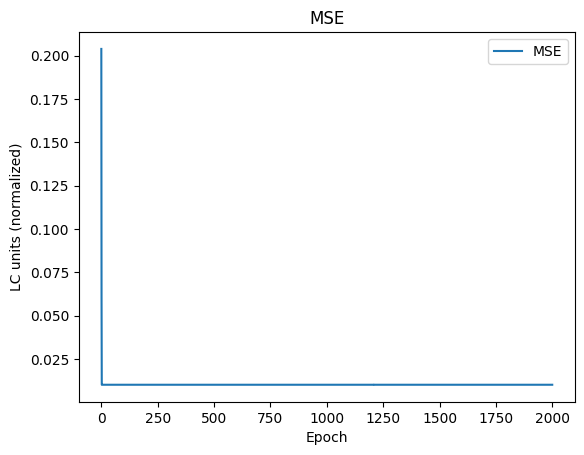

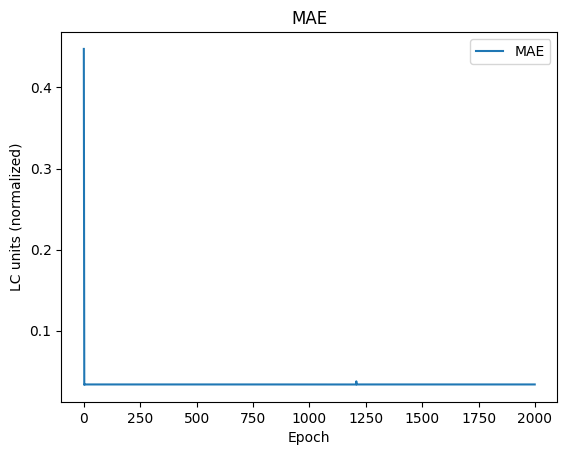

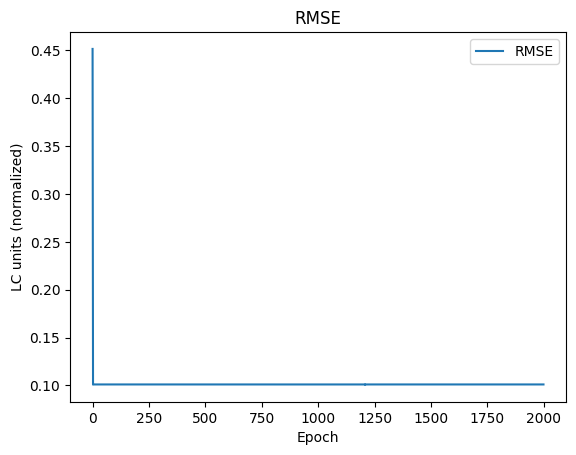

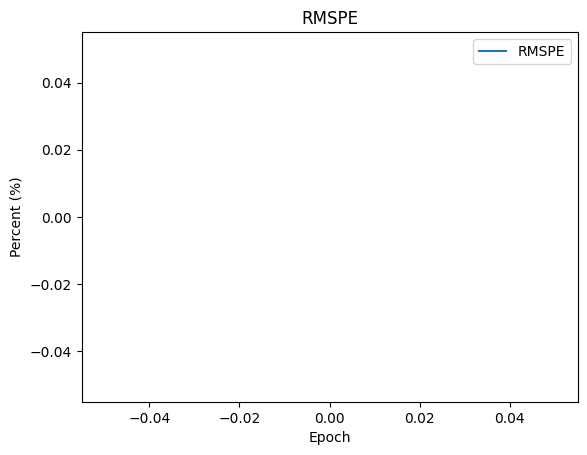

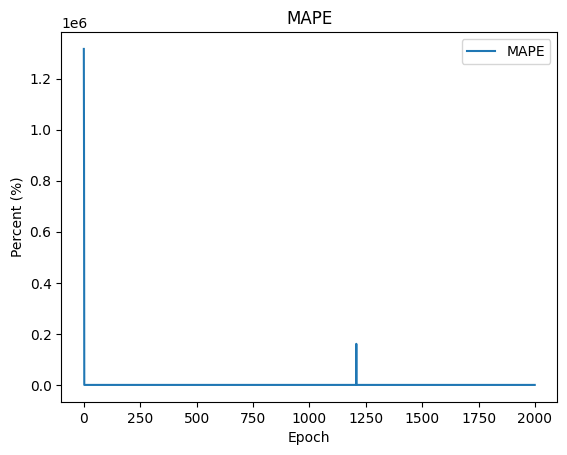

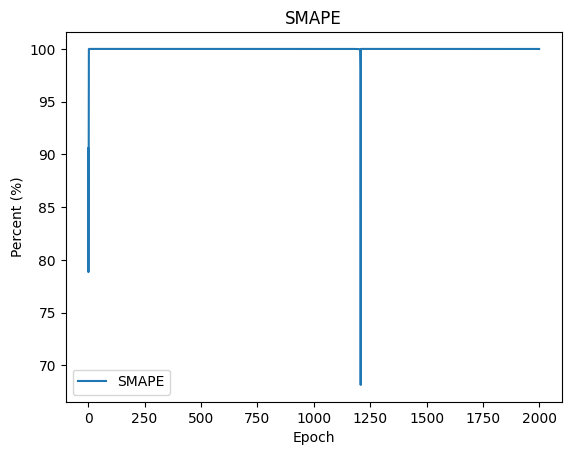

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

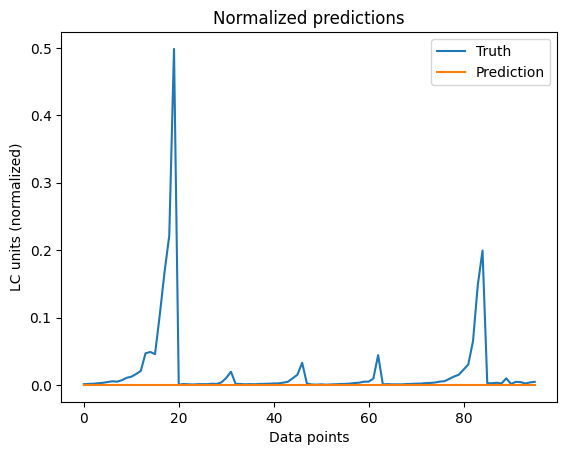

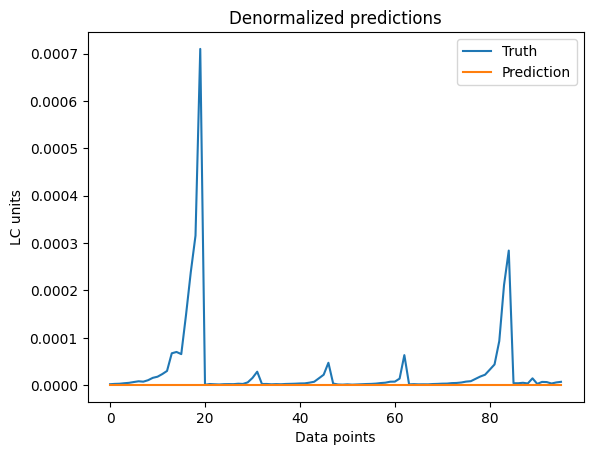

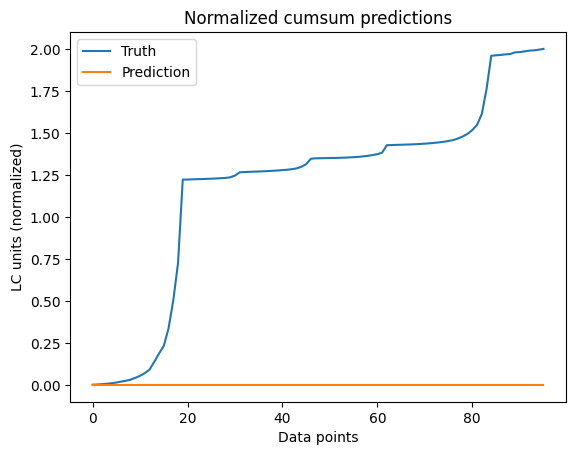

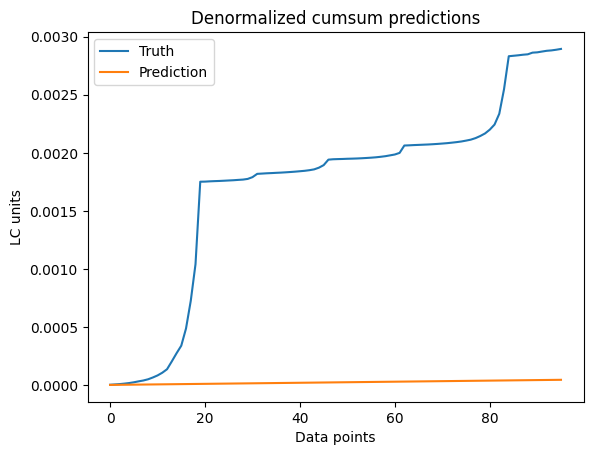

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.0043371087, 0.02085814, 0.065856725, 99.99655, 99.99657, 99.99313]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[8.789557e-09, 2.9693334e-05, 9.3752635e-05, 87.85701, 87.15424, 78.80778]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.7550901, 1.1922086, 1.3247981, 99.99938, 99.99938, 99.998764]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[3.5568553e-06, 0.0016972102, 0.0018859627, 97.34535, 97.251495, 94.9486]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

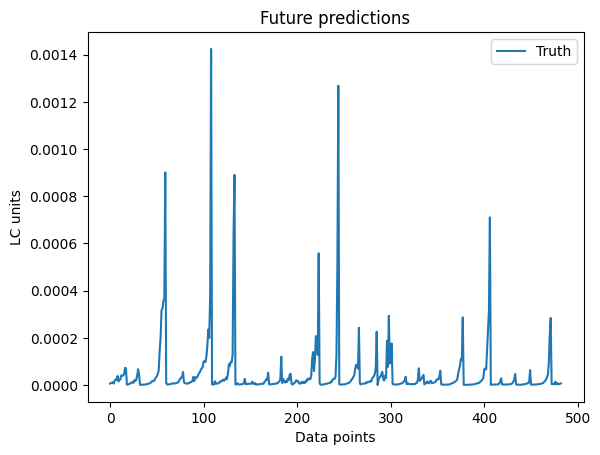

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 90%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 19%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB3-4-2***

## Data

### Get data

In [ ]:
num = nums[11]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')[:-2]

lc = pd.Series(sheet.loc[:,"AD2"]).array

print(lc)

<PandasArray>
[1.4534629116037301e-06, 4.0110213091487825e-06,  7.669504048526097e-06,
  3.048143628353376e-06,  4.536915296297107e-06,  2.577986971559211e-06,
  4.934939727821846e-06,  7.161058886181973e-06,  7.364643833291387e-06,
 1.1934735709643561e-05,
 ...
 1.1358810010801761e-06,  1.093901075298359e-06, 1.3440620052960536e-06,
 6.8678814882969804e-06,  1.184446757781231e-06,  4.437344467762069e-07,
   7.78970942277159e-07,  8.655402269459078e-07,  9.388704262082685e-07,
   2.65304750335018e-06]
Length: 494, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[1.216064447362442e-06, 1.549209514450922e-06, 2.055612867479795e-06,
 2.795158707158407e-06, 3.809779855146189e-06, 5.224846972851083e-06,
 7.105625172698637e-06, 9.498695362708531e-06, 1.301868178416044e-05,
  1.74308388523059e-05,  2.40442059293855e-05,  3.28233654727228e-05,
 4.620606341632083e-05, 6.395397213054821e-05, 8.770939166424796e-05,
 0.0001169875176856294,  0.000156339374370873, 0.0002050251350738108,
 0.0002663283084984869,  0.000338447600370273, 0.0004166061989963055,
 1.832786892919103e-06, 1.246240458385728e-06, 6.718910299241543e-07,
 6.868329478493251e-07, 7.186968105088454e-07, 7.731776463515416e-07,
 8.698440296939225e-07, 1.026026779982203e-06, 1.273610223506694e-06,
 1.645011479922687e-06, 2.231465032309643e-06, 2.942612582046422e-06,
 1.659379677221295e-06, 1.521403078186268e-06, 6.721730869685416e-07,
 6.885828156555363e-07, 7.205208589766698e-07,  7.81120093051868e-07,
  8.82181041106378e-07, 1.046884449351637e-06, 1.307780735260167e-06,
 1.709

In [ ]:
len(lc_pred)

99

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(487, 7, 1) (487,)
[[0.0009053 ]
 [0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]] 0.005283604410893063
[[0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]] 0.005439774542066924
[[0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]] 0.008945494674817893
[[0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]] 0.007203619206017039
[[0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]] 0.009140377251267014
[[0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]] 0.013879738405366594
[[0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]] 0.019557180916903998
[[0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]
 [0.01955718]] 0.022456358248262268
[[0.00543977]
 [0.008

In [ ]:
X[1][-1]

array([0.0052836])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

389


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.0009053 ]
 [0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]] 0.005283604410893063
[[0.00286721]
 [0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]] 0.005439774542066924
[[0.00567363]
 [0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]] 0.008945494674817893
[[0.00212858]
 [0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]] 0.007203619206017039
[[0.00327062]
 [0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]] 0.009140377251267014
[[0.00176793]
 [0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]] 0.013879738405366594
[[0.00357595]
 [0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]] 0.019557180916903998
[[0.0052836 ]
 [0.00543977]
 [0.00894549]
 [0.00720362]
 [0.00914038]
 [0.01387974]
 [0.01955718]] 0.022456358248262268
[[0.00543977]
 [0.00894549]
 [0.00720362

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

389
389
98
98


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
13/13 - 3s - loss: 0.2124 - mse: 0.2124 - mae: 0.4579 - rmse: 0.4608 - rmspe: 62319.3711 - mape: 35530.8320 - smape: 92.3979 - 3s/epoch - 208ms/step
Epoch 2/2000
13/13 - 0s - loss: 0.0602 - mse: 0.0602 - mae: 0.1990 - rmse: 0.2453 - rmspe: 26887.4453 - mape: 14948.1299 - smape: 80.3403 - 69ms/epoch - 5ms/step
Epoch 3/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0257 - rmse: 0.0922 - rmspe: 108.9013 - mape: 99.0960 - smape: 89.1052 - 67ms/epoch - 5ms/step
Epoch 4/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 99.9951 - mape: 99.9949 - smape: 99.9903 - 69ms/epoch - 5ms/step
Epoch 5/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 99.9993 - mape: 99.9994 - smape: 99.9987 - 70ms/epoch - 5ms/step
Epoch 6/2000
13/13 - 0s - loss: 0.0085 - mse: 0.0085 - mae: 0.0259 - rmse: 0.0923 - rmspe: 99.9996 - mape: 99.9996 - smape: 99.9993 - 68ms/epoch - 5ms/step
Epoch 7/2000
13/13 - 0s - loss: 0.0085 - mse: 0.008

### Plot training results

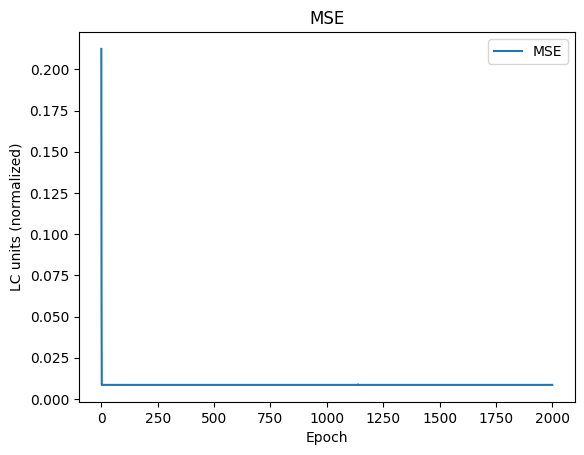

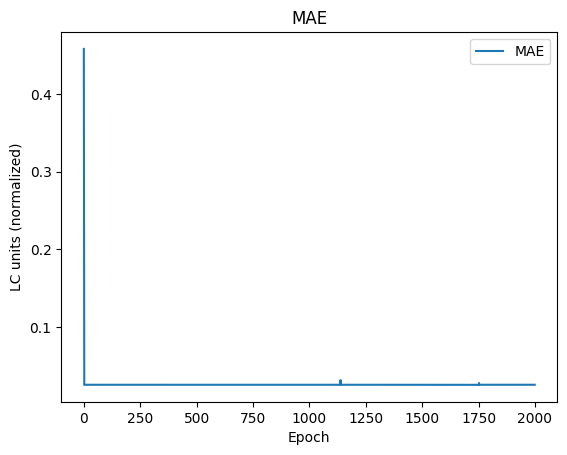

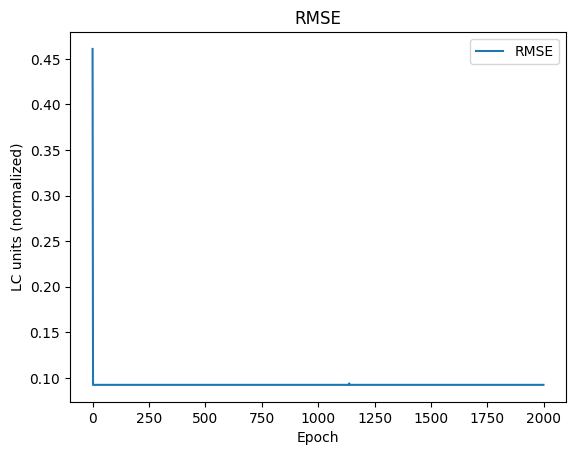

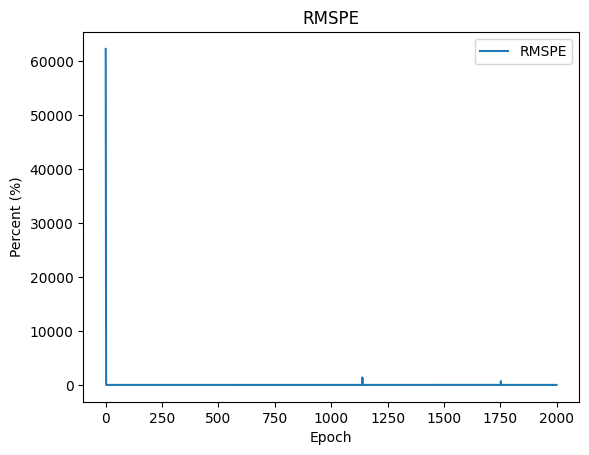

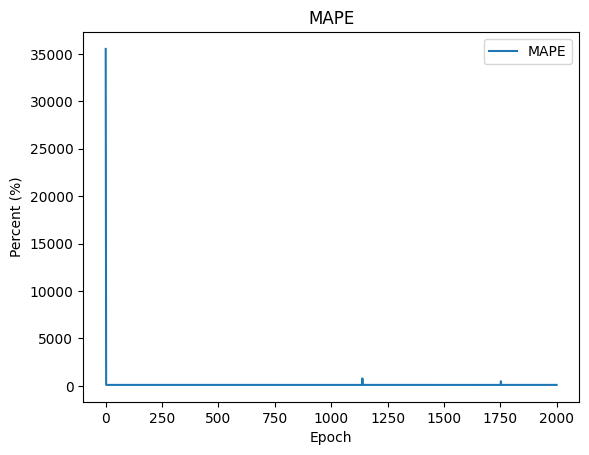

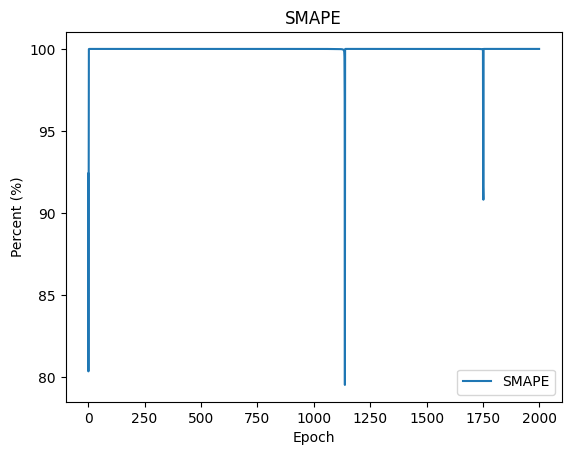

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

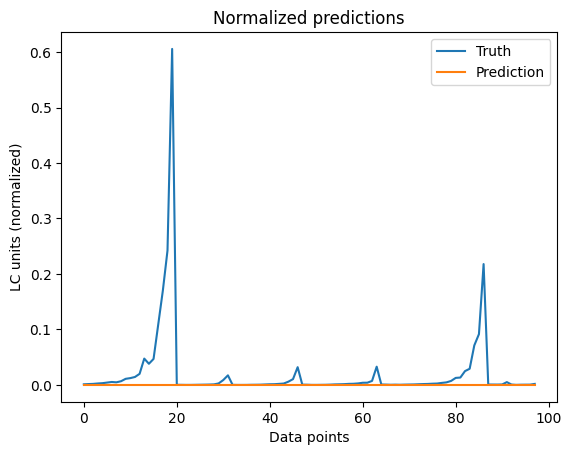

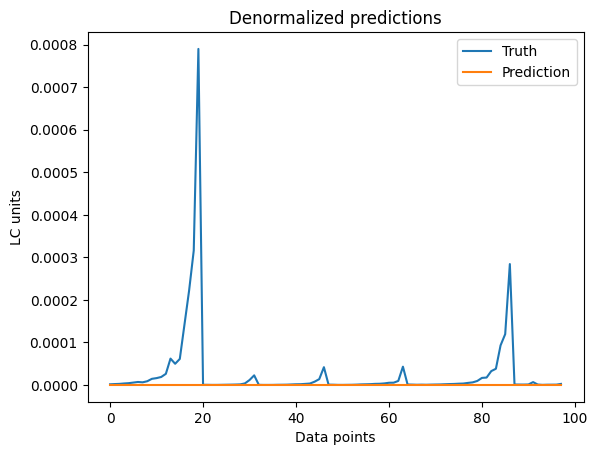

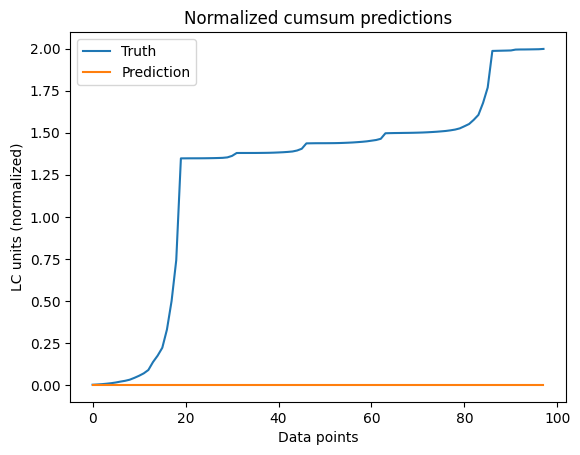

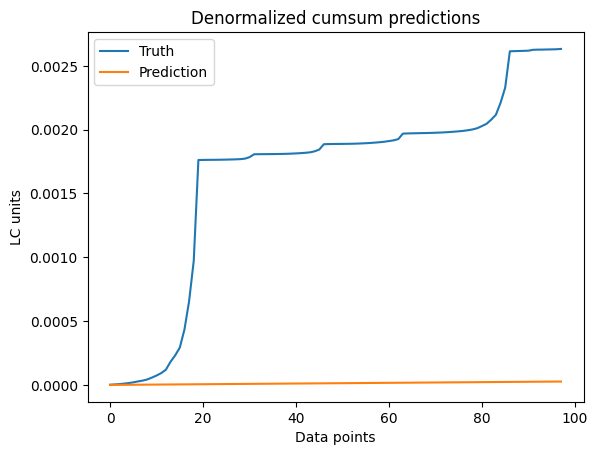

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.0054970603, 0.020394817, 0.07414216, inf, 98.97961, 100.0]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[9.341699e-09, 2.6586893e-05, 9.665246e-05, 82.50664, 79.07046, 70.570465]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[1.9286911, 1.2570885, 1.3887732, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[3.2776154e-06, 0.0016387532, 0.0018104186, 98.270226, 98.229225, 96.66056]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

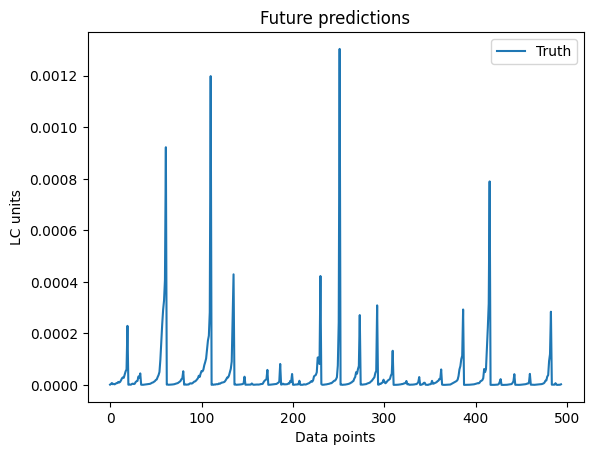

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 88%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 19%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB4-1***

## Data

### Get data

In [ ]:
num = nums[12]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"LC1"]).array

print(lc)

<PandasArray>
[8.10754171586822e-06, 3.20969204300993e-05,  9.3115942898016e-05,
 9.82238236214372e-05, 0.000130502086519986, 0.000176038441775124,
 0.000250089092988489, 0.000251669217116909,  0.00025812457356209,
 3.61858166944746e-05,
 ...
             8.97e-07,             7.82e-07,             5.23e-09,
             2.58e-08,             2.78e-07,             9.83e-07,
             1.39e-06,             2.25e-06,             6.06e-07,
             2.53e-06]
Length: 387, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[1.537131844031592e-08, 3.421169125772394e-08, 7.844544569479694e-08,
 2.202482249913373e-07, 6.948106374693452e-07, 4.240043836034602e-06,
 1.783611151040532e-05, 1.992724355659448e-05, 2.546594078012276e-05,
 3.092623592237942e-05, 3.331551124574617e-05, 1.066177262032397e-07,
 6.074737601835523e-09, 5.929484458988554e-09, 1.527565807180054e-08,
 4.963514399491942e-08, 1.195843992718437e-06, 9.879057870421093e-06,
 3.007722261827439e-05, 1.907882870000321e-05,   2.6154802981182e-05,
 3.466807174845599e-05, 4.012537465314381e-05, 4.594127312884666e-05,
 6.480921001639217e-05, 8.908241579774767e-05, 1.827188384595502e-06,
 8.550779284632881e-08, 2.830602454650943e-07, 9.698344456410268e-07,
  3.84833401767537e-06, 6.463979389081942e-06, 2.256678635603748e-05,
 3.224967440473847e-05, 3.840006320388056e-05, 4.024027293780819e-05,
 6.121164187788963e-05, 8.208747749449685e-05, 0.0001198385289171711,
 0.0001273413799935952, 0.0001000108823063783, 5.415640407591127e-05,
  4.46

In [ ]:
len(lc_pred)

77

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(380, 7, 1) (380,)
[[0.00361648]
 [0.01431727]
 [0.04153565]
 [0.04381409]
 [0.05821225]
 [0.07852437]
 [0.11155569]] 0.1122605229894742
[[0.01431727]
 [0.04153565]
 [0.04381409]
 [0.05821225]
 [0.07852437]
 [0.11155569]
 [0.11226052]] 0.11514002372765243
[[0.04153565]
 [0.04381409]
 [0.05821225]
 [0.07852437]
 [0.11155569]
 [0.11226052]
 [0.11514002]] 0.016141181501405682
[[0.04381409]
 [0.05821225]
 [0.07852437]
 [0.11155569]
 [0.11226052]
 [0.11514002]
 [0.01614118]] 0.03455678717134013
[[0.05821225]
 [0.07852437]
 [0.11155569]
 [0.11226052]
 [0.11514002]
 [0.01614118]
 [0.03455679]] 0.05259251264397359
[[0.07852437]
 [0.11155569]
 [0.11226052]
 [0.11514002]
 [0.01614118]
 [0.03455679]
 [0.05259251]] 0.07810515874339992
[[0.11155569]
 [0.11226052]
 [0.11514002]
 [0.01614118]
 [0.03455679]
 [0.05259251]
 [0.07810516]] 0.08947149508258455
[[0.11226052]
 [0.11514002]
 [0.01614118]
 [0.03455679]
 [0.05259251]
 [0.07810516]
 [0.0894715 ]] 0.1588033121913821
[[0.11514002]
 [0.01614118]
 [

In [ ]:
X[1][-1]

array([0.11226052])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

304


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00361648]
 [0.01431727]
 [0.04153565]
 [0.04381409]
 [0.05821225]
 [0.07852437]
 [0.11155569]] 0.1122605229894742
[[0.01431727]
 [0.04153565]
 [0.04381409]
 [0.05821225]
 [0.07852437]
 [0.11155569]
 [0.11226052]] 0.11514002372765243
[[0.04153565]
 [0.04381409]
 [0.05821225]
 [0.07852437]
 [0.11155569]
 [0.11226052]
 [0.11514002]] 0.016141181501405682
[[0.04381409]
 [0.05821225]
 [0.07852437]
 [0.11155569]
 [0.11226052]
 [0.11514002]
 [0.01614118]] 0.03455678717134013
[[0.05821225]
 [0.07852437]
 [0.11155569]
 [0.11226052]
 [0.11514002]
 [0.01614118]
 [0.03455679]] 0.05259251264397359
[[0.07852437]
 [0.11155569]
 [0.11226052]
 [0.11514002]
 [0.01614118]
 [0.03455679]
 [0.05259251]] 0.07810515874339992
[[0.11155569]
 [0.11226052]
 [0.11514002]
 [0.01614118]
 [0.03455679]
 [0.05259251]
 [0.07810516]] 0.08947149508258455
[[0.11226052]
 [0.11514002]
 [0.01614118]
 [0.03455679]
 [0.05259251]
 [0.07810516]
 [0.0894715 ]] 0.1588033121913821
[[0.11514002]
 [0.01614118]
 [0.03455679]
 [0.052

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

304
304
76
76


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.1453 - mse: 0.1453 - mae: 0.3584 - rmse: 0.3811 - rmspe: inf - mape: 2601873.7500 - smape: 63.2942 - 3s/epoch - 277ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.0904 - mse: 0.0904 - mae: 0.2702 - rmse: 0.3007 - rmspe: inf - mape: 2105996.7500 - smape: 58.8703 - 59ms/epoch - 6ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0531 - mse: 0.0531 - mae: 0.1474 - rmse: 0.2305 - rmspe: inf - mape: 553866.8125 - smape: 60.5957 - 58ms/epoch - 6ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0501 - mse: 0.0501 - mae: 0.1394 - rmse: 0.2239 - rmspe: inf - mape: 460693.3750 - smape: 56.9432 - 56ms/epoch - 6ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0432 - mse: 0.0432 - mae: 0.1617 - rmse: 0.2078 - rmspe: inf - mape: 928543.6875 - smape: 51.6152 - 57ms/epoch - 6ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0395 - mse: 0.0395 - mae: 0.1387 - rmse: 0.1987 - rmspe: inf - mape: 865649.3750 - smape: 49.6754 - 55ms/epoch - 6ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0358 - mse: 0.0358 - mae: 0.

### Plot training results

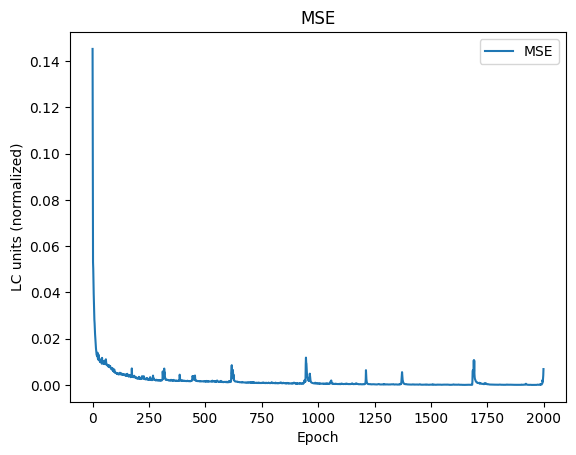

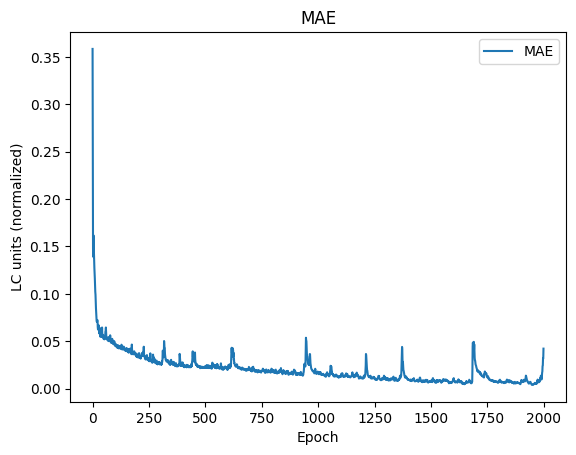

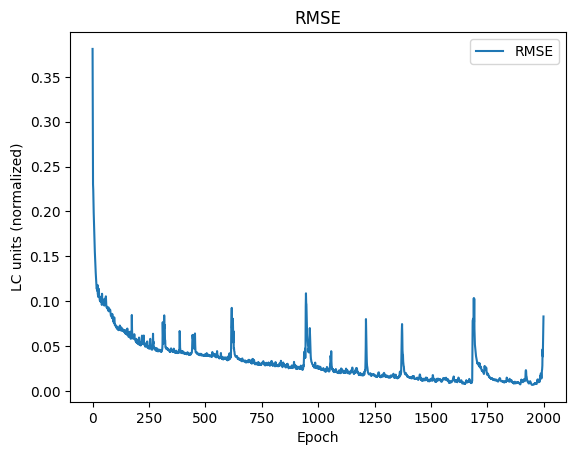

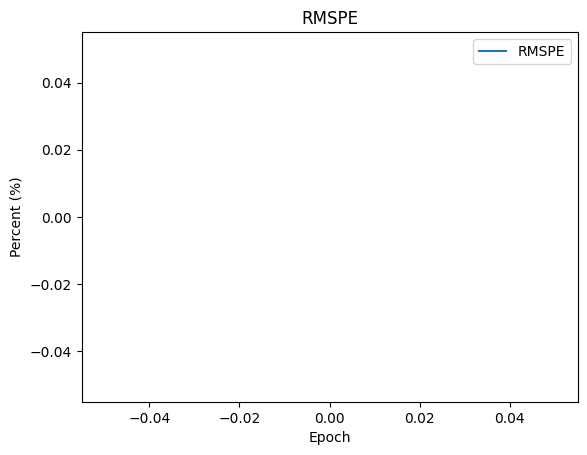

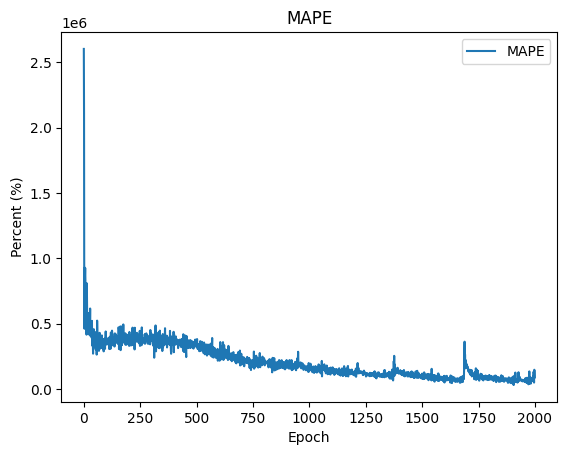

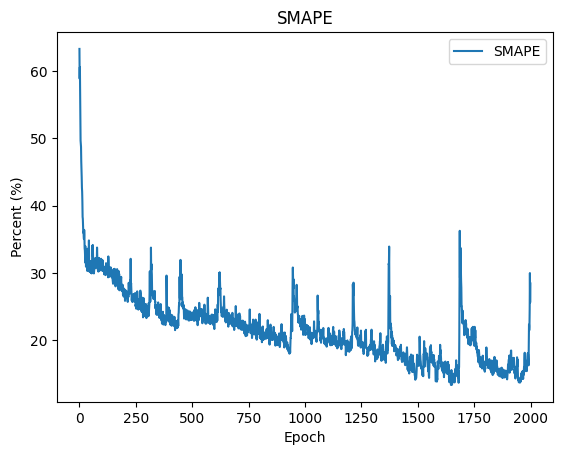

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

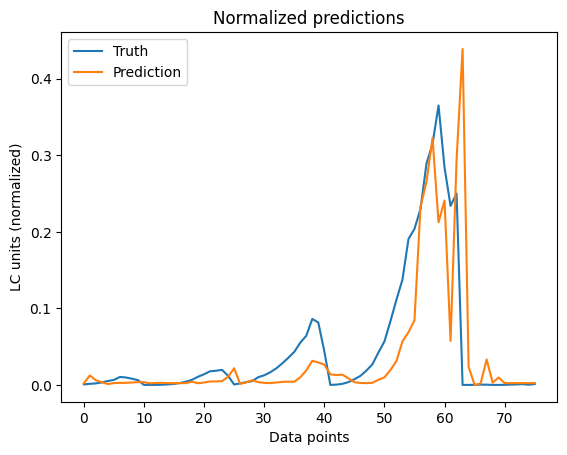

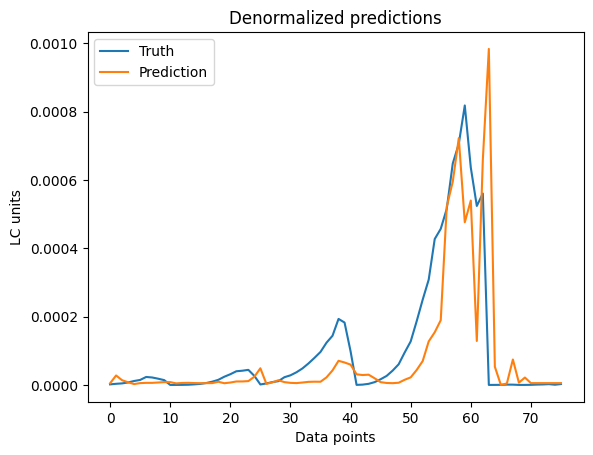

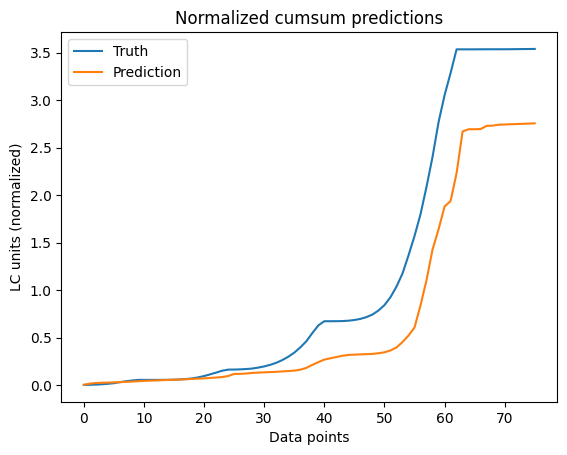

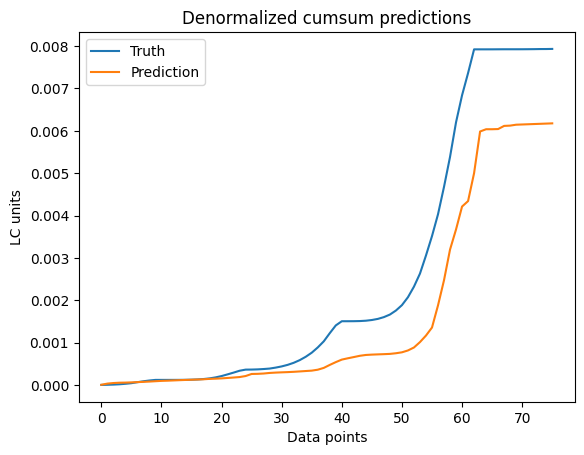

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.0042054607, 0.02794758, 0.064849526, 3678514.5, 471017.1, 55.915142]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[2.1135845e-08, 6.265377e-05, 0.00014538172, 3675380.0, 14885.737, 55.91511]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.29842898, 0.3824664, 0.5462865, 94.85203, 52.864193, 25.326601]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.4998482e-06, 0.00085742545, 0.0012246829, 94.851974, 52.864178, 25.326597]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

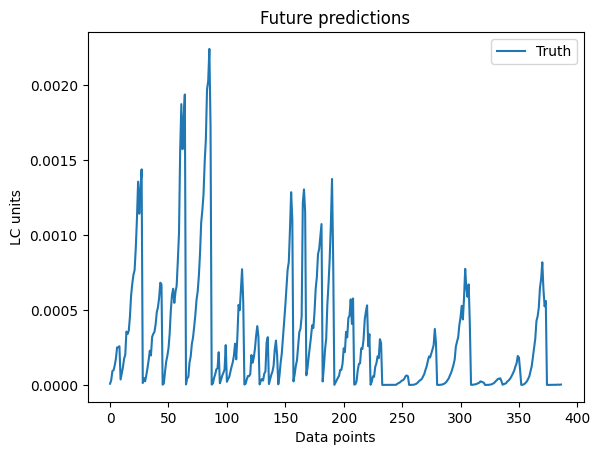

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 90%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 18%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB4-2***

## Data

### Get data

In [ ]:
num = nums[13]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"LC2"]).array

print(lc)

<PandasArray>
[3.47608649213592e-05,  6.5417243805523e-05, 0.000100294726166931,
 0.000140801101694561, 0.000186917964819828, 0.000195873635919464,
 0.000272519526805043, 0.000357340988638686, 0.000425176738414785,
  7.3111231132059e-05,
 ...
              1.6e-06,              1.5e-06,             4.36e-08,
             5.11e-07,             1.04e-06,             2.23e-06,
             4.28e-06,              4.5e-06,             1.72e-06,
             6.26e-06]
Length: 387, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[2.527701159493745e-09,  1.45623815228646e-07,  3.57375171233798e-07,
 9.721757123770658e-07, 2.723954366956605e-06,  8.62193337525241e-06,
 1.913420783239417e-05, 1.450179570383625e-05, 2.037529156950768e-05,
 2.338523881917354e-05, 3.086870856350288e-05, 1.271332905616873e-07,
  7.69947106071811e-10, 6.420250286964801e-08,  1.95752107856606e-07,
 5.559354576689657e-07, 3.348787231516326e-06, 8.104950211418327e-06,
 3.000887409143616e-05, 3.785423905355856e-05, 3.949655365431681e-05,
 2.976505311380606e-05, 2.911524643423036e-05, 3.993397695012391e-05,
  4.93144107167609e-05, 6.414893869077787e-05,  8.98133237114962e-07,
 2.570002699542329e-08, 5.280959953779529e-07, 1.369306687593053e-06,
 3.904699497070396e-06, 9.442702321393881e-06, 2.623772343213204e-05,
 9.176741514238529e-06, 2.016541475313716e-05, 8.138486737152562e-05,
 9.399050031788647e-05, 0.0001534413750050589, 0.0001649730984354392,
 0.0001678494591033086, 0.0001125713970395736, 5.538709956454113e-05,
 1.211

In [ ]:
len(lc_pred)

77

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(380, 7, 1) (380,)
[[0.015044  ]
 [0.02831165]
 [0.04340613]
 [0.06093671]
 [0.08089543]
 [0.08477132]
 [0.11794257]] 0.1546520921069806
[[0.02831165]
 [0.04340613]
 [0.06093671]
 [0.08089543]
 [0.08477132]
 [0.11794257]
 [0.15465209]] 0.18401043930891148
[[0.04340613]
 [0.06093671]
 [0.08089543]
 [0.08477132]
 [0.11794257]
 [0.15465209]
 [0.18401044]] 0.03164149764104834
[[0.06093671]
 [0.08089543]
 [0.08477132]
 [0.11794257]
 [0.15465209]
 [0.18401044]
 [0.0316415 ]] 0.05709687443137105
[[0.08089543]
 [0.08477132]
 [0.11794257]
 [0.15465209]
 [0.18401044]
 [0.0316415 ]
 [0.05709687]] 0.07037014840651322
[[0.08477132]
 [0.11794257]
 [0.15465209]
 [0.18401044]
 [0.0316415 ]
 [0.05709687]
 [0.07037015]] 0.12064265880713627
[[0.11794257]
 [0.15465209]
 [0.18401044]
 [0.0316415 ]
 [0.05709687]
 [0.07037015]
 [0.12064266]] 0.12169500658806204
[[0.15465209]
 [0.18401044]
 [0.0316415 ]
 [0.05709687]
 [0.07037015]
 [0.12064266]
 [0.12169501]] 0.15370301455637192
[[0.18401044]
 [0.0316415 ]
 [

In [ ]:
X[1][-1]

array([0.15465209])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

304


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.015044  ]
 [0.02831165]
 [0.04340613]
 [0.06093671]
 [0.08089543]
 [0.08477132]
 [0.11794257]] 0.1546520921069806
[[0.02831165]
 [0.04340613]
 [0.06093671]
 [0.08089543]
 [0.08477132]
 [0.11794257]
 [0.15465209]] 0.18401043930891148
[[0.04340613]
 [0.06093671]
 [0.08089543]
 [0.08477132]
 [0.11794257]
 [0.15465209]
 [0.18401044]] 0.03164149764104834
[[0.06093671]
 [0.08089543]
 [0.08477132]
 [0.11794257]
 [0.15465209]
 [0.18401044]
 [0.0316415 ]] 0.05709687443137105
[[0.08089543]
 [0.08477132]
 [0.11794257]
 [0.15465209]
 [0.18401044]
 [0.0316415 ]
 [0.05709687]] 0.07037014840651322
[[0.08477132]
 [0.11794257]
 [0.15465209]
 [0.18401044]
 [0.0316415 ]
 [0.05709687]
 [0.07037015]] 0.12064265880713627
[[0.11794257]
 [0.15465209]
 [0.18401044]
 [0.0316415 ]
 [0.05709687]
 [0.07037015]
 [0.12064266]] 0.12169500658806204
[[0.15465209]
 [0.18401044]
 [0.0316415 ]
 [0.05709687]
 [0.07037015]
 [0.12064266]
 [0.12169501]] 0.15370301455637192
[[0.18401044]
 [0.0316415 ]
 [0.05709687]
 [0.070

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

304
304
76
76


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.1237 - mse: 0.1237 - mae: 0.3264 - rmse: 0.3517 - rmspe: inf - mape: 2208074.7500 - smape: 57.4463 - 3s/epoch - 272ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.0709 - mse: 0.0709 - mae: 0.2155 - rmse: 0.2663 - rmspe: inf - mape: 1269794.7500 - smape: 51.4719 - 55ms/epoch - 6ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0552 - mse: 0.0552 - mae: 0.1573 - rmse: 0.2350 - rmspe: inf - mape: 683815.1250 - smape: 50.3091 - 55ms/epoch - 6ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0491 - mse: 0.0491 - mae: 0.1762 - rmse: 0.2216 - rmspe: inf - mape: 1053212.3750 - smape: 47.8066 - 56ms/epoch - 6ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0439 - mse: 0.0439 - mae: 0.1527 - rmse: 0.2095 - rmspe: inf - mape: 796053.8125 - smape: 46.6481 - 56ms/epoch - 6ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0383 - mse: 0.0383 - mae: 0.1472 - rmse: 0.1958 - rmspe: inf - mape: 777354.4375 - smape: 44.4307 - 56ms/epoch - 6ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0350 - mse: 0.0350 - mae: 0

### Plot training results

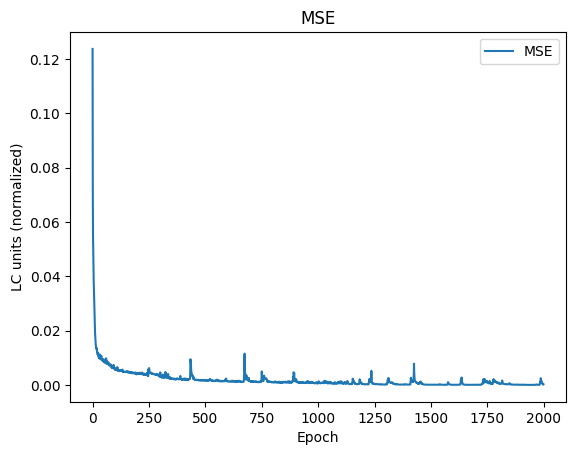

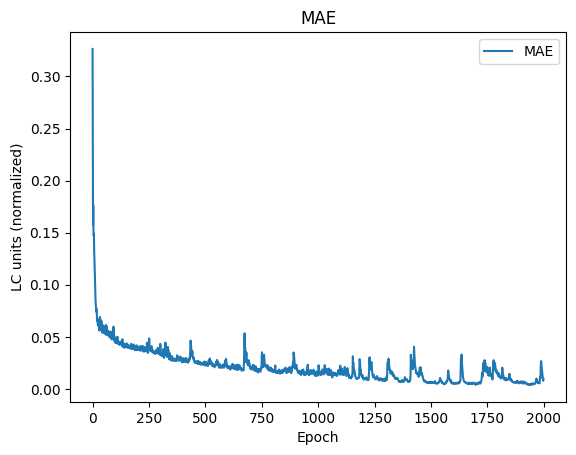

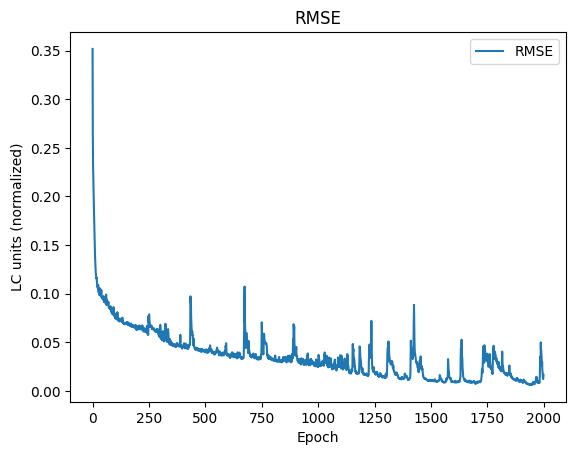

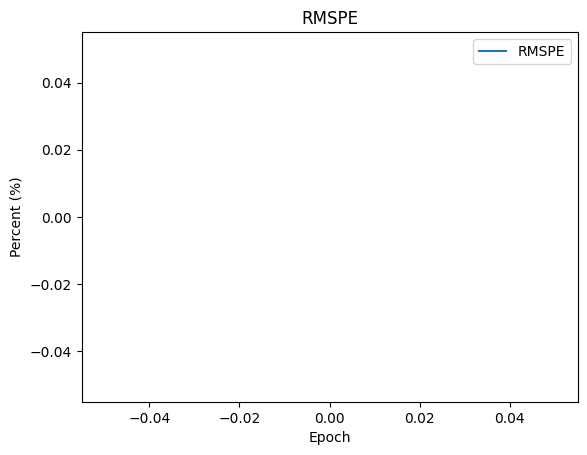

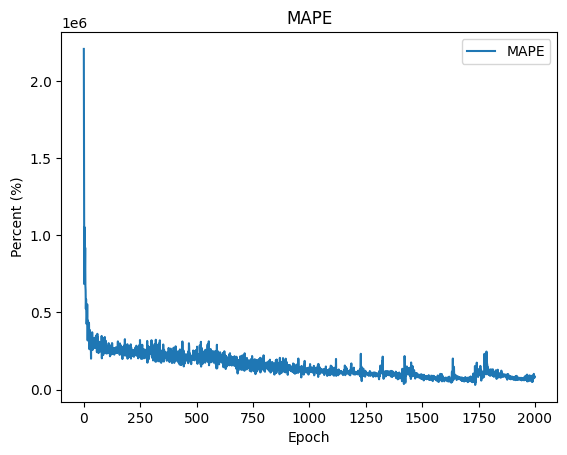

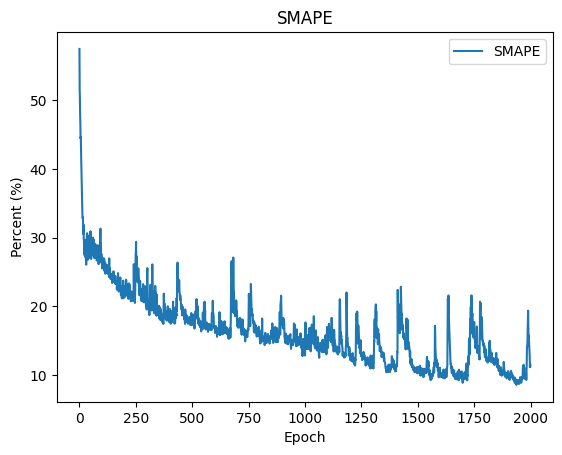

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

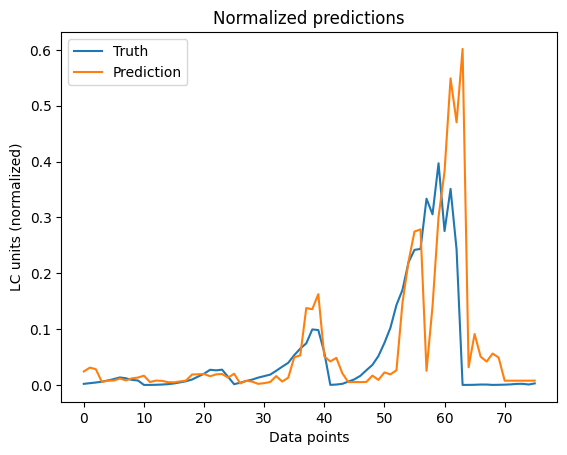

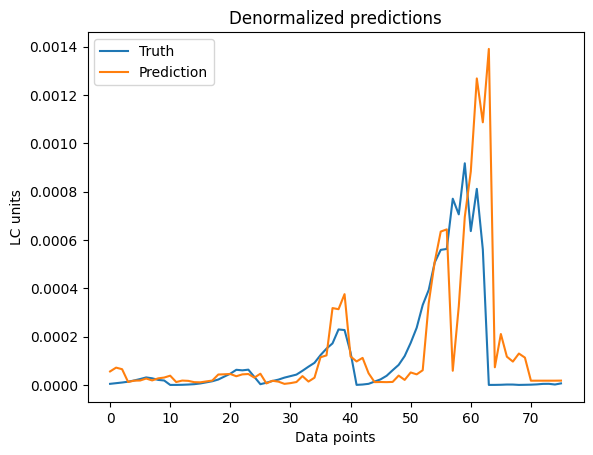

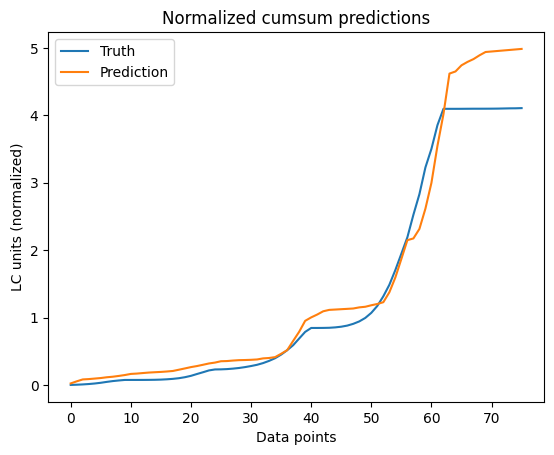

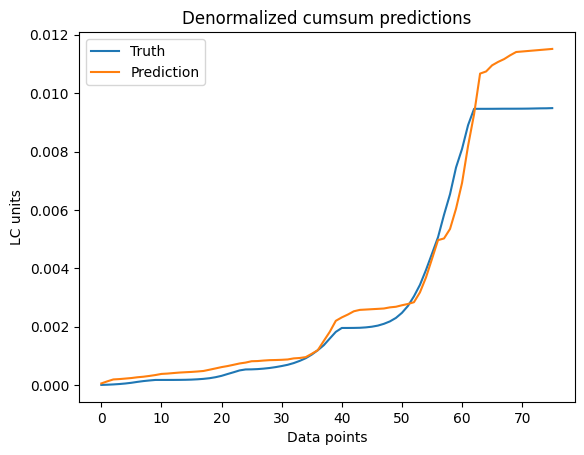

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.008720794, 0.04078071, 0.09338519, 2812155.8, 412215.47, 46.8231]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[4.6559695e-08, 9.422839e-05, 0.00021577696, 2806097.8, 23294.55, 46.823086]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.1298991, 0.24565315, 0.36041516, 216.55624, 92.04917, 20.154327]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[6.935201e-07, 0.0005676087, 0.0008327785, 216.556, 92.04909, 20.154316]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

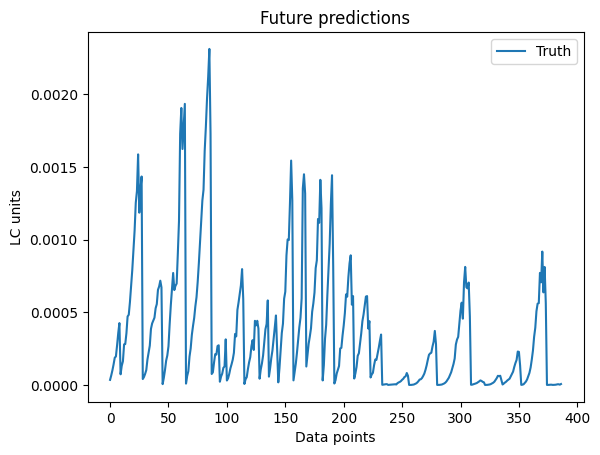

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 15%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB5-1-1***

## Data

### Get data

In [ ]:
num = nums[14]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"AD1"]).array

print(lc)

<PandasArray>
[ 2.122741395548039e-06,  4.657969395499276e-06, 3.1243873563109784e-06,
 5.1360787318995395e-06,  7.072440868187518e-06, 1.0097471121581329e-05,
 1.2564957612319851e-05,  1.753552272673549e-05, 2.8467417655240515e-05,
 1.1660225918362208e-06,
 ...
 1.7448083881120747e-06,  7.192723607432326e-06, 1.3084234355316426e-06,
  3.412929500800552e-06, 3.2370909223129497e-06, 1.7295150773868313e-06,
  2.855592283208608e-06, 3.4934604481501037e-06, 1.1313069525636538e-05,
 1.1760355485856407e-05]
Length: 388, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[7.932759444884141e-07, 4.911696009912703e-07, 8.121895120893896e-07,
 1.643520135985455e-06, 2.416039706076845e-06, 3.031743744941195e-06,
 7.462089342880063e-06,  4.44840952695813e-06, 2.724590331126819e-06,
 2.941342472695396e-06, 3.062647920160089e-06, 3.188100663464866e-06,
 4.702267517586733e-07, 9.108435961024952e-07,  5.53693723759352e-07,
  1.20267088732362e-06, 2.138699528586585e-06, 2.444915253363433e-06,
 1.665856984800484e-06, 2.724859086811193e-06, 2.767985733953537e-06,
 3.235907570342533e-06, 3.469205012152088e-06, 5.087973022455117e-06,
 6.223161562957102e-06, 8.535020242561586e-06, 1.300463918596506e-05,
 2.605057716209558e-06, 3.196528041371494e-06, 1.757371592248091e-06,
 2.653029469001922e-06, 3.415213086555013e-06, 1.168622839031741e-05,
 4.905798505205894e-06, 1.561296357976971e-06, 1.670382516749669e-06,
 1.668342179073079e-06, 1.859407802839996e-06, 2.065409489659942e-06,
  2.94369897346769e-06, 5.927161964791594e-06, 1.583953780937009e-05,
 3.007

In [ ]:
len(lc_pred)

78

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(381, 7, 1) (381,)
[[0.00219589]
 [0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]] 0.01856247543701312
[[0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]] 0.03017087957314236
[[0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]] 0.0011799654225009908
[[0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]] 0.013339323383980521
[[0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]] 0.008951301988655225
[[0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]] 0.008832052785548307
[[0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]] 0.008110966474334446
[[0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]
 [0.00811097]] 0.013951358305032335
[[0.03017088]
 [0.0011

In [ ]:
X[1][-1]

array([0.01856248])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

304


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00219589]
 [0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]] 0.01856247543701312
[[0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]] 0.03017087957314236
[[0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]] 0.0011799654225009908
[[0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]] 0.013339323383980521
[[0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]] 0.008951301988655225
[[0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]] 0.008832052785548307
[[0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]] 0.008110966474334446
[[0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]
 [0.00811097]] 0.013951358305032335
[[0.03017088]
 [0.00117997]
 [0.01333932]

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

304
304
77
77


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.2084 - mse: 0.2084 - mae: 0.4512 - rmse: 0.4565 - rmspe: inf - mape: 1557773.7500 - smape: 88.3907 - 3s/epoch - 289ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.1223 - mse: 0.1223 - mae: 0.3344 - rmse: 0.3497 - rmspe: inf - mape: 791047.5625 - smape: 85.4123 - 61ms/epoch - 6ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0146 - mse: 0.0146 - mae: 0.0548 - rmse: 0.1209 - rmspe: inf - mape: 141304.9844 - smape: 67.9205 - 58ms/epoch - 6ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 123.0873 - smape: 99.4831 - 59ms/epoch - 6ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 99.8609 - smape: 99.9939 - 57ms/epoch - 6ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 99.7312 - smape: 99.9986 - 56ms/epoch - 6ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse:

### Plot training results

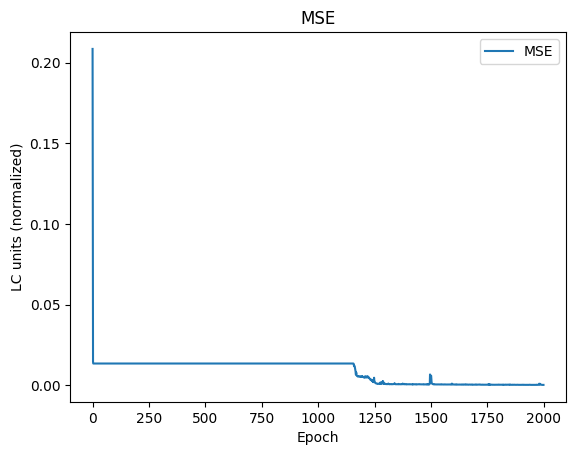

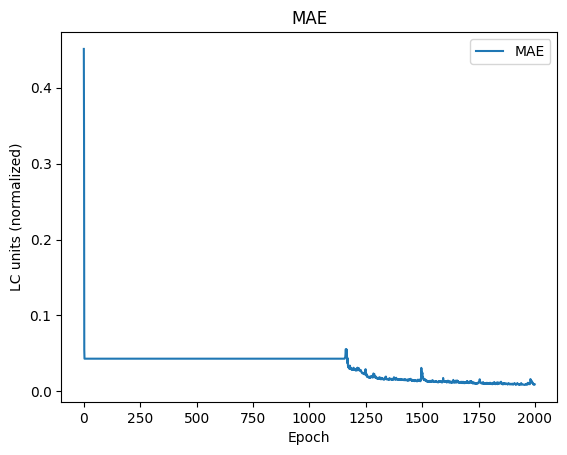

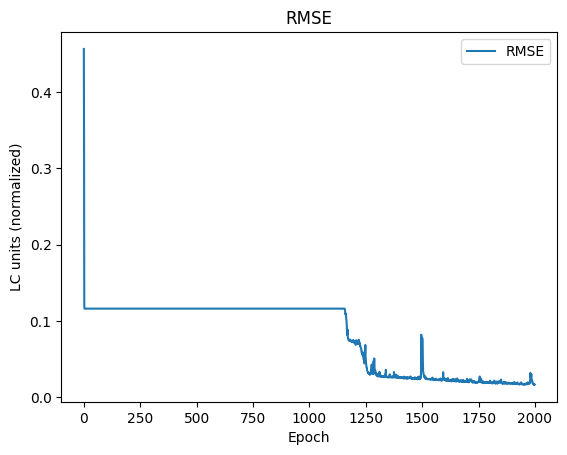

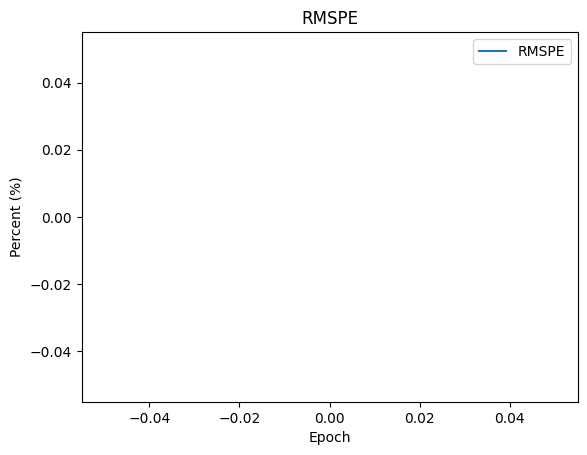

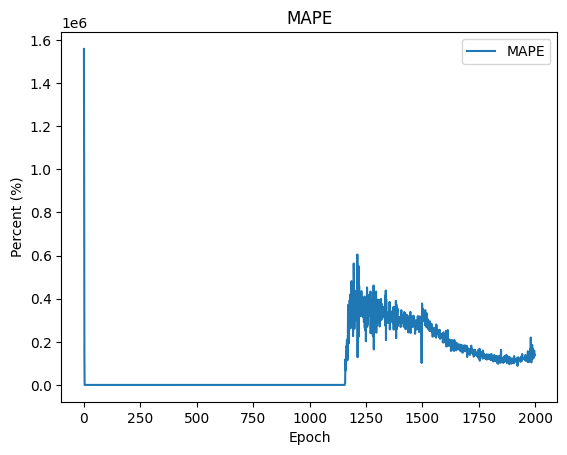

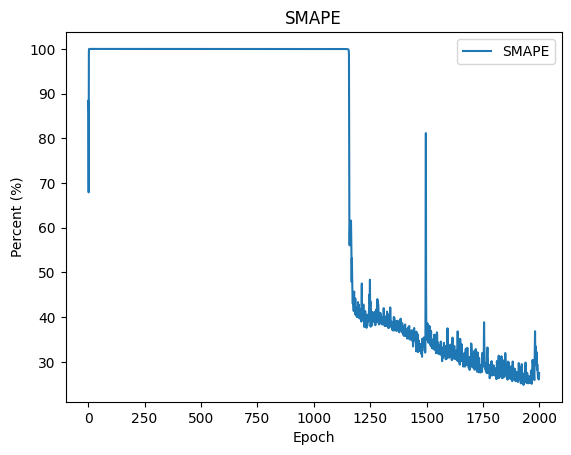

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

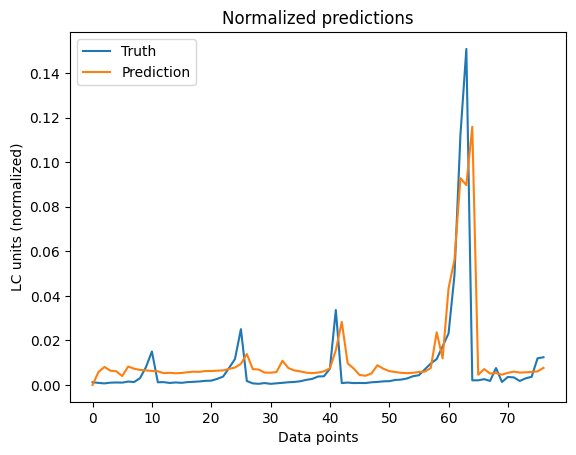

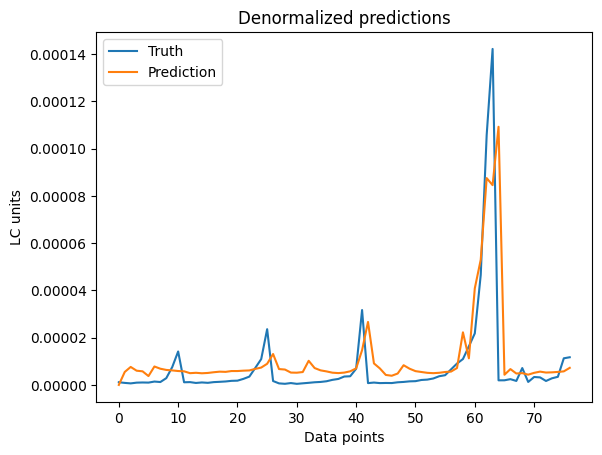

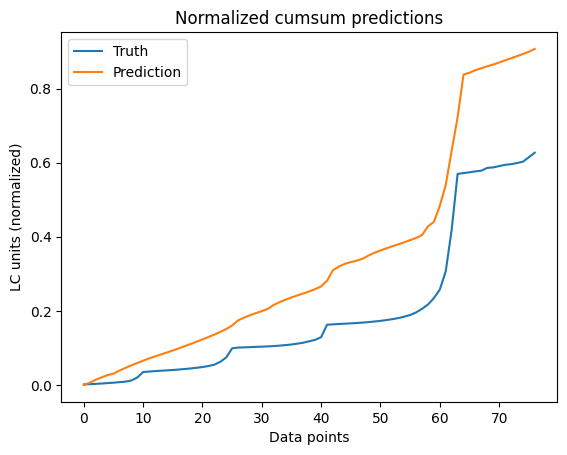

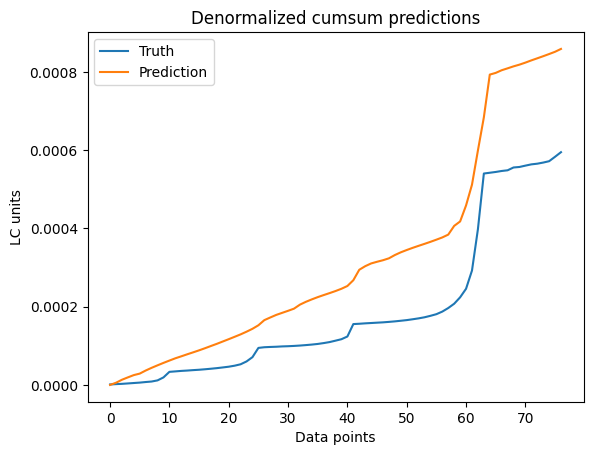

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.00026670852, 0.00755899, 0.016331213, 839.2975, 396.84442, 49.40532]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[2.3652813e-10, 7.1184713e-06, 1.537947e-05, 802.09705, 376.66132, 48.65]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.027130276, 0.1398764, 0.1647127, 157.21112, 124.83993, 35.701733]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[2.4060245e-08, 0.00013172474, 0.00015511365, 150.82013, 121.19548, 35.15112]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

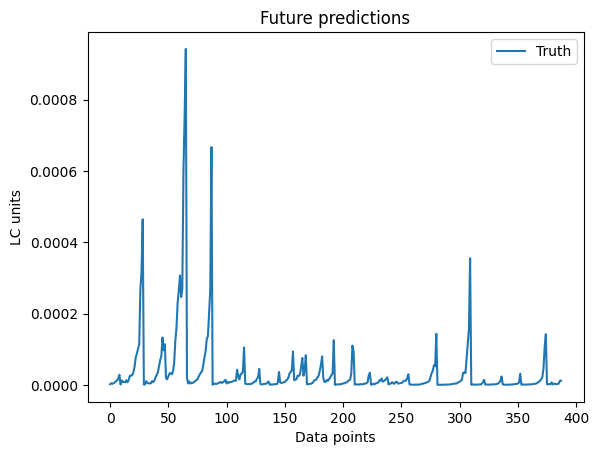

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 90%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 15%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB5-1-2***

## Data

### Get data

In [ ]:
num = nums[15]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"AD2"]).array

print(lc)

<PandasArray>
[ 1.738194213203439e-06,  2.339125259657576e-06, 3.1151210545077848e-06,
  4.286471760512553e-06,  5.860483384430576e-06, 1.0085048389554725e-05,
 1.2507421921750409e-05, 1.4303257187976813e-05, 1.8637909388695425e-05,
 1.2886974789041655e-06,
 ...
  6.720310026480268e-07, 3.4339407441484902e-06,  5.922233788906155e-07,
 2.2186722338810345e-07,  3.894854711385795e-07,  4.327701134729539e-07,
 4.6943521310413423e-07,   1.32652375167509e-06,  5.365370616901601e-06,
  4.167543168434016e-06]
Length: 388, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[1.625980132757832e-07,  1.86104927024644e-07, 1.648744074600472e-07,
 2.148056239548168e-07, 3.128031664800801e-07, 5.516193937182834e-07,
   1.2246869118826e-06, 1.719644501463335e-06, 1.106880517909303e-06,
 1.404198542331869e-06, 1.673787210165756e-06, 2.199567461502738e-06,
  2.39306189087074e-07, 2.107365020265206e-07, 1.653102827958719e-07,
 2.166904806699677e-07, 3.218505639779323e-07, 7.587776735817897e-07,
 1.360157398266892e-06, 1.198652853418025e-06, 1.161867089649604e-06,
 1.446955707251618e-06, 1.811233005355462e-06, 2.834512770277797e-06,
 3.680143663586932e-06, 4.574563263304299e-06, 6.608384410355939e-06,
 5.152306243871863e-07, 3.455216415204632e-07, 2.210139911085207e-07,
 3.427421972901357e-07, 6.022954153195315e-07, 1.327344193668978e-06,
 1.857622009993065e-06, 1.064072762346768e-06, 1.179433979814348e-06,
  1.59522210196883e-06, 2.306674787178054e-06, 3.262090103817172e-06,
 4.736675691674463e-06, 6.342837423289893e-06, 1.287899522139924e-05,
 2.248

In [ ]:
len(lc_pred)

78

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(381, 7, 1) (381,)
[[0.00161391]
 [0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]] 0.014275987440775843
[[0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]] 0.018644107339714933
[[0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]] 0.001160942770823656
[[0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]] 0.004431012210017652
[[0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]] 0.0032778784065763287
[[0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]] 0.004895156648096411
[[0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]] 0.003399776561422017
[[0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]
 [0.00339978]] 0.006675257916641557
[[0.01864411]
 [0.00

In [ ]:
X[1][-1]

array([0.01427599])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

304


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00161391]
 [0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]] 0.014275987440775843
[[0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]] 0.018644107339714933
[[0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]] 0.001160942770823656
[[0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]] 0.004431012210017652
[[0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]] 0.0032778784065763287
[[0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]] 0.004895156648096411
[[0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]] 0.003399776561422017
[[0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]
 [0.00339978]] 0.006675257916641557
[[0.01864411]
 [0.00116094]
 [0.0044310

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

304
304
77
77


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.2087 - mse: 0.2087 - mae: 0.4518 - rmse: 0.4568 - rmspe: 102524.1406 - mape: 43673.3320 - smape: 90.5531 - 3s/epoch - 291ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.1006 - mse: 0.1006 - mae: 0.2974 - rmse: 0.3171 - rmspe: 63921.5508 - mape: 28264.0059 - smape: 87.5303 - 67ms/epoch - 7ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0421 - rmse: 0.1097 - rmspe: 2424.7456 - mape: 1199.7484 - smape: 72.0311 - 64ms/epoch - 6ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.5101 - mape: 99.4409 - smape: 99.0714 - 67ms/epoch - 7ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.9960 - mape: 99.9958 - smape: 99.9920 - 63ms/epoch - 6ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.9994 - mape: 99.9994 - smape: 99.9988 - 61ms/epoch - 6ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0120 - mse: 0

### Plot training results

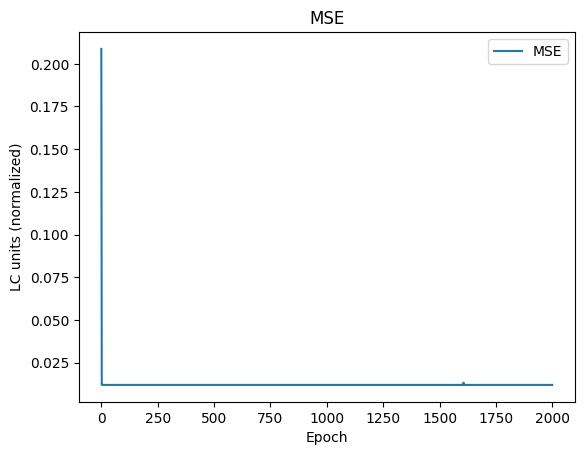

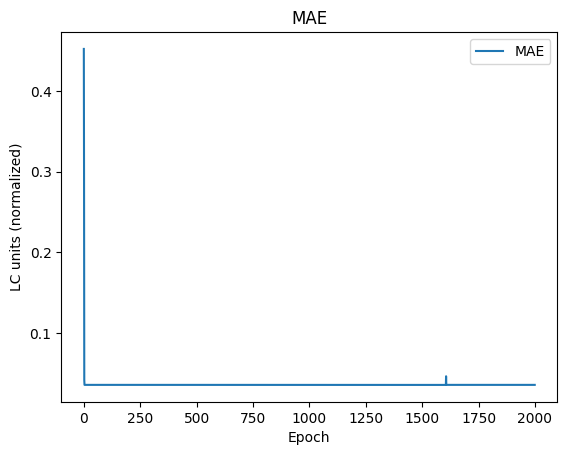

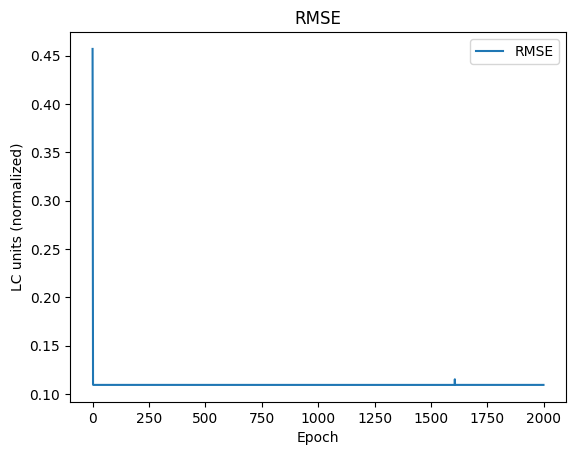

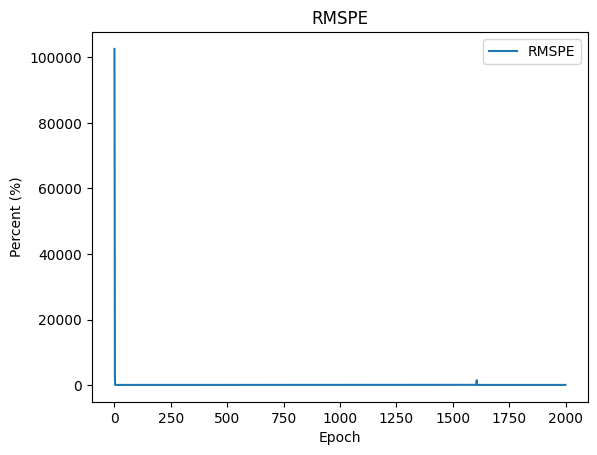

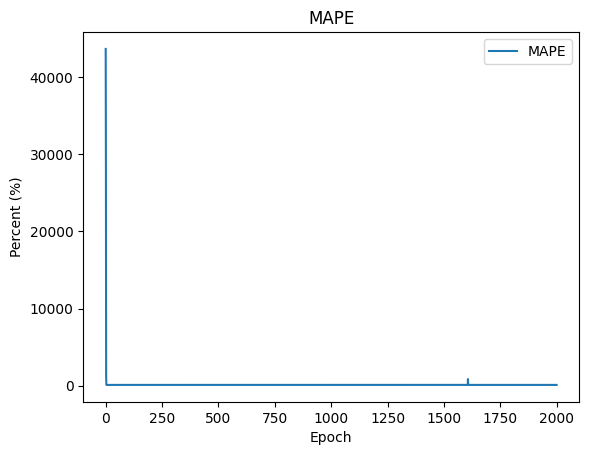

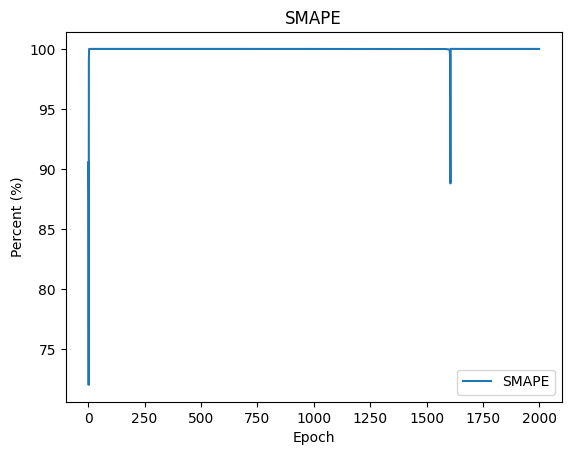

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

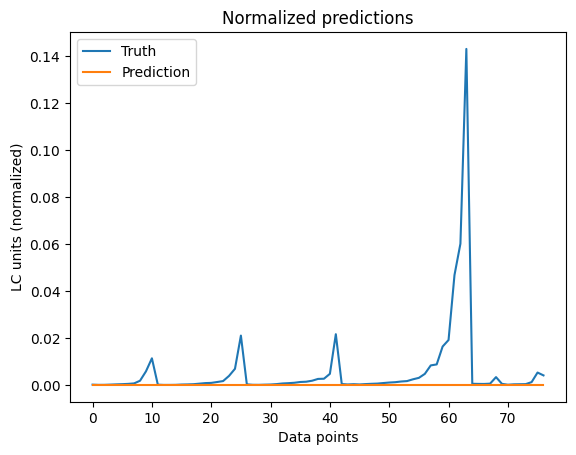

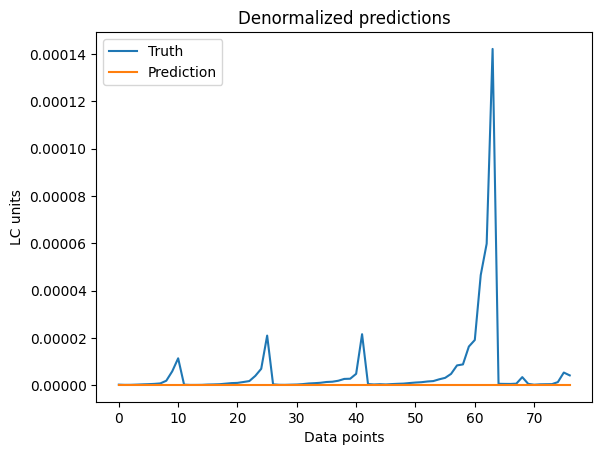

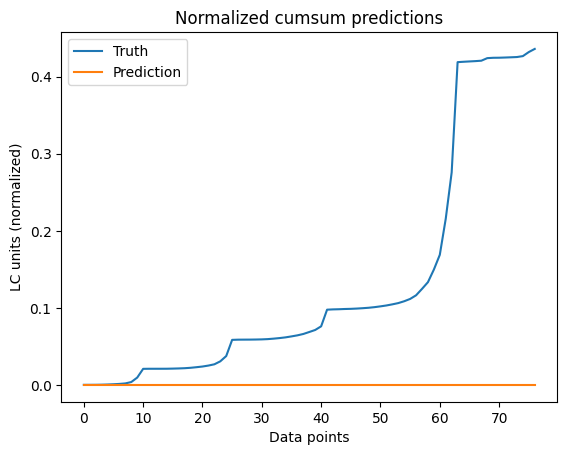

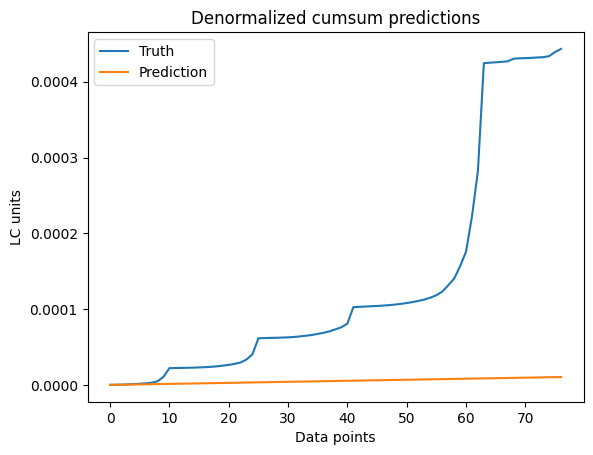

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.00036820373, 0.005662477, 0.019188635, inf, 98.7013, 100.0]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[3.6258319e-10, 5.6190934e-06, 1.9041618e-05, 79.48409, 75.54121, 66.08435]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.038580682, 0.13031237, 0.19641966, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[3.7991754e-08, 0.00012931394, 0.00019491474, 89.859924, 88.508316, 81.99007]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

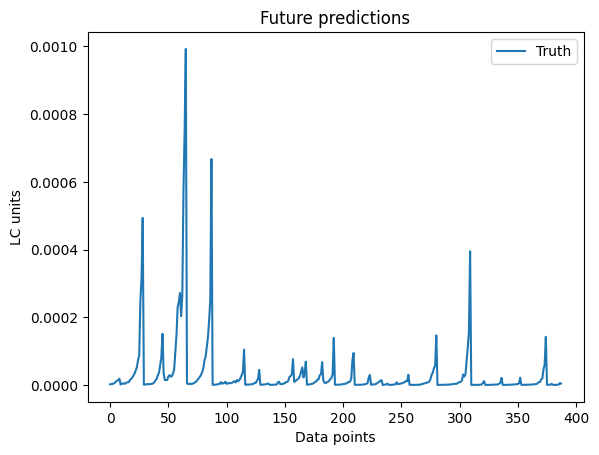

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 18%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB5-2-1***

## Data

### Get data

In [ ]:
num = nums[16]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"AD1"]).array

print(lc)

<PandasArray>
[ 2.547289674657647e-06,   5.58956327459913e-06, 3.7492648275731743e-06,
  6.163294478279448e-06,  8.486929041825021e-06, 1.2116965345897593e-05,
 1.5077949134783824e-05,  2.104262727208259e-05,  3.416090118628862e-05,
 1.3992271102034647e-06,
 ...
 2.0937700657344897e-06,  8.631268328918793e-06,  1.570108122637971e-06,
  4.095515400960662e-06,   3.88450910677554e-06, 2.0754180928641977e-06,
 3.4267107398503294e-06, 4.1921525377801245e-06, 1.3575683430763845e-05,
 1.4112426583027687e-05]
Length: 388, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[5.882757818653772e-07, 5.145080194779439e-06, 1.911632580231526e-06,
 3.945657681470038e-06,   7.1155068326334e-06, 1.064953175955452e-05,
 1.168855214928044e-05, 5.919444902247051e-06, 4.524786618276266e-06,
 4.168151463090908e-06, 4.827779775951058e-06, 6.515265795314917e-06,
 2.738040848271339e-06,  4.26866290581529e-06, 2.047230282187229e-06,
 4.311243174015544e-06, 7.447158623108407e-06,  9.18433397600893e-06,
 7.019416443654336e-06, 4.855008228332736e-06, 4.150779204792343e-06,
 4.650716164178448e-06, 5.152472567715449e-06, 6.569599463546183e-06,
  9.75549210124882e-06, 1.144196085078875e-05, 1.461520241718972e-05,
 6.514727374451468e-06,  7.99341705715051e-06, 3.907523932866752e-06,
 7.339674539252883e-06, 1.093839091481641e-05, 1.170420728158206e-05,
 5.723570211557671e-06, 5.091677849122789e-06, 4.550042376649799e-06,
 5.160332875675522e-06, 7.014666152826976e-06, 8.747709216549993e-06,
 1.079930098057957e-05, 1.491391503805062e-05, 2.771407889667898e-05,
 4.195

In [ ]:
len(lc_pred)

78

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(381, 7, 1) (381,)
[[0.00219589]
 [0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]] 0.01856247543701312
[[0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]] 0.030170879573142368
[[0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]] 0.0011799654225009906
[[0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]] 0.013339323383980523
[[0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]] 0.008951301988655227
[[0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]] 0.008832052785548305
[[0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]] 0.008110966474334446
[[0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]
 [0.00811097]] 0.013951358305032335
[[0.03017088]
 [0.001

In [ ]:
X[1][-1]

array([0.01856248])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

304


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00219589]
 [0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]] 0.01856247543701312
[[0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]] 0.030170879573142368
[[0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]] 0.0011799654225009906
[[0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]] 0.013339323383980523
[[0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]] 0.008951301988655227
[[0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]] 0.008832052785548305
[[0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]] 0.008110966474334446
[[0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]
 [0.00811097]] 0.013951358305032335
[[0.03017088]
 [0.00117997]
 [0.01333932

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

304
304
77
77


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.2025 - mse: 0.2025 - mae: 0.4445 - rmse: 0.4500 - rmspe: inf - mape: 1623014.7500 - smape: 88.0582 - 3s/epoch - 288ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.0892 - mse: 0.0892 - mae: 0.2735 - rmse: 0.2987 - rmspe: inf - mape: 1283130.5000 - smape: 82.3891 - 60ms/epoch - 6ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0132 - mse: 0.0132 - mae: 0.0442 - rmse: 0.1151 - rmspe: inf - mape: 47583.8008 - smape: 73.7526 - 61ms/epoch - 6ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 100.6979 - smape: 99.8872 - 61ms/epoch - 6ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 99.6900 - smape: 99.9994 - 63ms/epoch - 6ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 99.6753 - smape: 99.9999 - 58ms/epoch - 6ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse:

### Plot training results

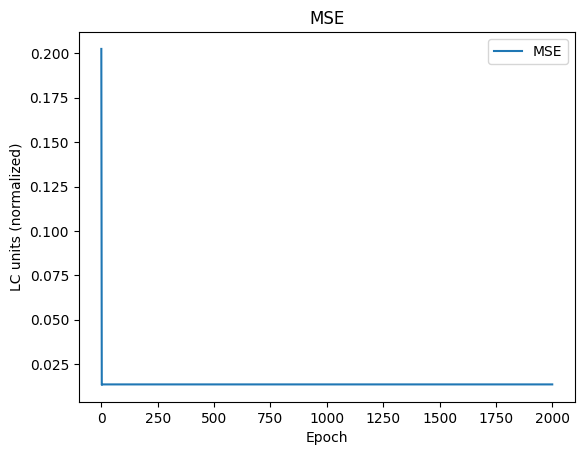

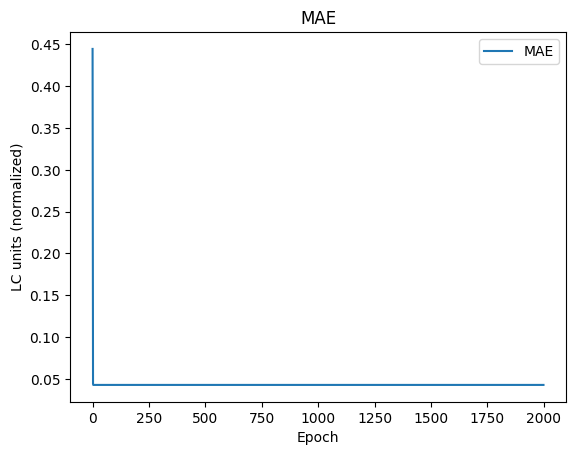

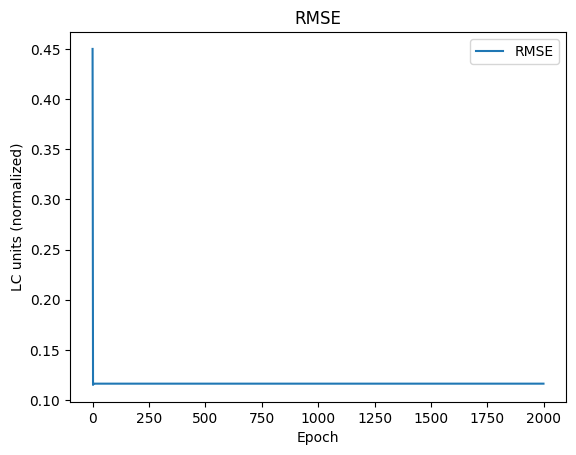

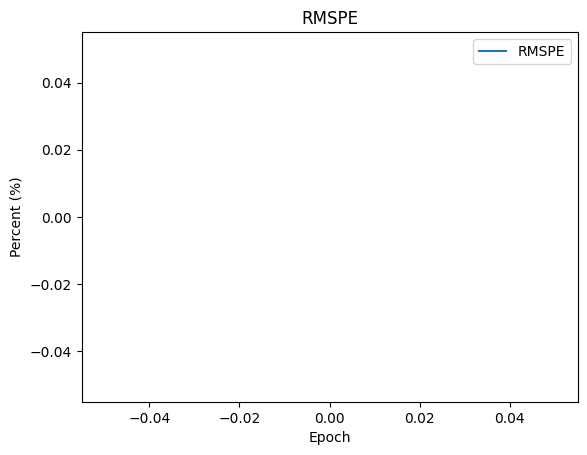

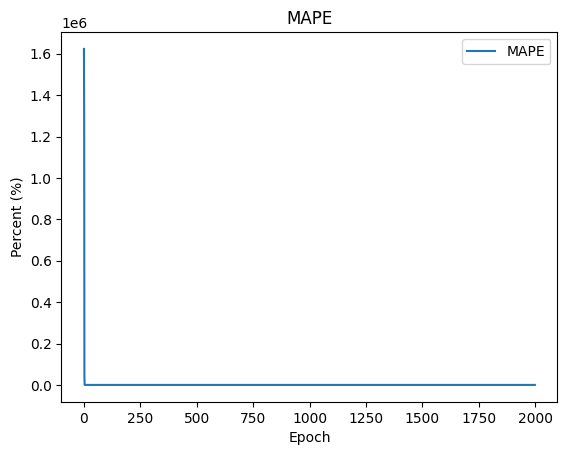

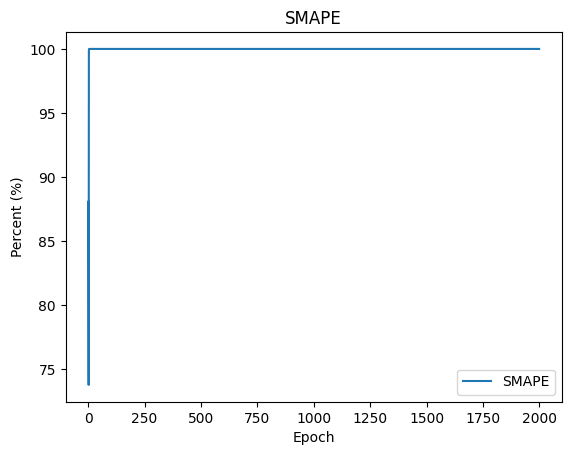

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

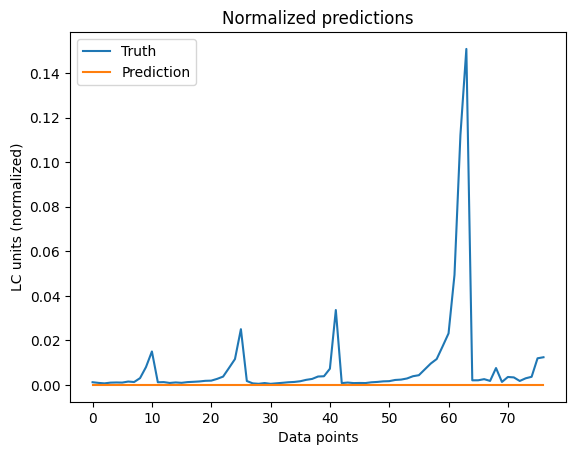

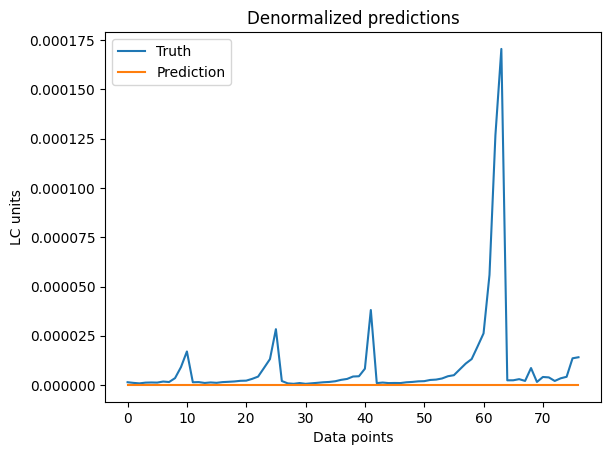

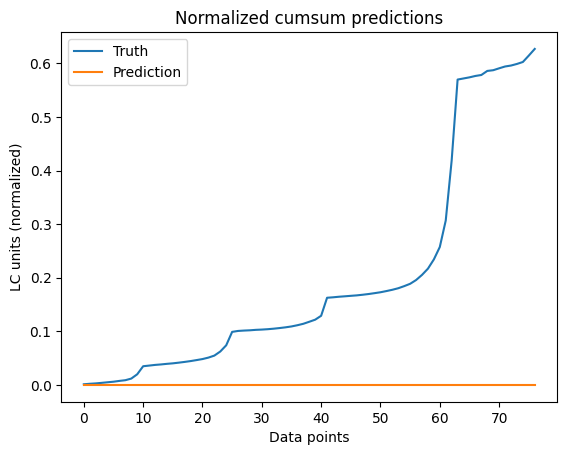

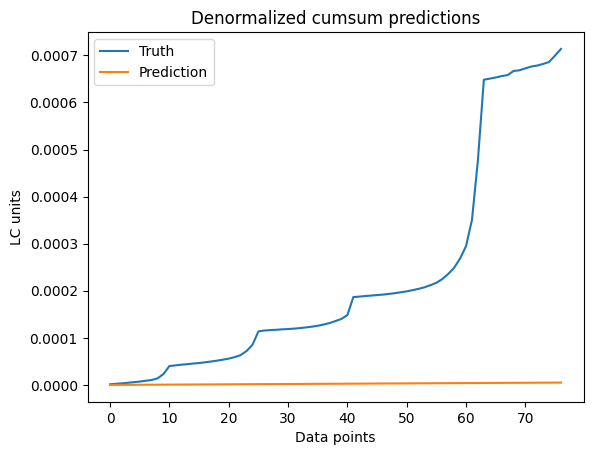

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.0005427242, 0.008142578, 0.023296442, 99.9997, 99.9997, 99.999405]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[6.930868e-10, 9.201658e-06, 2.6326541e-05, 96.754135, 96.723595, 93.760666]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.07885129, 0.19709125, 0.28080472, 99.99986, 99.99986, 99.99973]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.00697115e-07, 0.0002227263, 0.0003173281, 97.997025, 97.9886, 96.08699]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

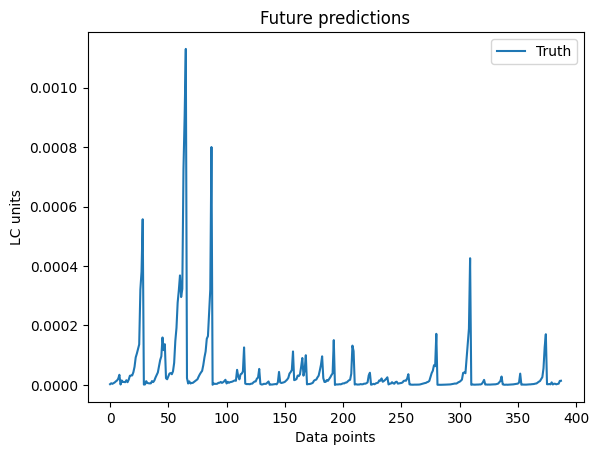

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 18%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB5-2-2***

## Data

### Get data

In [ ]:
num = nums[17]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"AD2"]).array

print(lc)

<PandasArray>
[2.0858330558441265e-06,  2.806950311589091e-06,  3.738145265409342e-06,
  5.143766112615063e-06,  7.032580061316692e-06,  1.210205806746567e-05,
 1.5008906306100493e-05, 1.7163908625572177e-05,  2.236549126643451e-05,
 1.5464369746849985e-06,
 ...
  8.064372031776321e-07,  4.120728892978189e-06,  7.106680546687385e-07,
 2.6624066806572417e-07,  4.673825653662954e-07,  5.193241361675446e-07,
  5.633222557249611e-07,  1.591828502010108e-06,  6.438444740281921e-06,
  5.001051802120819e-06]
Length: 388, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[1.240815777237003e-06, 7.449392569469637e-07, 6.130708811724617e-07,
 8.258869570454408e-07, 1.148077558354998e-06, 1.653125536904554e-06,
 1.717202735562751e-06, 2.288993982801912e-06, 1.690356498329493e-06,
 2.318334964002133e-06, 3.603287041187286e-06, 4.305156380723929e-06,
 1.378896968162735e-06, 1.196727794194885e-06, 6.389865347955492e-07,
  8.81275639130763e-07, 1.234772184943722e-06, 1.384503093504463e-06,
 1.830096834964934e-06, 1.214854705722246e-06, 1.802136239348329e-06,
 2.471485686328379e-06, 3.766574081964791e-06, 4.809892288903939e-06,
  5.91486332268687e-06, 7.948230631882325e-06, 1.052913557941793e-05,
 2.323849457752658e-06, 2.016280177485896e-06, 7.924108444967715e-07,
 1.111930032493547e-06, 1.564961735311954e-06, 1.602905513209407e-06,
 2.185245421060245e-06, 1.774405177457083e-06, 2.418418034721981e-06,
 3.784140290008509e-06, 4.818796242034296e-06, 6.408723038475728e-06,
 8.783906196185853e-06, 1.054188669513678e-05, 1.737941965984646e-05,
 2.447

In [ ]:
len(lc_pred)

78

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(381, 7, 1) (381,)
[[0.00161391]
 [0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]] 0.014275987440775843
[[0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]] 0.018644107339714933
[[0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]] 0.001160942770823656
[[0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]] 0.004431012210017652
[[0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]] 0.0032778784065763283
[[0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]] 0.00489515664809641
[[0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]] 0.0033997765614220167
[[0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]
 [0.00339978]] 0.006675257916641556
[[0.01864411]
 [0.00

In [ ]:
X[1][-1]

array([0.01427599])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

304


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00161391]
 [0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]] 0.014275987440775843
[[0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]] 0.018644107339714933
[[0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]] 0.001160942770823656
[[0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]] 0.004431012210017652
[[0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]] 0.0032778784065763283
[[0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]] 0.00489515664809641
[[0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]] 0.0033997765614220167
[[0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]
 [0.00339978]] 0.006675257916641556
[[0.01864411]
 [0.00116094]
 [0.0044310

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

304
304
77
77


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.2043 - mse: 0.2043 - mae: 0.4469 - rmse: 0.4520 - rmspe: 99180.7031 - mape: 43171.9258 - smape: 90.6496 - 3s/epoch - 286ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.0795 - mse: 0.0795 - mae: 0.2509 - rmse: 0.2819 - rmspe: 55779.2422 - mape: 27017.4492 - smape: 84.5130 - 64ms/epoch - 6ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0372 - rmse: 0.1093 - rmspe: 1219.9868 - mape: 570.9703 - smape: 77.6248 - 65ms/epoch - 7ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.9241 - mape: 99.9197 - smape: 99.8493 - 61ms/epoch - 6ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.9994 - mape: 99.9994 - smape: 99.9989 - 58ms/epoch - 6ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.9999 - mape: 99.9999 - smape: 99.9997 - 58ms/epoch - 6ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0

### Plot training results

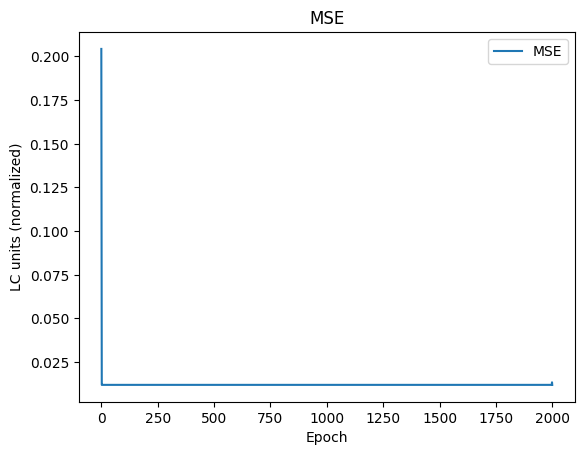

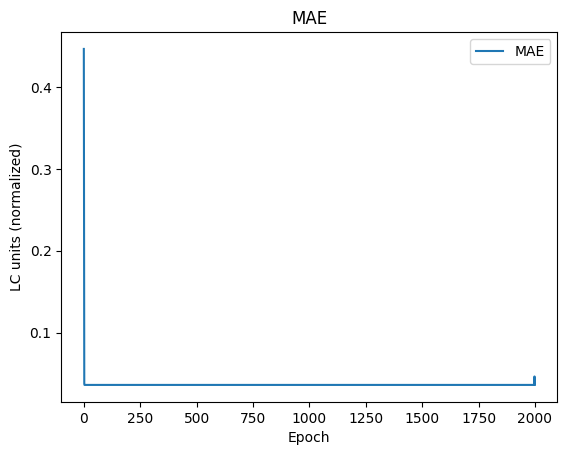

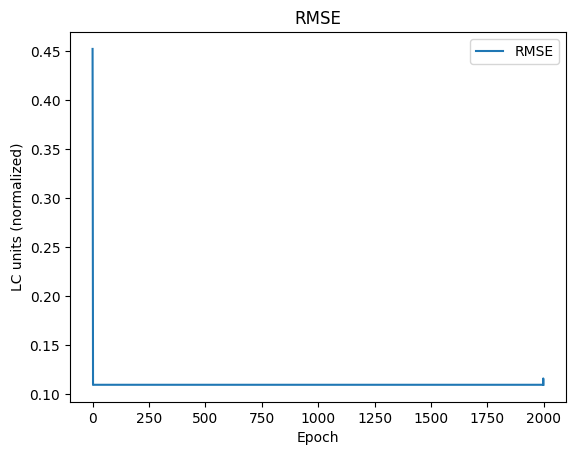

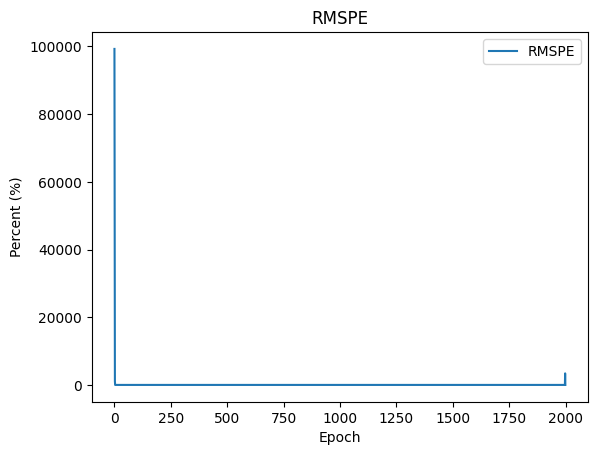

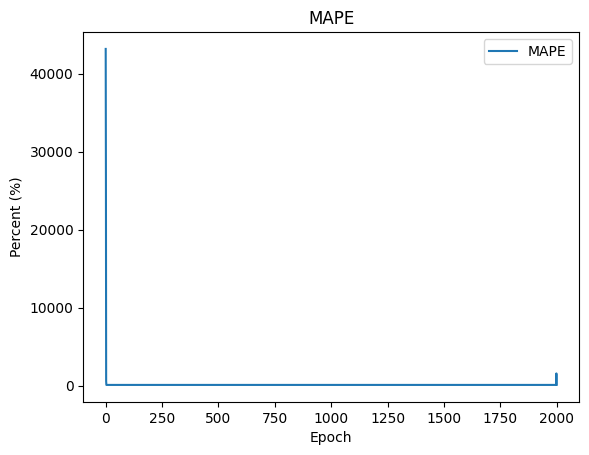

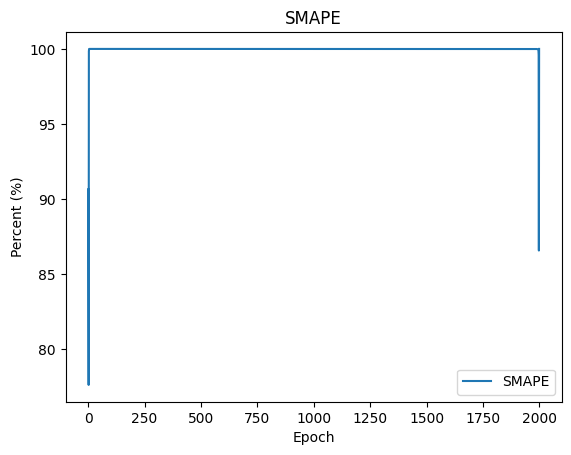

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB5-3-1***

## Data

### Get data

In [ ]:
num = nums[18]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"AD1"]).array

print(lc)

In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

In [ ]:
len(lc_pred)

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

In [ ]:
X[1][-1]

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.2114 - mse: 0.2114 - mae: 0.4547 - rmse: 0.4597 - rmspe: inf - mape: 1649711.0000 - smape: 88.6619 - 3s/epoch - 280ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.1395 - mse: 0.1395 - mae: 0.3632 - rmse: 0.3735 - rmspe: inf - mape: 1232077.8750 - smape: 86.7095 - 54ms/epoch - 5ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0193 - mse: 0.0193 - mae: 0.0832 - rmse: 0.1388 - rmspe: inf - mape: 573302.5000 - smape: 68.3562 - 55ms/epoch - 5ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0428 - rmse: 0.1163 - rmspe: inf - mape: 320.4451 - smape: 97.2753 - 53ms/epoch - 5ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 99.9479 - smape: 99.9912 - 53ms/epoch - 5ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 99.7306 - smape: 99.9992 - 53ms/epoch - 5ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse

### Plot training results

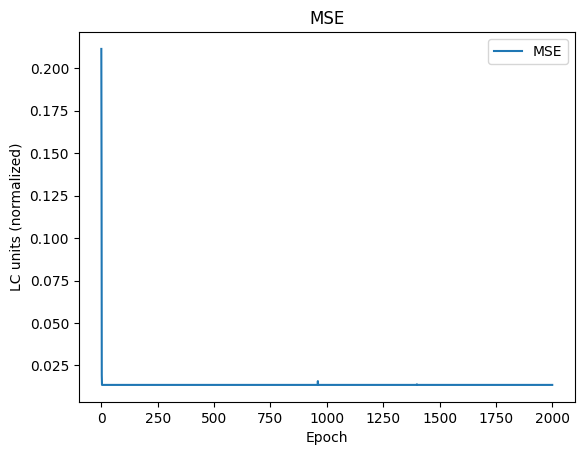

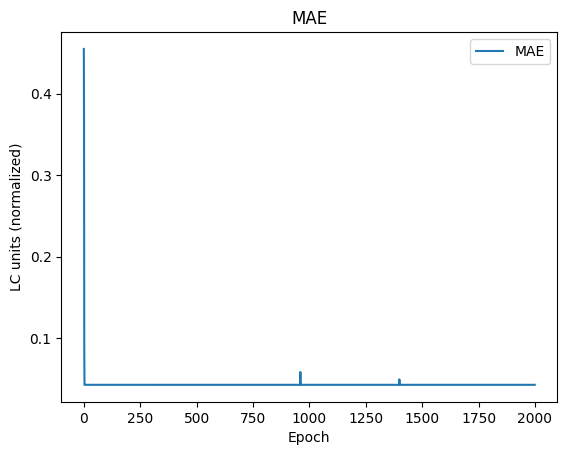

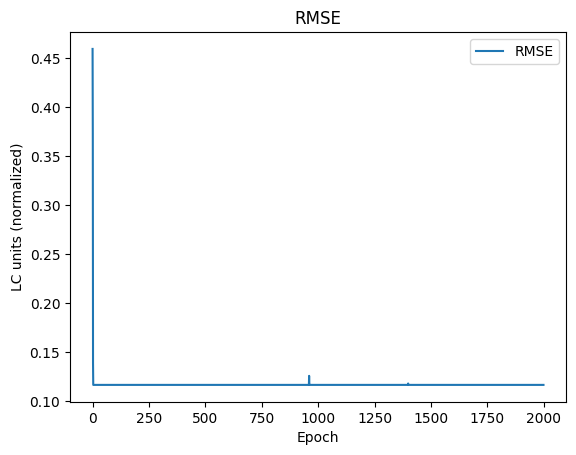

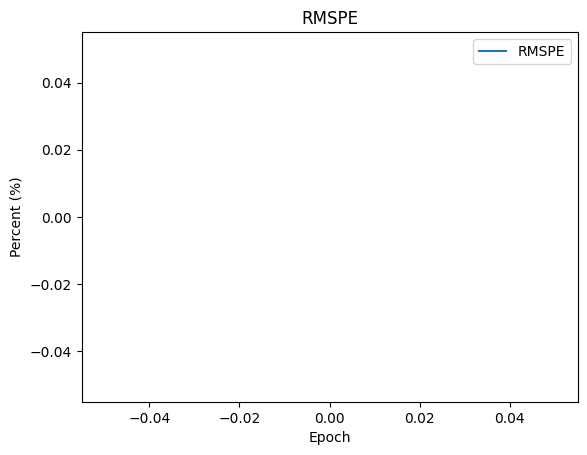

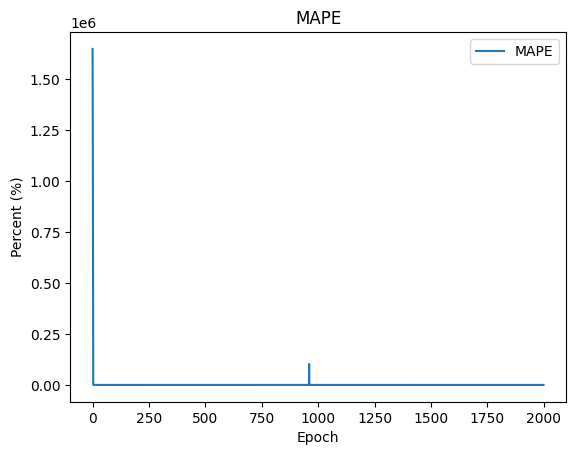

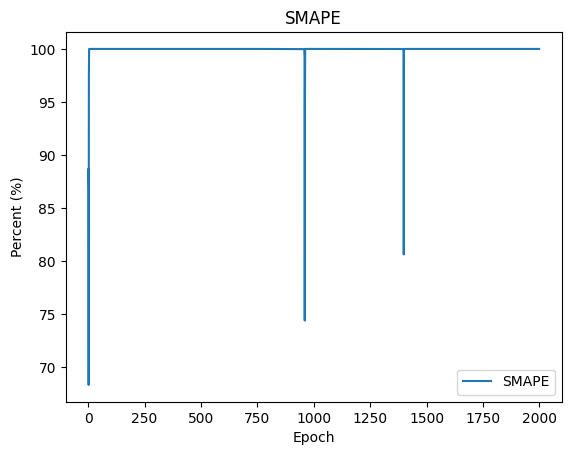

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

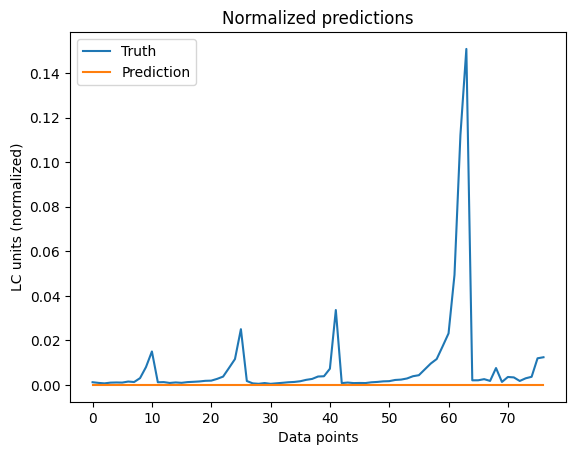

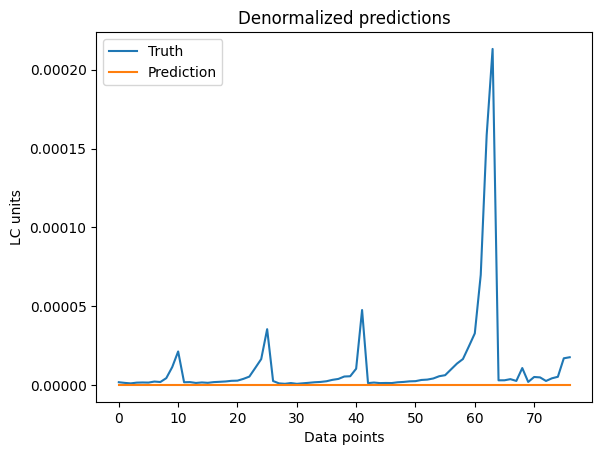

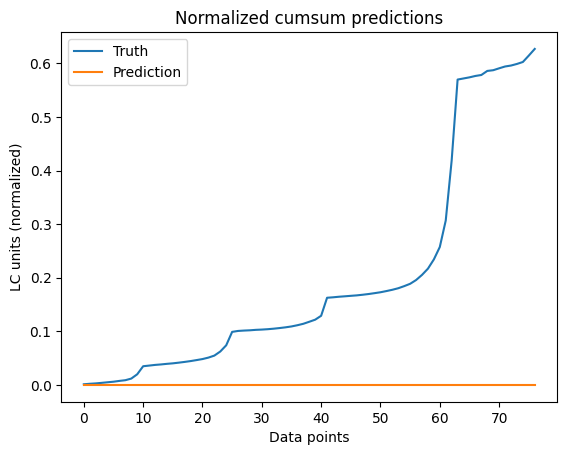

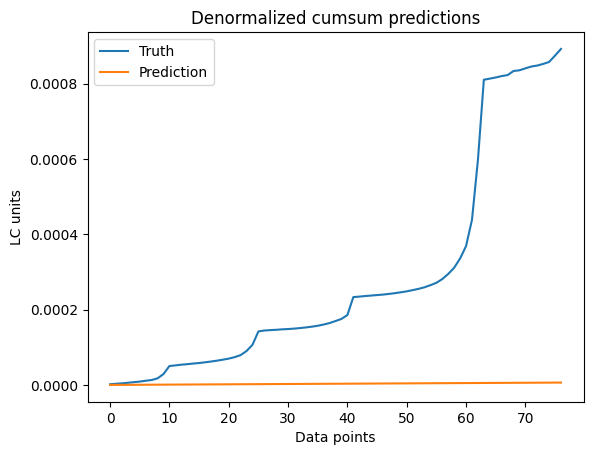

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.00054272433, 0.008142583, 0.023296444, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.0829483e-09, 1.1502078e-05, 3.2908178e-05, 96.7544, 96.72389, 93.76116]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.0788514, 0.19709146, 0.2808049, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[1.5733949e-07, 0.00027840817, 0.0003966604, 97.99716, 97.98872, 96.08724]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

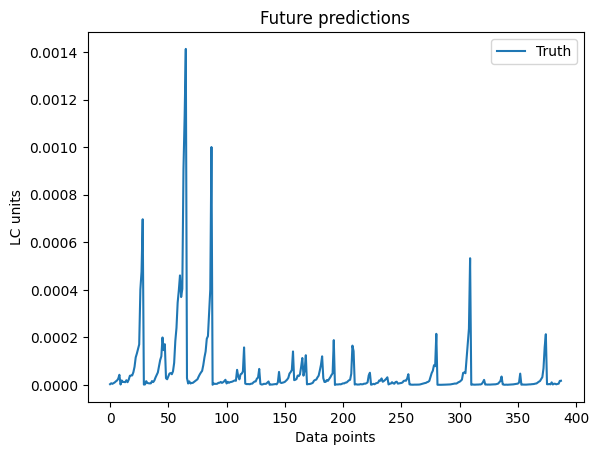

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 20%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB5-3-2***

## Data

### Get data

In [ ]:
num = nums[19]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"AD2"]).array

print(lc)

<PandasArray>
[2.6072913198051586e-06,  3.508687889486364e-06,  4.672681581761677e-06,
  6.429707640768829e-06,  8.790725076645864e-06, 1.5127572584332086e-05,
 1.8761132882625617e-05,  2.145488578196522e-05,  2.795686408304314e-05,
  1.933046218356248e-06,
 ...
 1.0080465039720401e-06,  5.150911116222735e-06,  8.883350683359231e-07,
  3.328008350821552e-07,  5.842282067078693e-07,  6.491551702094308e-07,
  7.041528196562014e-07,  1.989785627512635e-06,  8.048055925352402e-06,
  6.251314752651024e-06]
Length: 388, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[7.926254852463899e-07, 7.443400704687519e-07,  7.92562957485643e-07,
 1.000585029942158e-06, 1.343238182016648e-06, 1.818094460759312e-06,
 2.133312364094309e-06, 2.723451416386524e-06, 2.781316652544774e-06,
  3.43235524269403e-06, 4.675205218518386e-06, 5.395268090069294e-06,
  1.67871144185483e-06, 1.498655137766036e-06, 8.138435987348203e-07,
 1.047229147843609e-06, 1.400012706653797e-06, 1.713361712063488e-06,
 2.226493506896077e-06, 2.175229838030646e-06, 2.904286247940036e-06,
 3.618336222643848e-06, 4.852961410506396e-06,  6.27571080258349e-06,
 7.724618626525626e-06, 1.040480856318027e-05, 1.388962209603051e-05,
 2.031076292041689e-06, 1.879730461951112e-06, 1.002724502541241e-06,
 1.380163098474441e-06, 1.889122131615295e-06, 2.205185865022941e-06,
 2.775446318992181e-06, 2.889803226935328e-06, 3.592034317989601e-06,
 4.993258244212484e-06, 6.113487870607059e-06, 8.207181053876411e-06,
  1.10186156234704e-05, 1.479587626818102e-05, 2.222633702331223e-05,
 2.915

In [ ]:
len(lc_pred)

78

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(381, 7, 1) (381,)
[[0.00161391]
 [0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]] 0.014275987440775842
[[0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]] 0.01864410733971493
[[0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]] 0.0011609427708236559
[[0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]] 0.004431012210017652
[[0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]] 0.0032778784065763283
[[0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]] 0.00489515664809641
[[0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]] 0.003399776561422016
[[0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]
 [0.00339978]] 0.006675257916641556
[[0.01864411]
 [0.001

In [ ]:
X[1][-1]

array([0.01427599])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

304


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00161391]
 [0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]] 0.014275987440775842
[[0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]] 0.01864410733971493
[[0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]] 0.0011609427708236559
[[0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]] 0.004431012210017652
[[0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]] 0.0032778784065763283
[[0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]] 0.00489515664809641
[[0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]] 0.003399776561422016
[[0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]
 [0.00339978]] 0.006675257916641556
[[0.01864411]
 [0.00116094]
 [0.00443101

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

304
304
77
77


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.1958 - mse: 0.1958 - mae: 0.4368 - rmse: 0.4424 - rmspe: 97018.7500 - mape: 41828.8867 - smape: 90.3276 - 3s/epoch - 286ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.0587 - mse: 0.0587 - mae: 0.2009 - rmse: 0.2423 - rmspe: 42006.3672 - mape: 19665.7754 - smape: 79.9505 - 59ms/epoch - 6ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0119 - mse: 0.0119 - mae: 0.0351 - rmse: 0.1092 - rmspe: 198.2522 - mape: 133.1762 - smape: 76.6987 - 59ms/epoch - 6ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.9624 - mape: 99.9603 - smape: 99.9250 - 54ms/epoch - 5ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.9998 - mape: 99.9998 - smape: 99.9996 - 55ms/epoch - 5ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 100.0000 - mape: 100.0000 - smape: 99.9999 - 56ms/epoch - 6ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0120 - mse: 0.

### Plot training results

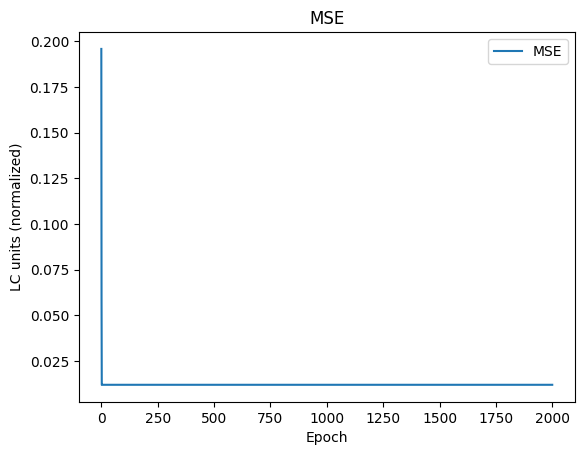

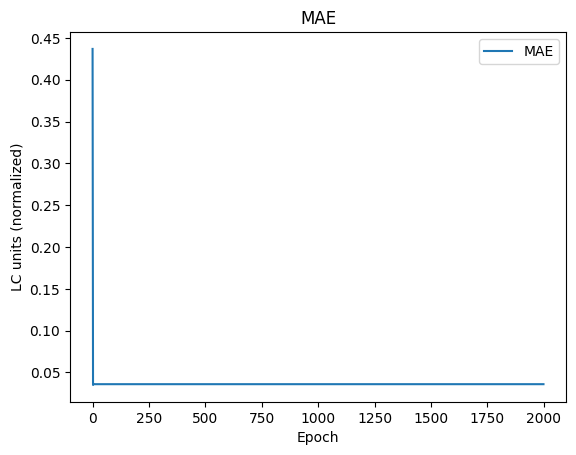

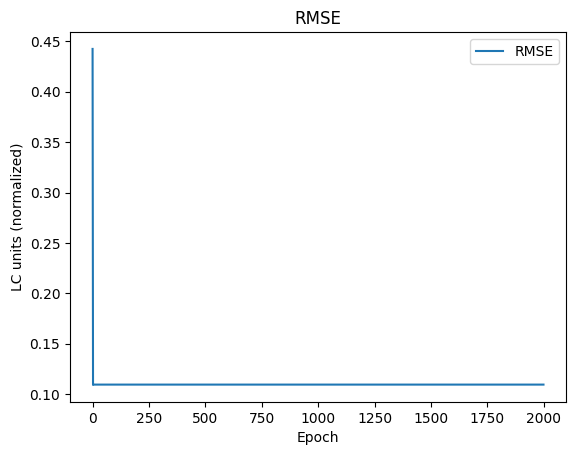

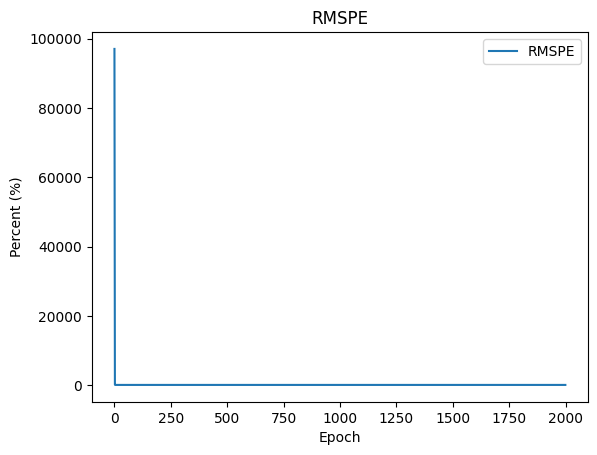

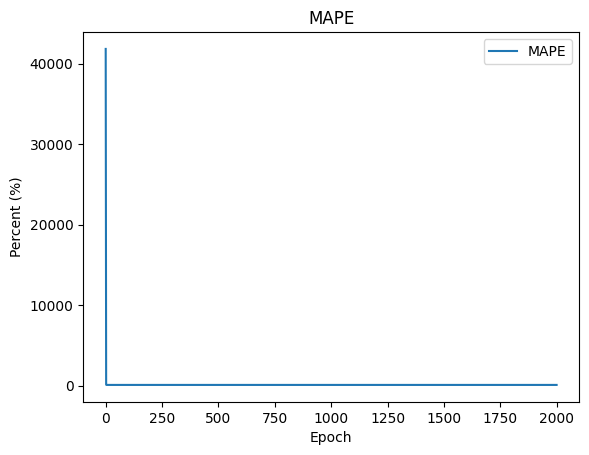

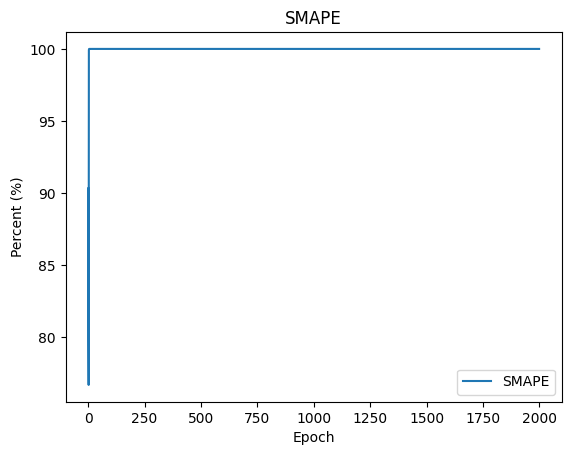

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

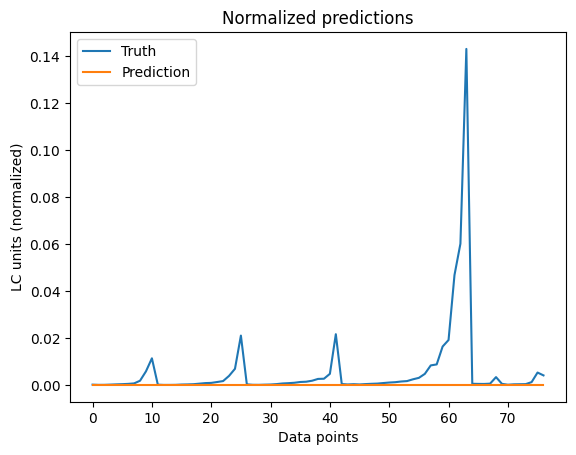

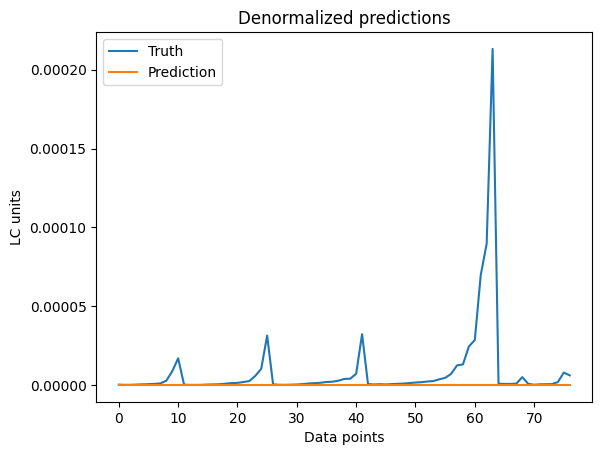

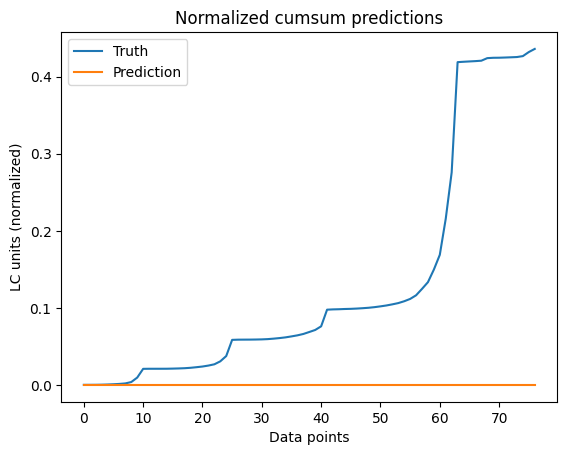

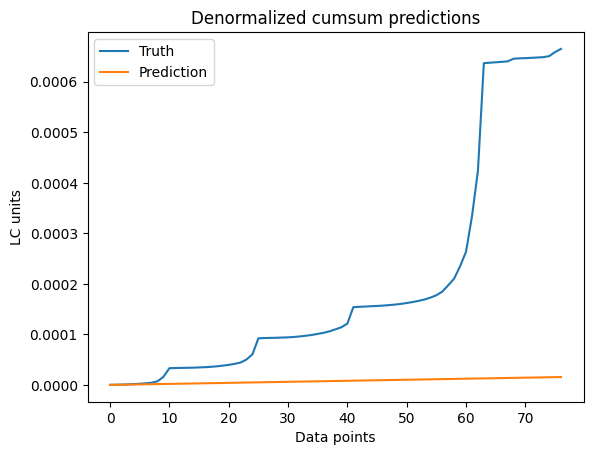

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.0003682037, 0.005662477, 0.019188635, inf, 98.70473, 99.99974]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[8.1581203e-10, 8.4286385e-06, 2.8562423e-05, 79.48408, 75.541176, 66.08433]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.038580682, 0.13031235, 0.19641966, 99.999985, 99.999985, 99.999985]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[8.548143e-08, 0.00019397087, 0.00029237207, 89.85991, 88.50831, 81.99007]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

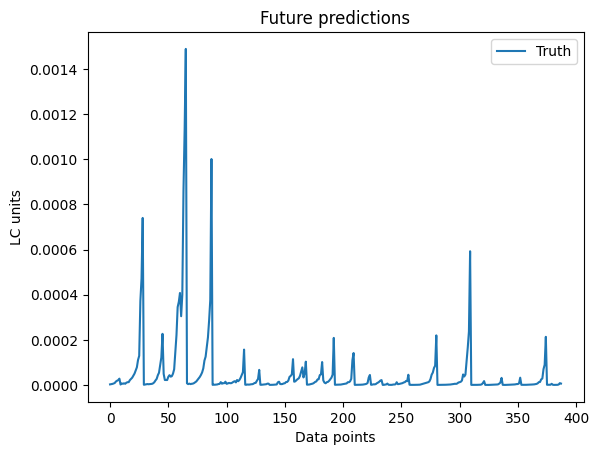

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 90%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 19%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB5-4-1***

## Data

### Get data

In [ ]:
num = nums[20]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"AD1"]).array

print(lc)

<PandasArray>
[ 4.245482791096078e-06,  9.315938790998552e-06,  6.248774712621957e-06,
 1.0272157463799079e-05, 1.4144881736375035e-05, 2.0194942243162658e-05,
 2.5129915224639703e-05,  3.507104545347098e-05,  5.693483531048103e-05,
 2.3320451836724416e-06,
 ...
 3.4896167762241494e-06, 1.4385447214864652e-05,  2.616846871063285e-06,
  6.825859001601104e-06,  6.474181844625899e-06, 3.4590301547736627e-06,
  5.711184566417216e-06, 6.9869208963002075e-06, 2.2626139051273076e-05,
 2.3520710971712813e-05]
Length: 388, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[1.767928665685758e-06, 7.940017894725315e-06, 2.312410288141109e-06,
 4.534755589702399e-06, 8.060338586801663e-06, 1.313012489845278e-05,
 1.833876922319178e-05, 9.392353604198433e-06, 6.842399670858867e-06,
 7.625878879480297e-06, 7.125881893443875e-06, 7.551911039627157e-06,
 1.200905899167992e-06,  4.51834512205096e-06, 1.680043965279765e-06,
 3.475638322925079e-06,    6.367002697516e-06, 9.761980436451267e-06,
 5.291821253194939e-06, 4.827459179068683e-06, 5.736194907512981e-06,
 6.705291980324546e-06, 7.067204478516942e-06, 8.946595698944293e-06,
 1.109102959162556e-05, 1.552422509121243e-05, 2.373843562963884e-05,
 4.391566562844673e-06, 1.380549474561121e-05, 5.466260972752934e-06,
  1.02485701063415e-05, 1.668093136686366e-05, 2.021325235546101e-05,
 1.304576016991632e-05, 8.435285963059869e-06, 9.194905032927636e-06,
 9.540081009618007e-06, 8.847062417771667e-06, 9.281974598707166e-06,
  1.32996774482308e-05, 2.127156949427444e-05, 4.047589027322829e-05,
 5.533

In [ ]:
len(lc_pred)

78

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(381, 7, 1) (381,)
[[0.00219589]
 [0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]] 0.01856247543701312
[[0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]] 0.03017087957314236
[[0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]] 0.0011799654225009908
[[0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]] 0.013339323383980521
[[0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]] 0.008951301988655225
[[0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]] 0.008832052785548307
[[0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]] 0.008110966474334446
[[0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]
 [0.00811097]] 0.013951358305032335
[[0.03017088]
 [0.0011

In [ ]:
X[1][-1]

array([0.01856248])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

304


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00219589]
 [0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]] 0.01856247543701312
[[0.00488801]
 [0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]] 0.03017087957314236
[[0.00325952]
 [0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]] 0.0011799654225009908
[[0.0053957 ]
 [0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]] 0.013339323383980521
[[0.0074519 ]
 [0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]] 0.008951301988655225
[[0.01066413]
 [0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]] 0.008832052785548307
[[0.01328431]
 [0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]] 0.008110966474334446
[[0.01856248]
 [0.03017088]
 [0.00117997]
 [0.01333932]
 [0.0089513 ]
 [0.00883205]
 [0.00811097]] 0.013951358305032335
[[0.03017088]
 [0.00117997]
 [0.01333932]

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

304
304
77
77


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.1991 - mse: 0.1991 - mae: 0.4408 - rmse: 0.4462 - rmspe: inf - mape: 1544684.5000 - smape: 88.3065 - 3s/epoch - 269ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.0739 - mse: 0.0739 - mae: 0.2437 - rmse: 0.2719 - rmspe: inf - mape: 495794.0000 - smape: 79.8629 - 54ms/epoch - 5ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0133 - mse: 0.0133 - mae: 0.0416 - rmse: 0.1152 - rmspe: inf - mape: 103544.1016 - smape: 73.0742 - 55ms/epoch - 6ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 103.3755 - smape: 99.8821 - 59ms/epoch - 6ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 99.6910 - smape: 99.9991 - 54ms/epoch - 5ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse: 0.1163 - rmspe: inf - mape: 99.6788 - smape: 99.9999 - 56ms/epoch - 6ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0135 - mse: 0.0135 - mae: 0.0429 - rmse:

### Plot training results

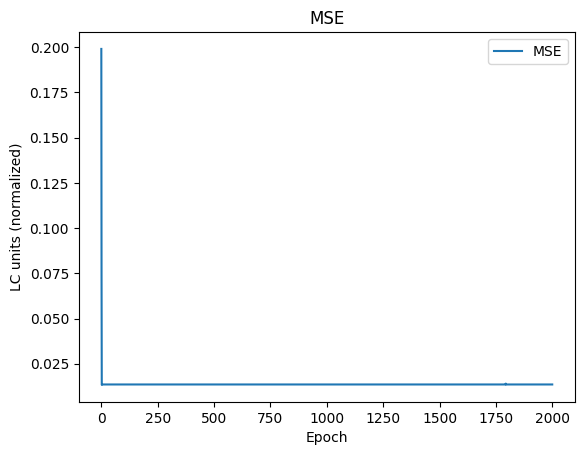

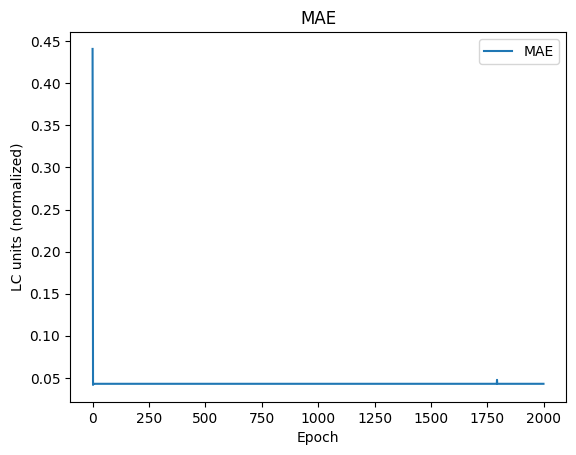

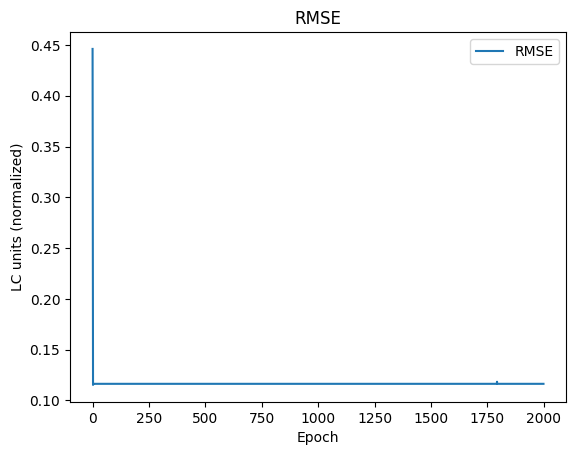

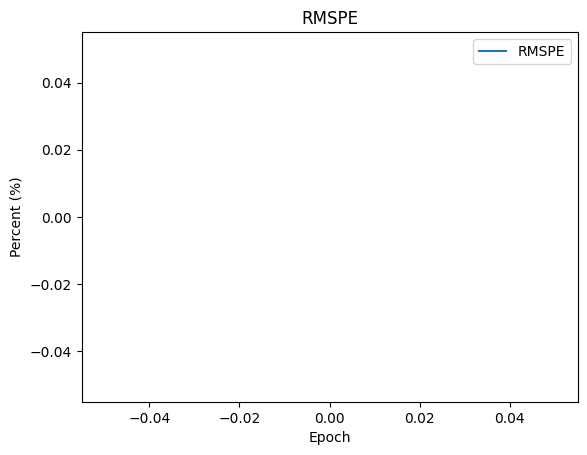

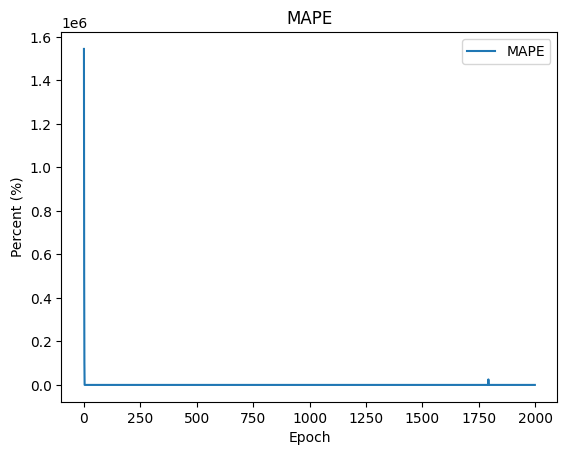

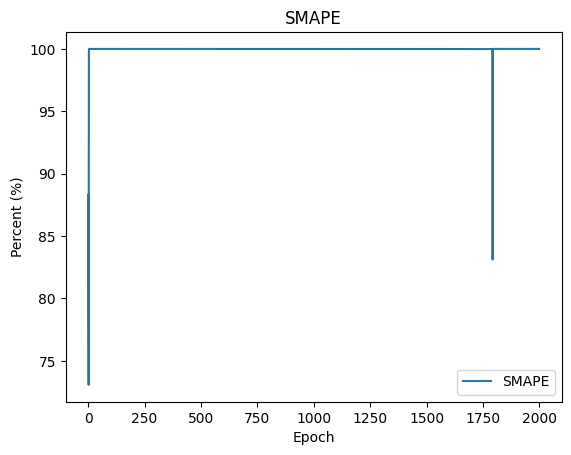

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

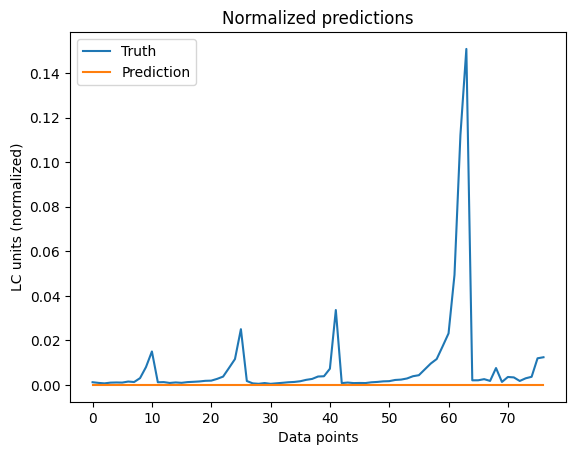

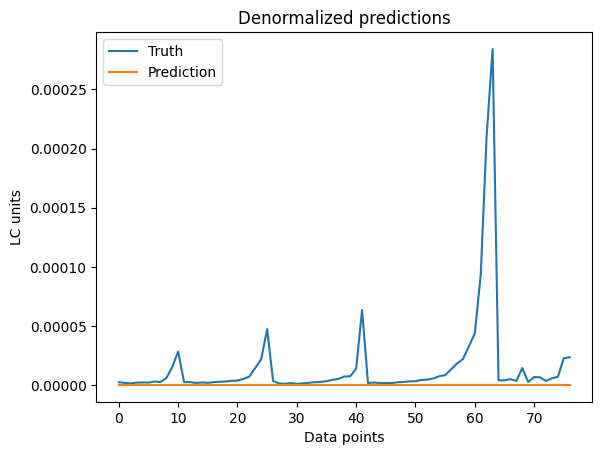

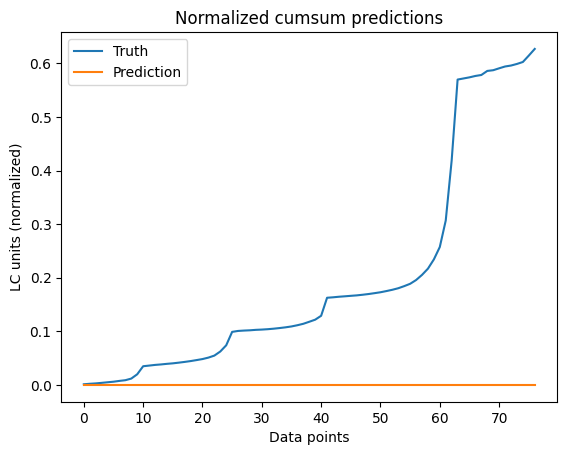

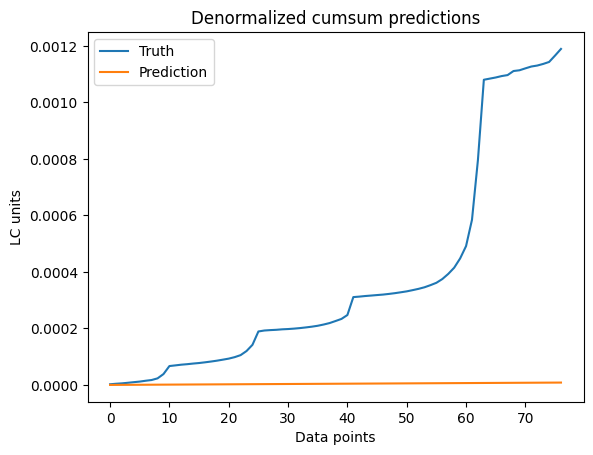

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

[0.00054272433, 0.008142583, 0.023296444, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

[1.925241e-09, 1.5336105e-05, 4.3877568e-05, 96.7544, 96.72389, 93.76116]

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

[0.0788514, 0.19709146, 0.2808049, 100.0, 100.0, 100.0]

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

[2.7971475e-07, 0.00037121092, 0.0005288806, 97.99716, 97.98872, 96.08724]

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

'while sum_lc < 1:\n  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))\n  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])\n  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])\n  sum_lc = np.sum(future_preds)\n  temp_arr = temp_arr[1:]\n  print(len(future_preds), sum_lc)\n\nprint(len(future_preds))'

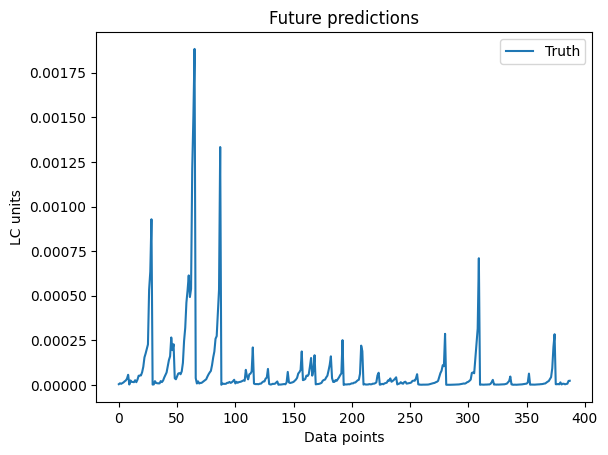

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 20%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# ***DB5-4-2***

## Data

### Get data

In [ ]:
num = nums[21]

In [ ]:
book = pd.ExcelFile('Data for ML TT-DB'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1')

lc = pd.Series(sheet.loc[:,"AD2"]).array

print(lc)

<PandasArray>
[ 3.476388426406878e-06,  4.678250519315152e-06, 6.2302421090155696e-06,
  8.572943521025106e-06, 1.1720966768861153e-05,  2.017009677910945e-05,
 2.5014843843500817e-05, 2.8606514375953625e-05,  3.727581877739085e-05,
  2.577394957808331e-06,
 ...
 1.3440620052960536e-06, 6.8678814882969804e-06,  1.184446757781231e-06,
  4.437344467762069e-07,   7.78970942277159e-07,  8.655402269459078e-07,
  9.388704262082685e-07,   2.65304750335018e-06, 1.0730741233803202e-05,
  8.335086336868031e-06]
Length: 388, dtype: float64


In [ ]:
book = pd.ExcelFile('preds_'+num+'.xlsx')
sheet = pd.read_excel(book, 'Sheet1', header = None)

lc_pred = pd.Series(sheet.iloc[:,0]).array

print(lc_pred)

<PandasArray>
[8.028588354136446e-07, 6.184347398630052e-07, 8.034245979615662e-07,
 1.497385710536037e-06, 2.537218051656964e-06, 3.776355697482359e-06,
 9.287226021115202e-06, 1.305475598201156e-05, 6.629965810134308e-06,
 6.093392585171387e-06, 7.965782060637139e-06, 1.002129829430487e-05,
 1.203110400638252e-06, 1.071610427061387e-06, 1.015026100503746e-06,
 2.041689413090353e-06, 3.332029109515133e-06, 6.924231001903536e-06,
 1.086047996068373e-05, 6.748224222974386e-06, 7.307911346288165e-06,
 6.617126018682029e-06, 8.499895557179116e-06, 1.205899025080726e-05,
 1.633684587432072e-05, 1.971729216165841e-05, 2.127337029378396e-05,
 3.022372538907803e-06, 1.728472284412419e-06, 1.368695961900812e-06,
 2.376487827859819e-06, 3.656051603684318e-06, 8.745935701881535e-06,
 1.168160906672711e-05, 6.311893230304122e-06, 5.807884008390829e-06,
 8.503436220053118e-06, 1.140798212873051e-05, 1.593928209331352e-05,
 2.103348560922313e-05, 2.022836088144686e-05, 3.609469786169939e-05,
 5.668

In [ ]:
len(lc_pred)

78

In [ ]:
lc = np.array(lc)
lc_pred = np.array(lc_pred)

In [ ]:
lc_merged = np.append(lc[:len(lc)-len(lc_pred)], (lc_pred))

In [ ]:
data = [lc_merged, lc]

### Normalize data

In [ ]:
# fit scaler on data and apply transform
data_norm = []
scaler.fit(lc.reshape(-1,1))
for item in data:
  data_norm.append(scaler.transform(item.reshape(-1,1)).T[0])

### Prepare data

In [ ]:
X, y = process_data(data_norm, n_steps)
for i in range(len(X)):
	print(X[i], y[i])

(381, 7, 1) (381,)
[[0.00161391]
 [0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]] 0.014275987440775843
[[0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]] 0.018644107339714933
[[0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]] 0.001160942770823656
[[0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]] 0.004431012210017652
[[0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]] 0.0032778784065763287
[[0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]] 0.004895156648096411
[[0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]] 0.003399776561422017
[[0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]
 [0.00339978]] 0.006675257916641557
[[0.01864411]
 [0.00

In [ ]:
X[1][-1]

array([0.01427599])

In [ ]:
split_idx = 0
for i in range(len(X)):
  if (X[i+1][-1] != y[i]):
    split_idx = i + 1
    print(split_idx)
    break

304


In [ ]:
for i in range(len(X[:split_idx])):
	print(X[i], y[i])

[[0.00161391]
 [0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]] 0.014275987440775843
[[0.00221948]
 [0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]] 0.018644107339714933
[[0.00300147]
 [0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]] 0.001160942770823656
[[0.00418186]
 [0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]] 0.004431012210017652
[[0.00576803]
 [0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]] 0.0032778784065763287
[[0.01002521]
 [0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]] 0.004895156648096411
[[0.01246629]
 [0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]] 0.003399776561422017
[[0.01427599]
 [0.01864411]
 [0.00116094]
 [0.00443101]
 [0.00327788]
 [0.00489516]
 [0.00339978]] 0.006675257916641557
[[0.01864411]
 [0.00116094]
 [0.0044310

In [ ]:
X_train = X[:split_idx]
X_test = X[split_idx:]
y_train = y[:split_idx]
y_test = y[split_idx:]

In [ ]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

304
304
77
77


In [ ]:
X_train = np.array(X_train).astype(np.float32)
y_train = np.array(y_train).astype(np.float32)
X_test = np.array(X_test).astype(np.float32)
y_test = np.array(y_test).astype(np.float32)

## Model training

### Train

In [ ]:
#number of features
n_features = X_train.shape[2]

In [ ]:
model = create_model(model_type, n_steps, n_features, output_AF)

In [ ]:
from keras.callbacks import CSVLogger

csv_logger = CSVLogger('log.csv', append=True, separator=';')

In [ ]:
# fit model
history = model.fit(X_train, y_train, epochs=num_epoch, verbose=2, callbacks=[csv_logger])

Epoch 1/2000
10/10 - 3s - loss: 0.2068 - mse: 0.2068 - mae: 0.4498 - rmse: 0.4547 - rmspe: 96150.0781 - mape: 43568.2617 - smape: 90.6864 - 3s/epoch - 276ms/step
Epoch 2/2000
10/10 - 0s - loss: 0.0854 - mse: 0.0854 - mae: 0.2622 - rmse: 0.2923 - rmspe: 53980.3945 - mape: 25408.9434 - smape: 85.2008 - 56ms/epoch - 6ms/step
Epoch 3/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0386 - rmse: 0.1095 - rmspe: 1834.8992 - mape: 934.4713 - smape: 79.2416 - 57ms/epoch - 6ms/step
Epoch 4/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.9540 - mape: 99.9515 - smape: 99.9083 - 55ms/epoch - 5ms/step
Epoch 5/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 99.9998 - mape: 99.9998 - smape: 99.9996 - 59ms/epoch - 6ms/step
Epoch 6/2000
10/10 - 0s - loss: 0.0120 - mse: 0.0120 - mae: 0.0360 - rmse: 0.1095 - rmspe: 100.0000 - mape: 100.0000 - smape: 100.0000 - 59ms/epoch - 6ms/step
Epoch 7/2000
10/10 - 0s - loss: 0.0120 - mse: 

### Plot training results

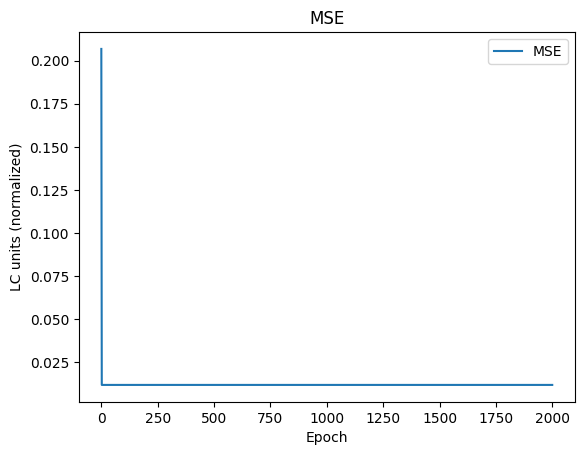

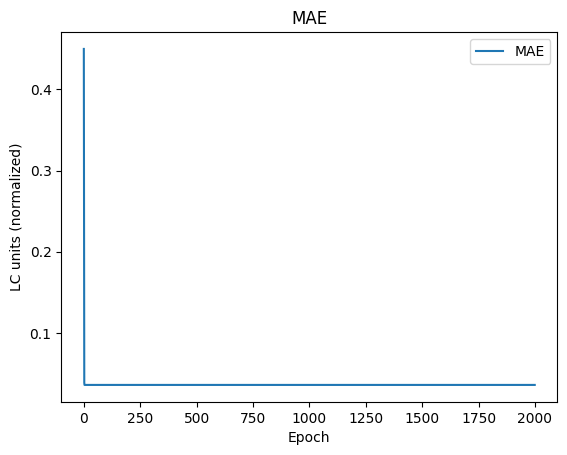

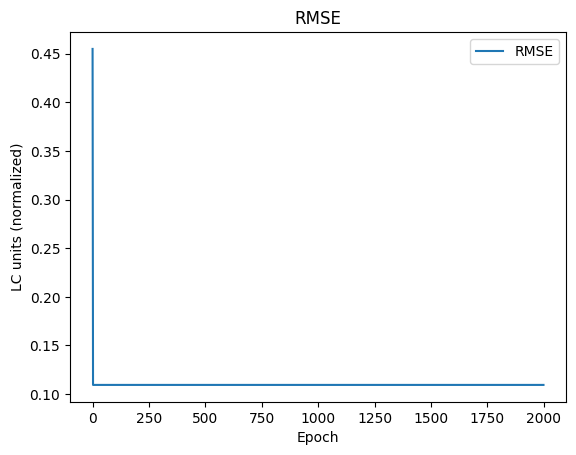

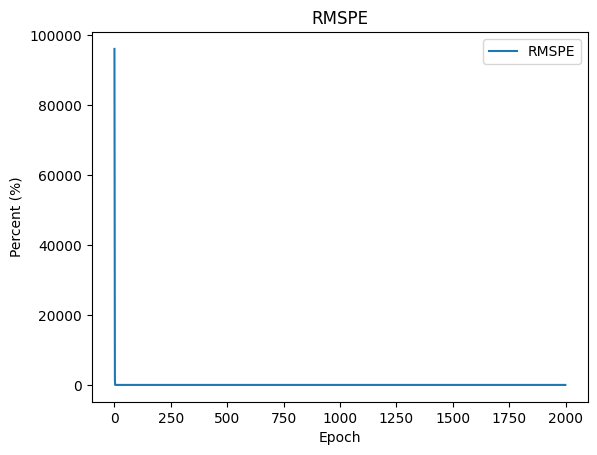

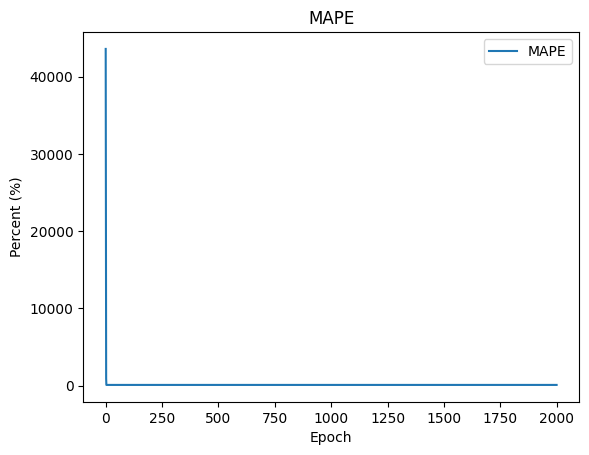

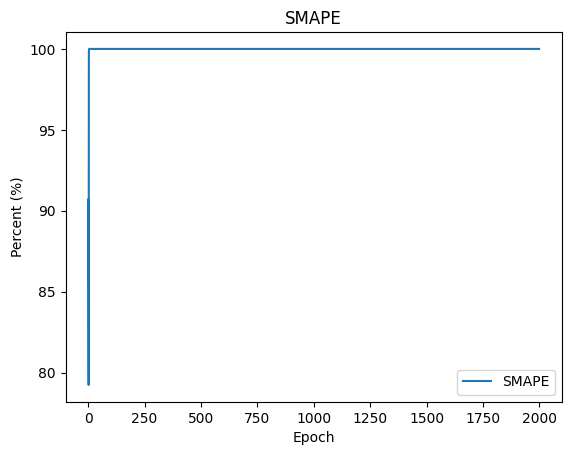

In [ ]:
plot_train_results(history)

## Testing

### Predict

In [ ]:
# cA
n_features = X_test.shape[2]
preds = predict_all(model, X_test)

### Denormalize

In [ ]:
# fit scaler on data and apply transform
scaler.fit(lc.reshape(-1,1))

MinMaxScaler()

In [ ]:
# inverse transform
inverse_y_test = scaler.inverse_transform(np.array(y_test).reshape(-1,1))
inverse_preds = scaler.inverse_transform(np.array(preds).reshape(-1,1))

### Calculate cumulative sum

In [ ]:
y_test_cumsum = np.cumsum(y_test)
preds_cumsum = np.cumsum(preds)

In [ ]:
inverse_y_test_cumsum = np.cumsum(inverse_y_test.T[0])
inverse_preds_cumsum = np.cumsum(inverse_preds.T[0])

### Plot prediction results

In [ ]:
plt.title('Normalized predictions')
plt.plot(y_test)
plt.plot(preds)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized predictions')
plt.plot(inverse_y_test)
plt.plot(inverse_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Normalized cumsum predictions')
plt.plot(y_test_cumsum)
plt.plot(preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units (normalized)')
plt.legend(['Truth', 'Prediction'])
plt.show()

plt.title('Denormalized cumsum predictions')
plt.plot(inverse_y_test_cumsum)
plt.plot(inverse_preds_cumsum)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

## Evaluate

In [ ]:
#Normalized score
get_metrics(y_test, preds)

<ipython-input-5-ac05cdf69cac>:3: RuntimeWarning: divide by zero encountered in divide
  return 100 * K.sqrt(K.mean(K.square((y_true - y_pred) / y_true)))


[0.00036820373, 0.005662477, 0.019188635, inf, 98.702736, 99.99988]

In [ ]:
#Denormalized score
get_metrics(inverse_y_test.T[0], inverse_preds.T[0])

In [ ]:
#Normalized cumsum score
get_metrics(y_test_cumsum, preds_cumsum)

In [ ]:
#Denormalized cumsum score
get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)

In [ ]:
result_list.append(['db'+num, get_metrics(inverse_y_test.T[0], inverse_preds.T[0]), get_metrics(inverse_y_test_cumsum, inverse_preds_cumsum)])

## Future Prediction

In [ ]:
sum_lc = np.sum(lc)

In [ ]:
sum_lc = np.sum(lc)
future_preds = lc
temp_arr = y[len(y)-7:]

'''while sum_lc < 1:
  temp_arr_1 = temp_arr.reshape((1, n_steps, n_features))
  temp_arr = np.append(temp_arr, model.predict(temp_arr_1, verbose=0)[0])
  future_preds = np.append(future_preds, scaler.inverse_transform(model.predict(temp_arr_1, verbose=0)[0].reshape(-1,1)).T[0])
  sum_lc = np.sum(future_preds)
  temp_arr = temp_arr[1:]
  print(len(future_preds), sum_lc)

print(len(future_preds))'''

In [ ]:
plt.title('Future predictions')
plt.plot(future_preds)
plt.xlabel('Data points')
plt.ylabel('LC units')
plt.legend(['Truth', 'Prediction'])
plt.show()

In [ ]:
workbook = xlsxwriter.Workbook('Future_Preditcions_db'+num+'.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0

for item in future_preds:
  worksheet.write(row, column, item)
  row += 1

workbook.close()


In [ ]:
#!cp "/content/Future_Preditcions_db"$num".xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

## Save model

In [ ]:
model.save('model')

In [ ]:
!zip -r "/content/db"$num"_ODA_cnn_lstm.zip" "/content/model"

  adding: content/model/ (stored 0%)
  adding: content/model/saved_model.pb (deflated 89%)
  adding: content/model/fingerprint.pb (stored 0%)
  adding: content/model/keras_metadata.pb (deflated 90%)
  adding: content/model/assets/ (stored 0%)
  adding: content/model/variables/ (stored 0%)
  adding: content/model/variables/variables.index (deflated 68%)
  adding: content/model/variables/variables.data-00000-of-00001 (deflated 15%)


In [ ]:
!cp "/content/db"$num"_ODA_cnn_lstm.zip" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"

# Save results

In [ ]:
result_list

In [ ]:
workbook = xlsxwriter.Workbook('result.xlsx')
worksheet = workbook.add_worksheet()

row = 0
column = 0


for item in result_list:
    worksheet.write(row, column, "CNN/LSTM")
    row += 1
    for res1 in item[1]:
      worksheet.write(row, column, res1)
      row += 1
    worksheet.write(row, column, "CNN/LSTM")
    row += 1
    for res2 in item[2]:
      worksheet.write(row, column, res2)
      row += 1

workbook.close()


In [ ]:
!cp "/content/result.xlsx" "/content/drive/My Drive/University/Battery Life Predictor/Trained models/One day ahead/CNN_LSTM/"